In [1]:
import brian2 as b2 # used for neural simulation
from brian2 import *

import numpy as np # used for array operations
from scipy.stats import poisson, binom, f, multivariate_normal, stats # used for stats (mean, s.d.)
from scipy import stats
from scipy.special import gammaln

import matplotlib.pyplot as plt # used for plotting
from matplotlib import gridspec
import matplotlib.colors as mcolors
from matplotlib.lines import Line2D

import math
import random
import warnings
import json

b2.prefs.codegen.target = "numpy" # set Brian2 to use numpy backend

# from sklearn.feature_selection import f_classif
# from brian2 import NeuronGroup, Synapses, PoissonGroup, SpikeMonitor, run, ms, Hz, PoissonInput, clear_cache, device, get_unit, second

In [2]:
# %run neural_simulation_functions.ipynb

In [3]:
#import the python file
# once everything is good run this

from neural_simulation_functions import *

Parameters.

In [5]:
num_neurons = 10 # try 10 just to see covariance matrices
rate = 30 # change back to 10
rates = np.linspace(31, 40, num_neurons) # change back to np.linspace(5, 14, num_neurons)
time = 1000
num_samples = 100 # change to 100 to show Alex next time, but plot the first five trajectories or random five 
t0 = 200
time_points = np.arange(0, 1000)

In [6]:
rates

array([31., 32., 33., 34., 35., 36., 37., 38., 39., 40.])

In [7]:
# Single rate absolute (perturbation magnitude with rate): std_dev = perturbation_magnitude * base_rates[neuron]
perturbed_rate1 = generate_perturbed_rates(num_neurons, rate, perturbation_magnitude = 0.1, absolute=True)
# each neuron has a rate of 10 hz
print(perturbed_rate1)

[26.90013189 34.54313299 26.63573329 30.13131874 26.80595264 22.70744972
 28.41051807 29.23356068 29.62118986 29.89455374]


In [8]:
# Single rate relative (perturbation magnitude without rate): std_dev = perturbation_magnitude
perturbed_rate2 = generate_perturbed_rates(num_neurons, rate, perturbation_magnitude = 0.1, absolute=False)
# each neuron has a rate of 10 hz
print(perturbed_rate2)

[29.90657482 29.93186538 29.82023306 29.94858305 30.03173432 30.05870372
 30.06544442 29.87281996 30.09265695 30.11880789]


In [9]:
# Multi rate absolute (perturbation magnitude with rate): std_dev = perturbation_magnitude * base_rates[neuron]
perturbed_rates1 = generate_perturbed_rates(num_neurons, rates, perturbation_magnitude = 0.1, absolute=True)
print(perturbed_rates1)

[29.46682136 33.72373451 32.94236191 32.57939521 31.73946864 33.19979229
 30.55504275 34.24923419 34.92761794 40.79998942]


In [10]:
# Multi rate relative (perturbation magnitude without rate): std_dev = perturbation_magnitude
perturbed_rates2 = generate_perturbed_rates(num_neurons, rates, perturbation_magnitude = 0.1, absolute=False)
print(perturbed_rates2)

[30.88277935 31.86307062 32.87807748 34.04702066 34.92076505 35.78916673
 37.04084307 37.89400668 39.04621718 39.84087173]


In [11]:
# Simulation control parameters

# Network parameters
N_E = 1000
#gamma = 0.25                    # ratio of inhibitory to excitatory neurons
#N_I = round(gamma * N_E)
#N = N_E + N_I
epsilon = 0.5                   # Sparsity of connections.  changed from 0.1, 0.2 was fine...
#C_E = epsilon * N_E             # number of excitatory connections per neuron
#C_ext = C_E                     # external connections per neuron


# Neuron parameters
#tau = 20  * ms                  # Membrane time constant. previously 20, tried 50 it was weird, larger numbers more spikes, smaller numbers less spikes
                                # Higher Tau means slower decay, more spikes.
                                # Lower Tau means faster decay, fewer spikes
#theta = 20  * mV                # spike threshold voltage, neuron fires when hitting this value
#V_r = 10  * mV                  # reset potential, voltage neuron goes back to after firing
#tau_rp = 2  * ms                # refractory period (neuron needs to wait some time before spiking again)

# Synapse parameters
#J = 0.1 * mV                    # Synaptic strength # Previously 0.1 * mV, previouysly 0.075, 0.2 was too varied need to be more consistent
                                # larger J, stronger synaptic input, higher firing rate
                                # smaller J, weaker input, lower firing rates
#D = 1.5  * ms                   # synaptic delay, time between a pre spike and its effect on postsynap neuron

# Simulation settings
#dt = 0.1  * ms
g = 4                           # g is a good control for manipulating the firing rate, smaller numbers more spikes, bigger numbers less spikes
                                # Higher g, stronger inhibition, suppresses network activity
                                # Lower g, weaker inhibition, increase network activity
nu_ext_over_nu_thr = 1          # Previously 2, 1.2 was weird, 1 (made 2d plot nice), 0.5 not good,
# t_range = [1000, 1200]
# rate_range = [0, 200]
# rate_tick_step = 50

#nu_thr = theta / (J * C_E * tau) # minimal input rate needed to reach threshold
#nu_ext = nu_ext_over_nu_thr * nu_thr # external input rate

# adjust g and nu_ext so that nu_ext is approximately the number of spikes that are occuring, influenced by g. 
# epsilon 0.2 and g = 2.6, g = 2.8 is too much,tau = 50
# epsilon 0.5 and g = 4, tau = 20

Generating spike trains, then counting the spikes.

In [13]:
raw_spike_train = independent_poisson_processes(num_neurons, rate, time, num_samples)
# print(raw_spike_train)

In [14]:
save_spike_trains(raw_spike_train, "spike_trains.json")
loaded_spike_trains = load_spike_trains("spike_trains.json")
# print(loaded_spike_trains)

Spike trains saved to spike_trains.json


In [15]:
spike_train = standardize_units(raw_spike_train)
# print(spike_train)

In [16]:
raw_multi_rate_spike_train = multivariate_constant_poisson(num_neurons, rates, time, num_samples)

WARNING    'rates' is an internal variable of group 'poissongroup', but also exists in the run namespace with the value array([31., 32., 33., 34., 35., 36., 37., 38., 39., 40.]). The internal variable will be used. [brian2.groups.group.Group.resolve.resolution_conflict]


In [17]:
save_spike_trains(raw_multi_rate_spike_train, "multi_rate_spike_trains.json")
loaded_spike_trains = load_spike_trains("multi_rate_spike_trains.json")

Spike trains saved to multi_rate_spike_trains.json


In [18]:
multi_rate_spike_train = standardize_units(raw_multi_rate_spike_train)

In [19]:
raw_perturbed_rate_spike_train = multivariate_constant_poisson(num_neurons, perturbed_rates1, time, num_samples)

WARNING    'rates' is an internal variable of group 'poissongroup', but also exists in the run namespace with the value array([29.46682136, 33.72373451, 32.94236191, 32.57939521, 31.73946864,
       33.19979229, 30.55504275, 34.24923419, 34.92761794, 40.79998942]). The internal variable will be used. [brian2.groups.group.Group.resolve.resolution_conflict]


In [20]:
save_spike_trains(raw_perturbed_rate_spike_train, "perturbed_rate_spike_trains.json")
loaded_spike_trains = load_spike_trains("perturbed_rate_spike_trains.json")

Spike trains saved to perturbed_rate_spike_trains.json


In [21]:
perturbed_rate_spike_train = standardize_units(raw_perturbed_rate_spike_train)

In [22]:
# first_spike = find_nth_earliest_spike(spike_train, n=2)

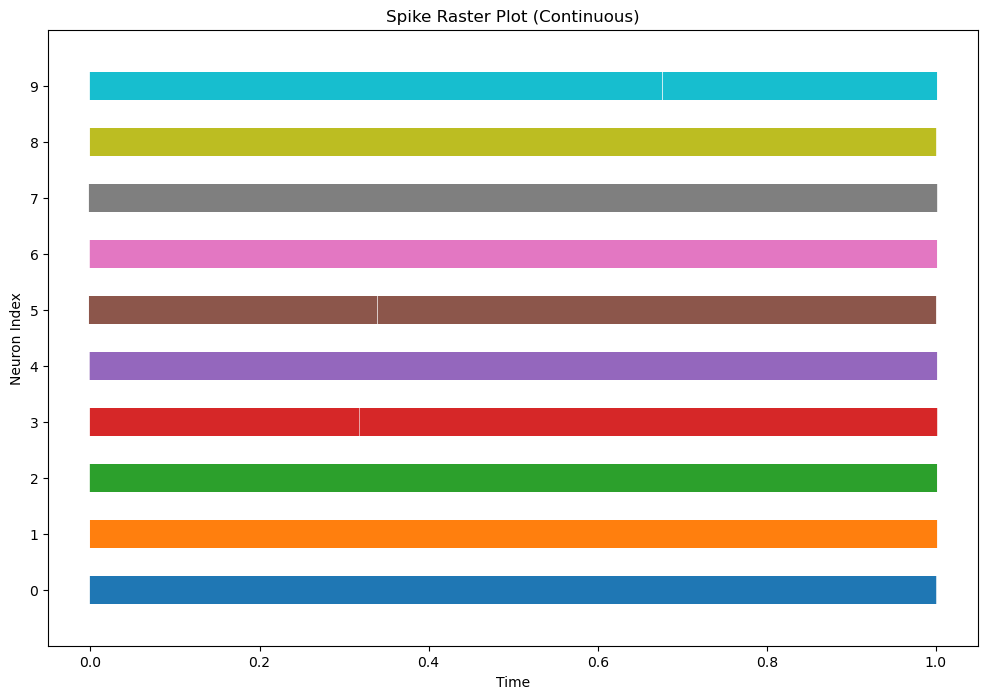

In [23]:
raster_plot(spike_train, colors=None, linelengths=None, figsize=(12,8))

In [24]:
binary_spikes = spikes_to_binary(spike_train, num_neurons, time)
multi_rate_binary_spikes = spikes_to_binary(multi_rate_spike_train, num_neurons, time)
perturbed_rate_binary_spikes = spikes_to_binary(perturbed_rate_spike_train, num_neurons, time)

In [25]:
spike_count = count_spikes(binary_spikes)
count = np.array(spike_count)
# print(count)
# print(count.shape)
multi_rate_spike_count = count_spikes(multi_rate_binary_spikes)
multi_rate_count = np.array(multi_rate_spike_count)

perturbed_rate_spike_count = count_spikes(perturbed_rate_binary_spikes)
perturbed_rate_count = np.array(perturbed_rate_spike_count)

In [26]:
random_indices = np.random.choice(count.shape[0], size=5, replace=False)  # No duplicates
random_samples = count[random_indices]  # Shape: (5, neurons, time)

Getting spike trains from excitatory and inhibitory neurons, then counting the spikes.

In [28]:
# results = sim(params["g"], params["nu_ext_over_nu_thr"], params["t_range"][1] * ms, ax_spikes, ax_rates, params["rate_tick_step"], num_neurons, num_samples)
results = sim(N_E, epsilon, g, nu_ext_over_nu_thr, time, num_neurons, num_samples)

raw_excitatory_spike_trains = results['excitatory']['spike_trains']
raw_inhibitory_spike_trains = results['inhibitory']['spike_trains']
# print(raw_excitatory_spike_trains)

In [29]:
save_spike_trains(raw_excitatory_spike_trains, "spike_trains_ex.json")
loaded_spike_trains_ex = load_spike_trains("spike_trains_ex.json")

save_spike_trains(raw_inhibitory_spike_trains, "spike_trains_in.json")
loaded_spike_trains_in = load_spike_trains("spike_trains_in.json")

Spike trains saved to spike_trains_ex.json
Spike trains saved to spike_trains_in.json


In [30]:
excitatory_spike_trains = standardize_units(raw_excitatory_spike_trains)
inhibitory_spike_trains = standardize_units(raw_inhibitory_spike_trains)

#print(excitatory_spike_trains[0])
#print(inhibitory_spike_trains[0])

In [31]:
#first_spike_ex = find_nth_earliest_spike(excitatory_spike_trains, n=2)
#first_spike_in = find_nth_earliest_spike(inhibitory_spike_trains, n=2)

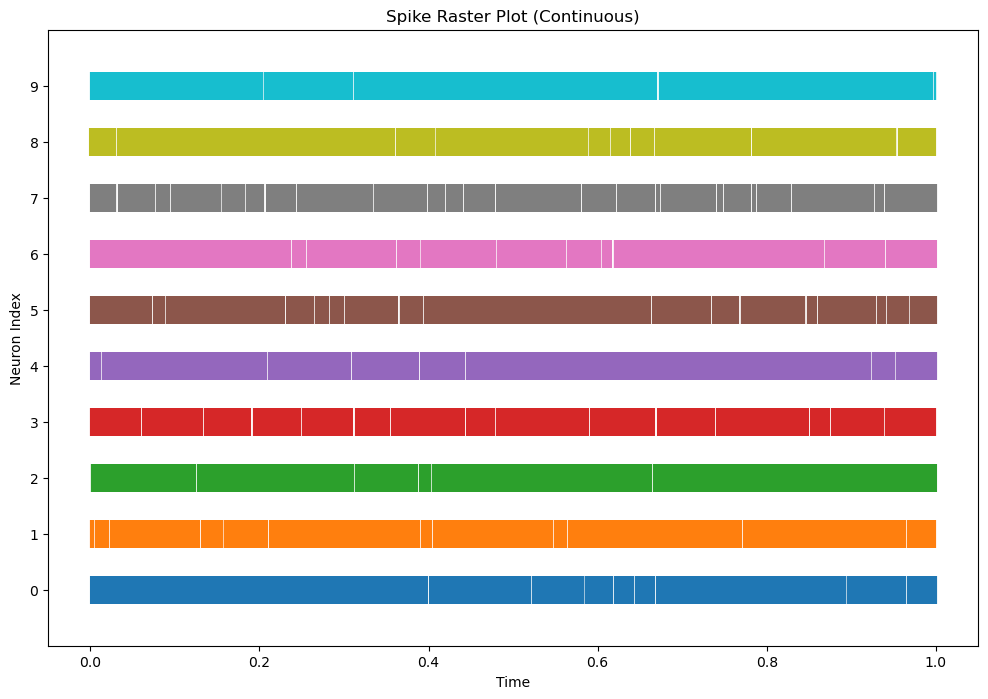

In [32]:
raster_plot(excitatory_spike_trains, colors=None, linelengths=None, figsize=(12,8))

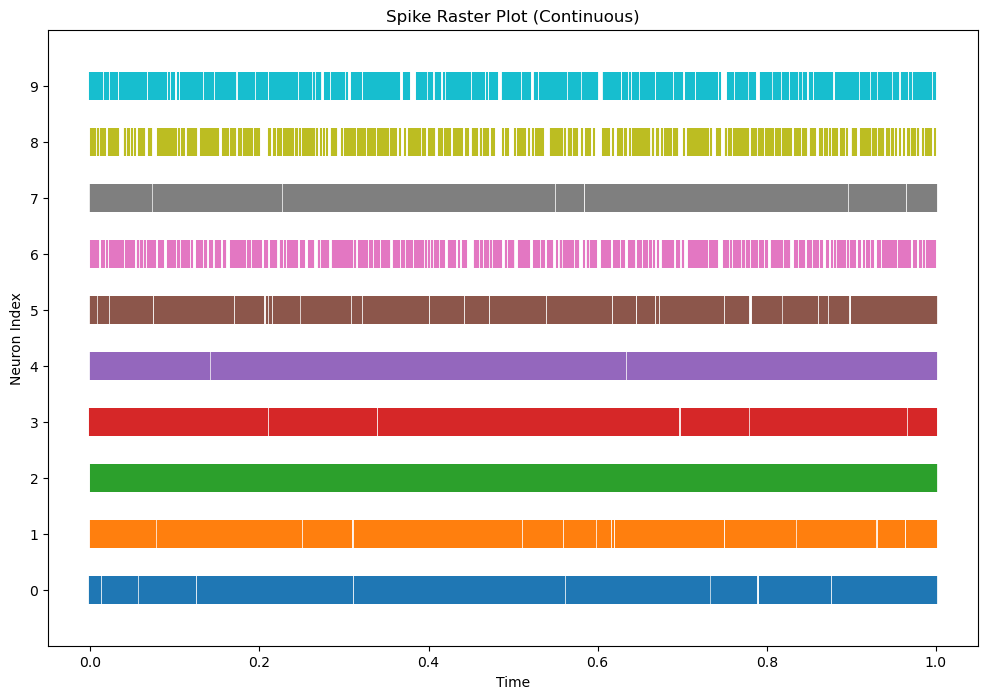

In [33]:
raster_plot(inhibitory_spike_trains, colors=None, linelengths=None, figsize=(12,8))

In [34]:
binary_ex_spikes = spikes_to_binary(excitatory_spike_trains, num_neurons, time)
binary_in_spikes = spikes_to_binary(inhibitory_spike_trains, num_neurons, time)
# print(binary_ex_spikes[0][0]) # first sample of first neuron

In [35]:
spike_count_ex = count_spikes(binary_ex_spikes)
count_ex = np.array(spike_count_ex)
#print(spike_count_ex[0])
#print(count_ex[0])
#print(count_ex[1])
#print(count_ex.shape)

spike_count_in = count_spikes(binary_in_spikes)
count_in = np.array(spike_count_in)
#print(count_in.shape)

In [36]:
random_indices_ex = np.random.choice(count_ex.shape[0], size=5, replace=False)  # No duplicates
random_samples_ex = count_ex[random_indices_ex]  # Shape: (5, neurons, time)

random_indices_in = np.random.choice(count_in.shape[0], size=5, replace=False)  # No duplicates
random_samples_in = count_in[random_indices_in]  # Shape: (5, neurons, time)

Theoretical and Empirical stats of raw counts.

In [38]:
# empirical_mean = empirical_means(count) # np.mean(count, axis=0), count.mean(axis=0)
empirical_mean = count.mean(axis=0)
#print(empirical_mean.shape)
count_rate = empirical_mean[:, -1]
#print(count_rate.shape)
#print(empirical_mean)
#print(empirical_mean.shape)
#print(count_rate)

# empirical_std_dev = std_dev_empirical_mean(empirical_mean, num_samples, count)
empirical_std_dev = np.sqrt(empirical_mean) #count.std(axis=0, ddof=1)
# empirical_std_dev = (count.std(axis=0)) #newly added, should be the same but isn't
# i fixed the above by using empirical_std_dev = (count.std(axis=0, ddof=1))
#print(empirical_std_dev)
#print(empirical_std_dev.shape)

empirical_lower_bound, empirical_upper_bound = confidence_intervals(empirical_mean, empirical_std_dev, num_samples, confidence_level=0.95)
# print(empirical_lower_bound)
# print(empirical_upper_bound)

In [39]:
multi_rate_empirical_mean = multi_rate_count.mean(axis=0)
multi_rate_count_rate = multi_rate_empirical_mean[:, -1]
multi_rate_empirical_std_dev = np.sqrt(multi_rate_empirical_mean) #count.std(axis=0, ddof=1)

multi_rate_empirical_lower_bound, multi_rate_empirical_upper_bound = confidence_intervals(multi_rate_empirical_mean, multi_rate_empirical_std_dev, num_samples, confidence_level=0.95)

In [40]:
perturbed_rate_empirical_mean = perturbed_rate_count.mean(axis=0)
perturbed_rate_count_rate = perturbed_rate_empirical_mean[:, -1]
perturbed_rate_empirical_std_dev = np.sqrt(perturbed_rate_empirical_mean) #count.std(axis=0, ddof=1)

perturbed_rate_empirical_lower_bound, perturbed_rate_empirical_upper_bound = confidence_intervals(perturbed_rate_empirical_mean, perturbed_rate_empirical_std_dev, num_samples, confidence_level=0.95)

In [41]:
exclude_times, global_exclude = last_zero_std_time(empirical_std_dev, verbose=True)

Neuron 0: last zero std at t=-1, recommended exclude=0
Neuron 1: last zero std at t=0, recommended exclude=1
Neuron 2: last zero std at t=-1, recommended exclude=0
Neuron 3: last zero std at t=-1, recommended exclude=0
Neuron 4: last zero std at t=-1, recommended exclude=0
Neuron 5: last zero std at t=-1, recommended exclude=0
Neuron 6: last zero std at t=-1, recommended exclude=0
Neuron 7: last zero std at t=-1, recommended exclude=0
Neuron 8: last zero std at t=-1, recommended exclude=0
Neuron 9: last zero std at t=-1, recommended exclude=0

Global exclude (safest): t=1


In [42]:
multi_rate_exclude_times, multi_rate_global_exclude = last_zero_std_time(multi_rate_empirical_std_dev, verbose=True)

Neuron 0: last zero std at t=-1, recommended exclude=0
Neuron 1: last zero std at t=-1, recommended exclude=0
Neuron 2: last zero std at t=-1, recommended exclude=0
Neuron 3: last zero std at t=-1, recommended exclude=0
Neuron 4: last zero std at t=-1, recommended exclude=0
Neuron 5: last zero std at t=-1, recommended exclude=0
Neuron 6: last zero std at t=-1, recommended exclude=0
Neuron 7: last zero std at t=-1, recommended exclude=0
Neuron 8: last zero std at t=-1, recommended exclude=0
Neuron 9: last zero std at t=-1, recommended exclude=0

Global exclude (safest): t=0


In [43]:
perturbed_rate_exclude_times, perturbed_rate_global_exclude = last_zero_std_time(perturbed_rate_empirical_std_dev, verbose=True)

Neuron 0: last zero std at t=-1, recommended exclude=0
Neuron 1: last zero std at t=-1, recommended exclude=0
Neuron 2: last zero std at t=-1, recommended exclude=0
Neuron 3: last zero std at t=-1, recommended exclude=0
Neuron 4: last zero std at t=-1, recommended exclude=0
Neuron 5: last zero std at t=-1, recommended exclude=0
Neuron 6: last zero std at t=-1, recommended exclude=0
Neuron 7: last zero std at t=0, recommended exclude=1
Neuron 8: last zero std at t=-1, recommended exclude=0
Neuron 9: last zero std at t=-1, recommended exclude=0

Global exclude (safest): t=1


In [44]:
theoretical_means = calculate_theoretical_mean(count_rate, time)
#print(theoretical_means)
#print(theoretical_means.shape)

theoretical_std_dev = calculate_theoretical_std_dev(theoretical_means)
#print(theoretical_std_dev)
#print(theoretical_std_dev.shape)

theoretical_lower_bound, theoretical_upper_bound = confidence_intervals(theoretical_means, theoretical_std_dev, num_samples, confidence_level=0.95)
# print(theoretical_lower_bound)
# print(theoretical_upper_bound)

In [45]:
multi_rate_theoretical_means = calculate_theoretical_mean(multi_rate_count_rate, time)
multi_rate_theoretical_std_dev = calculate_theoretical_std_dev(multi_rate_theoretical_means)

multi_rate_theoretical_lower_bound, multi_rate_theoretical_upper_bound = confidence_intervals(multi_rate_theoretical_means, multi_rate_theoretical_std_dev, num_samples, confidence_level=0.95)

In [46]:
perturbed_rate_theoretical_means = calculate_theoretical_mean(perturbed_rate_count_rate, time)
perturbed_rate_theoretical_std_dev = calculate_theoretical_std_dev(perturbed_rate_theoretical_means)

perturbed_rate_theoretical_lower_bound, perturbed_rate_theoretical_upper_bound = confidence_intervals(perturbed_rate_theoretical_means, perturbed_rate_theoretical_std_dev, num_samples, confidence_level=0.95)

In [47]:
res_var = variance_of_residuals(empirical_mean, theoretical_means)
#print(res_var)

In [48]:
centers = center_counts_loop(count, theoretical_means, num_samples, num_neurons)

centers_mean = np.mean(centers, axis = 0)
centers_std_dev = np.std(centers, axis = 0, ddof = 1)

centers_emp = center_counts_loop(count, empirical_mean, num_samples, num_neurons)

centers_mean_emp = np.mean(centers_emp, axis = 0)
centers_std_dev_emp = np.std(centers_emp, axis = 0, ddof = 1)

In [49]:
multi_rate_centers = center_counts_loop(multi_rate_count, multi_rate_theoretical_means, num_samples, num_neurons)

multi_rate_centers_mean = np.mean(multi_rate_centers, axis = 0)
multi_rate_centers_std_dev = np.std(multi_rate_centers, axis = 0, ddof = 1)

multi_rate_centers_emp = center_counts_loop(multi_rate_count, multi_rate_empirical_mean, num_samples, num_neurons)

multi_rate_centers_mean_emp = np.mean(multi_rate_centers_emp, axis = 0)
multi_rate_centers_std_dev_emp = np.std(multi_rate_centers_emp, axis = 0, ddof = 1)

In [50]:
perturbed_rate_centers = center_counts_loop(perturbed_rate_count, perturbed_rate_theoretical_means, num_samples, num_neurons)

perturbed_rate_centers_mean = np.mean(perturbed_rate_centers, axis = 0)
perturbed_rate_centers_std_dev = np.std(perturbed_rate_centers, axis = 0, ddof = 1)

perturbed_rate_centers_emp = center_counts_loop(perturbed_rate_count, perturbed_rate_empirical_mean, num_samples, num_neurons)

perturbed_rate_centers_mean_emp = np.mean(perturbed_rate_centers_emp, axis = 0)
perturbed_rate_centers_std_dev_emp = np.std(perturbed_rate_centers_emp, axis = 0, ddof = 1)

Poisson Standardization 

In [52]:
stands = standardize_counts_loop(count, theoretical_means, theoretical_std_dev, num_samples, num_neurons, exclude = 1)
#print(stands)
#print(stands.shape)
# we removed the very first time point for this dataset

stands_emp = standardize_counts_loop(count, empirical_mean, empirical_std_dev, num_samples, num_neurons, global_exclude)
#print(stands_emp)
# cleaned_stands_emp = stands_emp[:, ~np.isnan(stands_emp).all(axis=0)]

#print(stands_emp.shape)
# we need to remove a few of the first time points for this dataset

# WHENEVER WE CHANGE TIME, WE NEED TO HAVE IT BE KNOWN, 

# when i do covariance, i should reshape from num_samples, num_neurons, time , assume poisson but not assume independent, the variance and covariance should be equal
# time to something with time as replicate. replicate (num_samples) times time in dimension, num_neurons
# covariance, num_neurons by num_neurons, data to produce this should be num_samples times num_neurons
# reformat the current matrix, use reshape with the matrix, maybe with loops 

standardized_mean_global = np.mean(stands)
standardized_std_global = np.std(stands)

standardized_mean_emp_global = np.mean(stands_emp)
standardized_std_emp_global = np.std(stands_emp)

standardized_mean = np.mean(stands, axis=0)
standardized_std = np.std(stands, axis=0, ddof = 1)

standardized_mean_emp = np.mean(stands_emp, axis = 0)
standardized_std_emp = np.std(stands_emp, axis = 0, ddof = 1)

In [53]:
has_negatives = np.any(stands < 0)
print(f"Array has negative numbers: {has_negatives}")
# this is why log-likelihood doesn't like me

Array has negative numbers: True


In [54]:
multi_rate_stands = standardize_counts_loop(multi_rate_count, multi_rate_theoretical_means, multi_rate_theoretical_std_dev, num_samples, num_neurons, exclude = 1)

multi_rate_stands_emp = standardize_counts_loop(multi_rate_count, multi_rate_empirical_mean, multi_rate_empirical_std_dev, num_samples, num_neurons, multi_rate_global_exclude)

multi_rate_standardized_mean_global = np.mean(multi_rate_stands)
multi_rate_standardized_std_global = np.std(multi_rate_stands)

multi_rate_standardized_mean_emp_global = np.mean(multi_rate_stands_emp)
multi_rate_standardized_std_emp_global = np.std(multi_rate_stands_emp)

multi_rate_standardized_mean = np.mean(multi_rate_stands, axis=0)
multi_rate_standardized_std = np.std(multi_rate_stands, axis=0, ddof = 1)

multi_rate_standardized_mean_emp = np.mean(multi_rate_stands_emp, axis = 0)
multi_rate_standardized_std_emp = np.std(multi_rate_stands_emp, axis = 0, ddof = 1)

In [55]:
perturbed_rate_stands = standardize_counts_loop(perturbed_rate_count, perturbed_rate_theoretical_means, perturbed_rate_theoretical_std_dev, num_samples, num_neurons, exclude = 1)

perturbed_rate_stands_emp = standardize_counts_loop(perturbed_rate_count, perturbed_rate_empirical_mean, perturbed_rate_empirical_std_dev, num_samples, num_neurons, perturbed_rate_global_exclude)

perturbed_rate_standardized_mean_global = np.mean(perturbed_rate_stands)
perturbed_rate_standardized_std_global = np.std(perturbed_rate_stands)

perturbed_rate_standardized_mean_emp_global = np.mean(perturbed_rate_stands_emp)
perturbed_rate_standardized_std_emp_global = np.std(perturbed_rate_stands_emp)

perturbed_rate_standardized_mean = np.mean(perturbed_rate_stands, axis=0)
perturbed_rate_standardized_std = np.std(perturbed_rate_stands, axis=0, ddof = 1)

perturbed_rate_standardized_mean_emp = np.mean(perturbed_rate_stands_emp, axis = 0)
perturbed_rate_standardized_std_emp = np.std(perturbed_rate_stands_emp, axis = 0, ddof = 1)

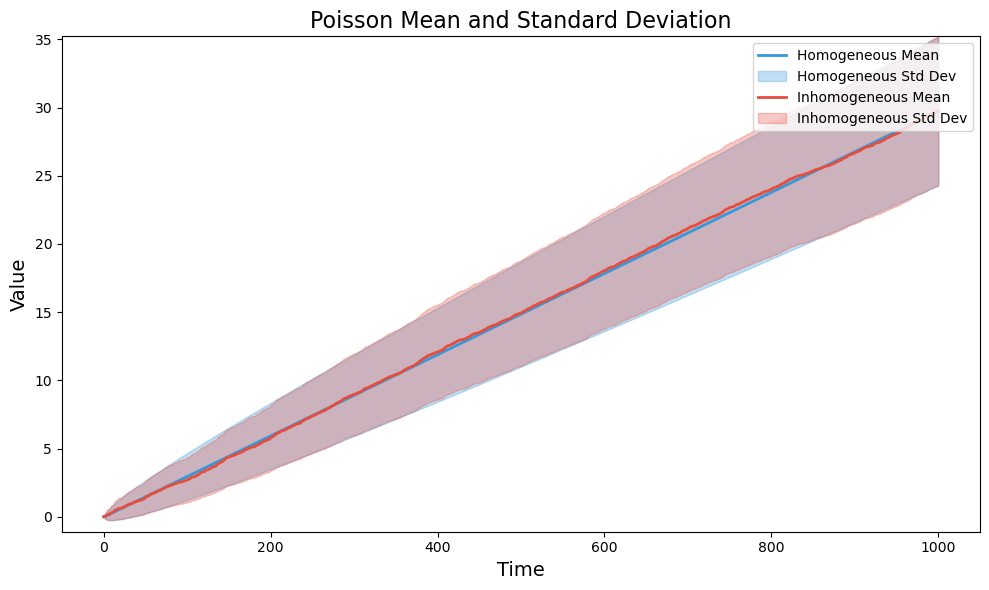

In [56]:
plot_stats(theoretical_means, empirical_mean, theoretical_std_dev, empirical_std_dev, title = 'Poisson Mean and Standard Deviation')

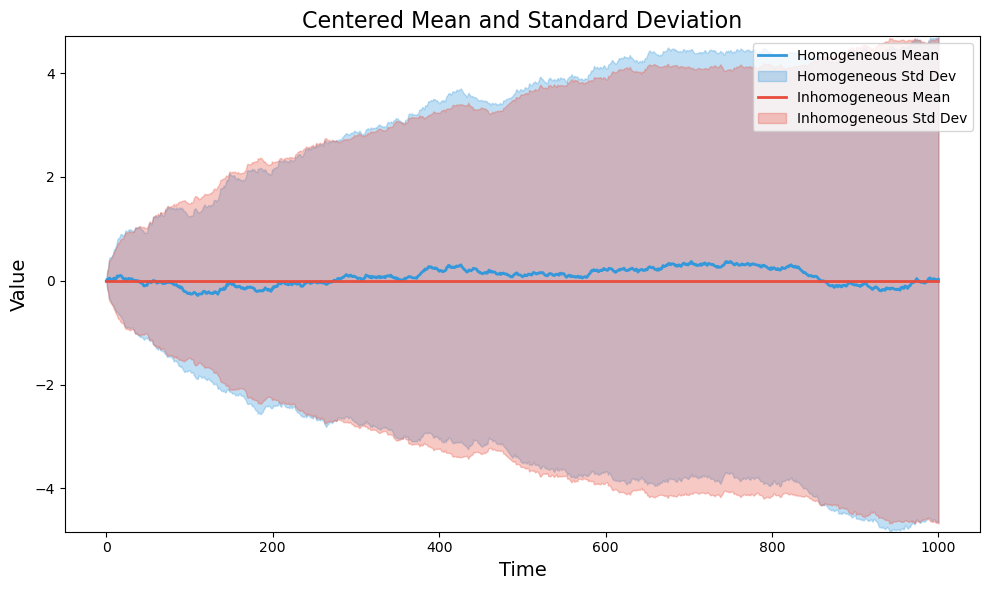

In [57]:
plot_stats(centers_mean, centers_mean_emp, centers_std_dev, centers_std_dev_emp, title = 'Centered Mean and Standard Deviation')

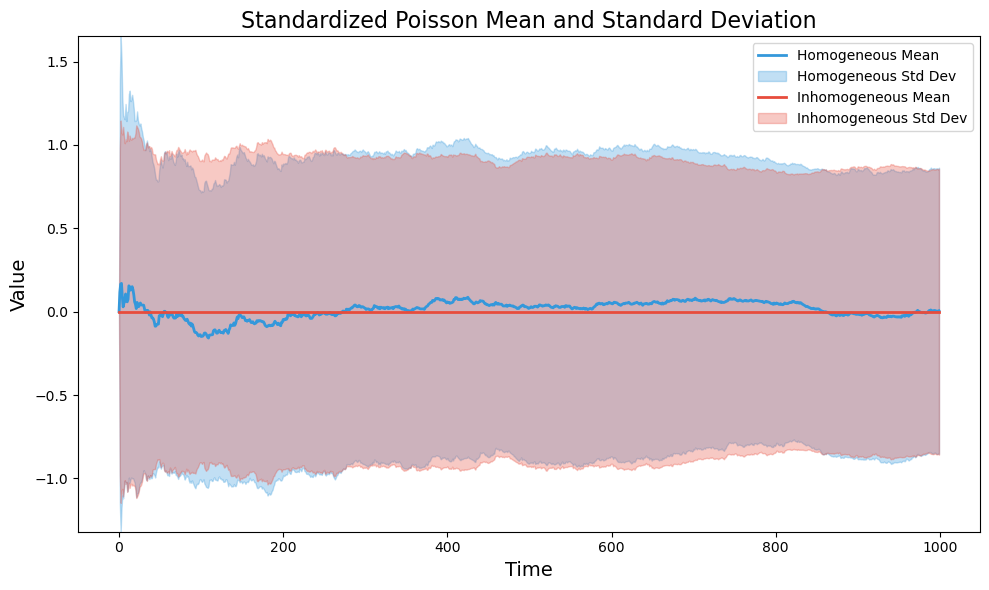

In [58]:
plot_stats(standardized_mean, standardized_mean_emp, standardized_std, standardized_std_emp, title = 'Standardized Poisson Mean and Standard Deviation')

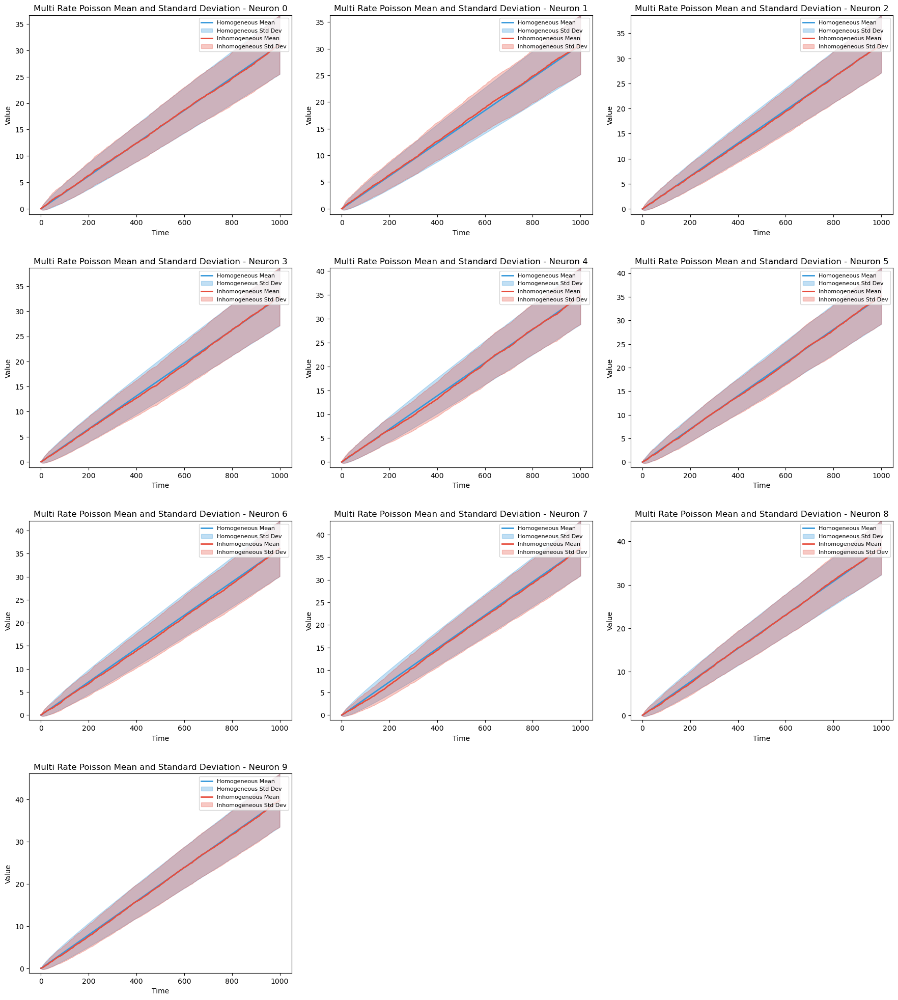

In [59]:
plot_multiple_stats(multi_rate_theoretical_means, multi_rate_empirical_mean, multi_rate_theoretical_std_dev, multi_rate_empirical_std_dev, title = 'Multi Rate Poisson Mean and Standard Deviation')
# Note in presentation highlight the difference y axis values between plots. For more precise plots we can go with isoclines.
# Aka lines with fixed probabilities

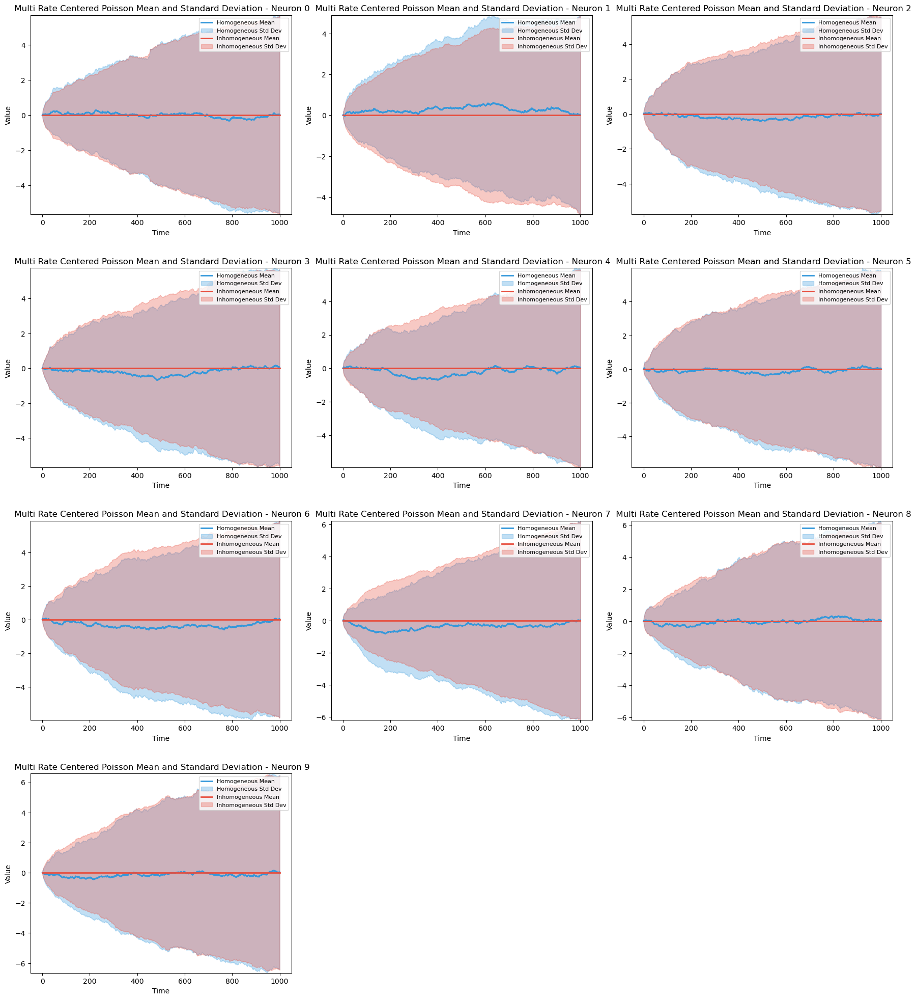

In [60]:
plot_multiple_stats(multi_rate_centers_mean, multi_rate_centers_mean_emp, multi_rate_centers_std_dev, multi_rate_centers_std_dev_emp, title = ' Multi Rate Centered Poisson Mean and Standard Deviation')
# Note in presentation highlight the difference y axis values between plots

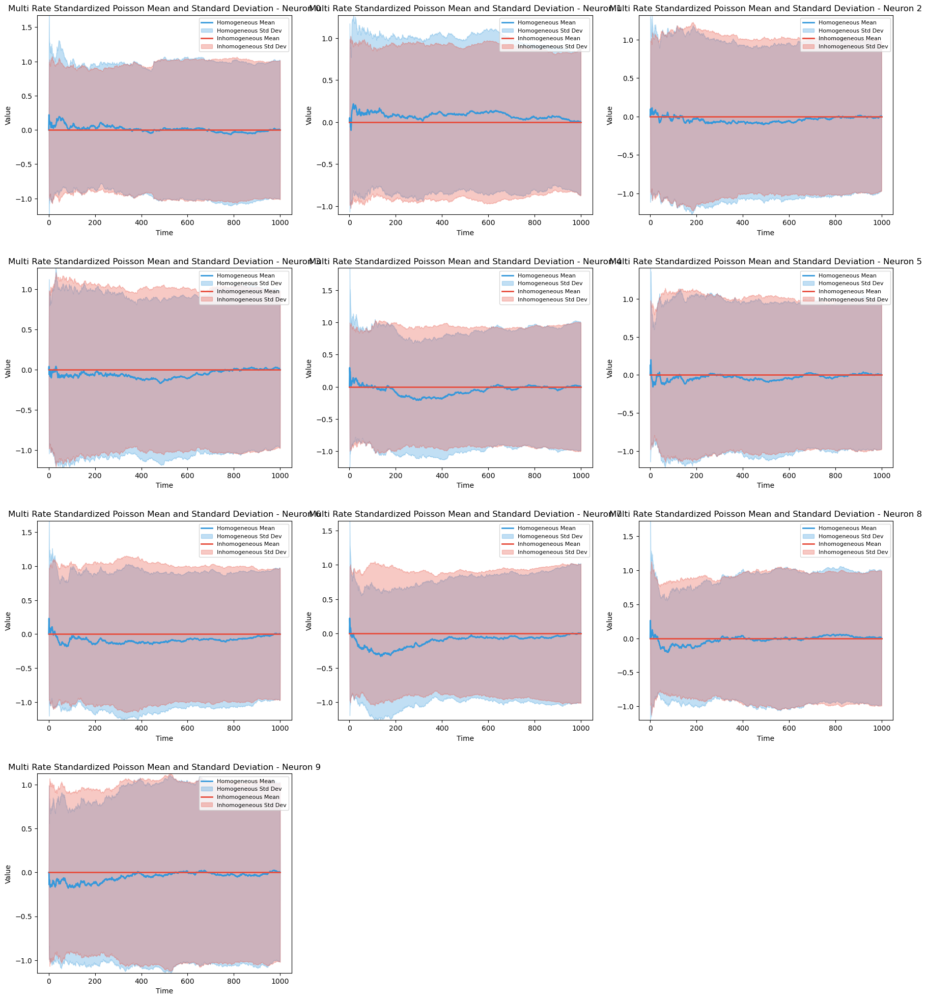

In [61]:
plot_multiple_stats(multi_rate_standardized_mean, multi_rate_standardized_mean_emp, multi_rate_standardized_std, multi_rate_standardized_std_emp, title = 'Multi Rate Standardized Poisson Mean and Standard Deviation')
# Note in presentation highlight the difference y axis values between plots

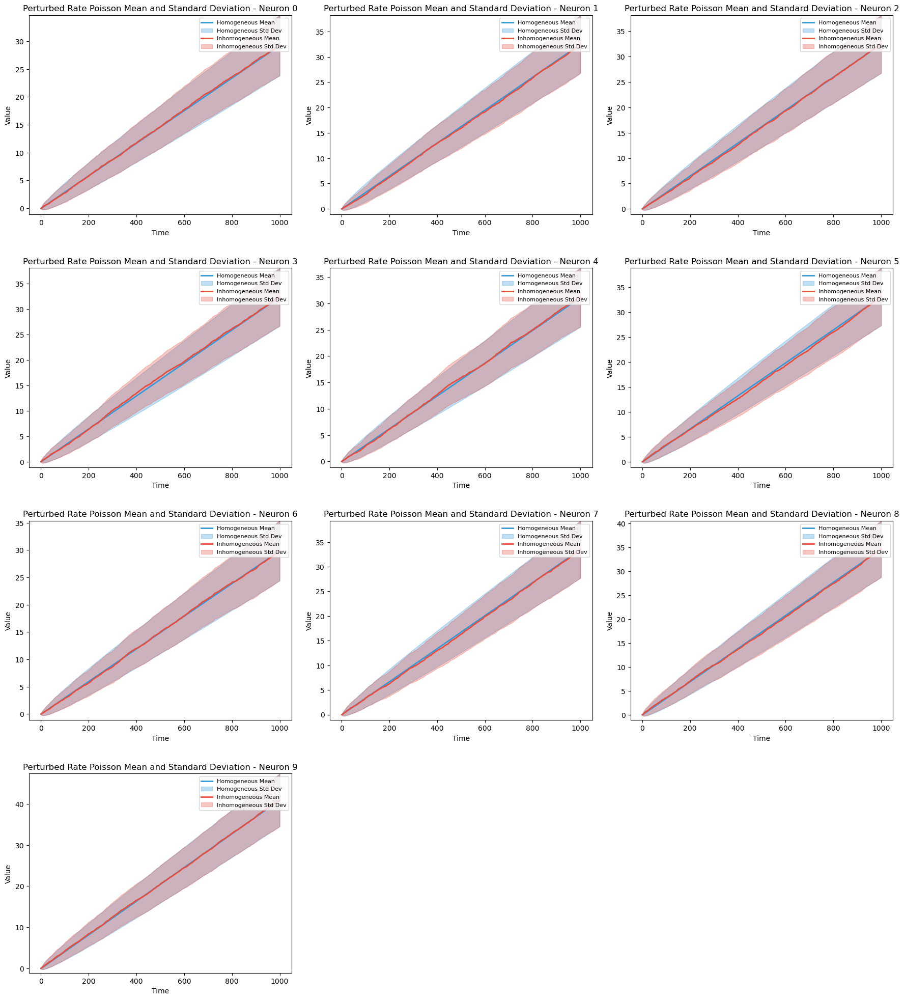

In [62]:
plot_multiple_stats(perturbed_rate_theoretical_means, perturbed_rate_empirical_mean, perturbed_rate_theoretical_std_dev, perturbed_rate_empirical_std_dev, title = 'Perturbed Rate Poisson Mean and Standard Deviation')
# Note in presentation highlight the difference y axis values between plots. For more precise plots we can go with isoclines.
# Aka lines with fixed probabilities

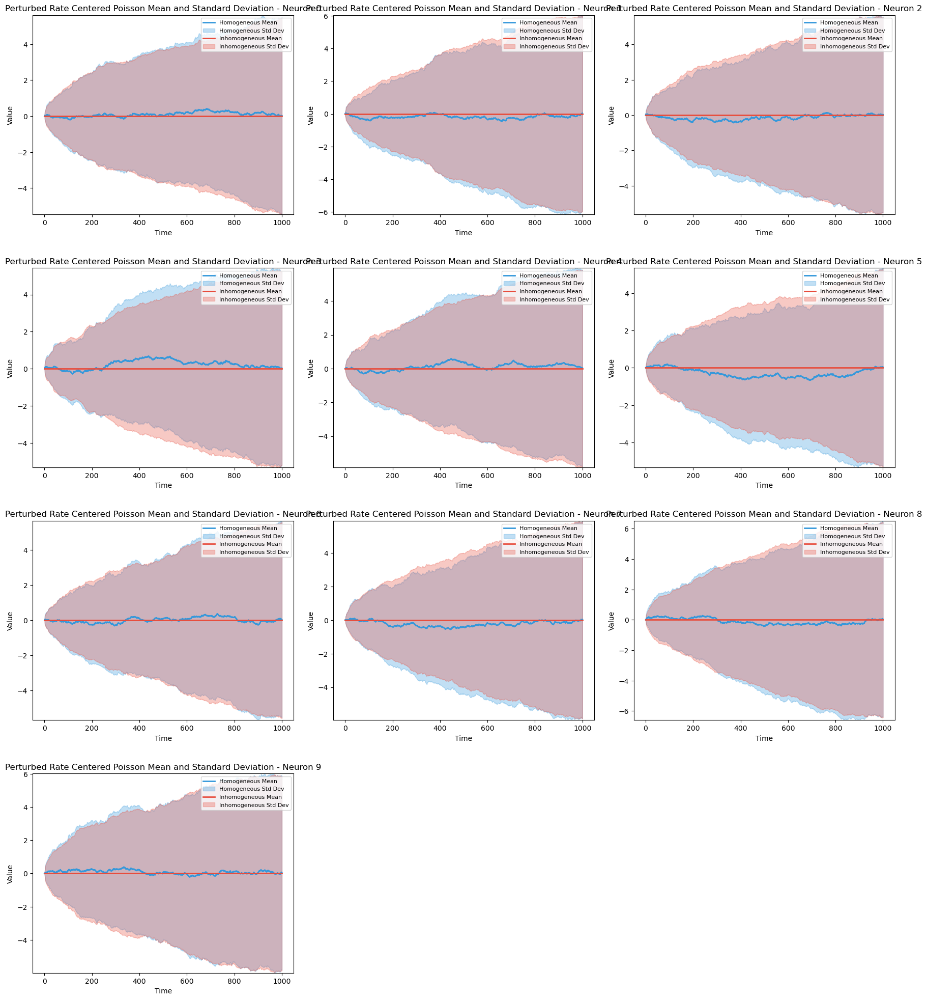

In [63]:
plot_multiple_stats(perturbed_rate_centers_mean, perturbed_rate_centers_mean_emp, perturbed_rate_centers_std_dev, perturbed_rate_centers_std_dev_emp, title = 'Perturbed Rate Centered Poisson Mean and Standard Deviation')
# Note in presentation highlight the difference y axis values between plots

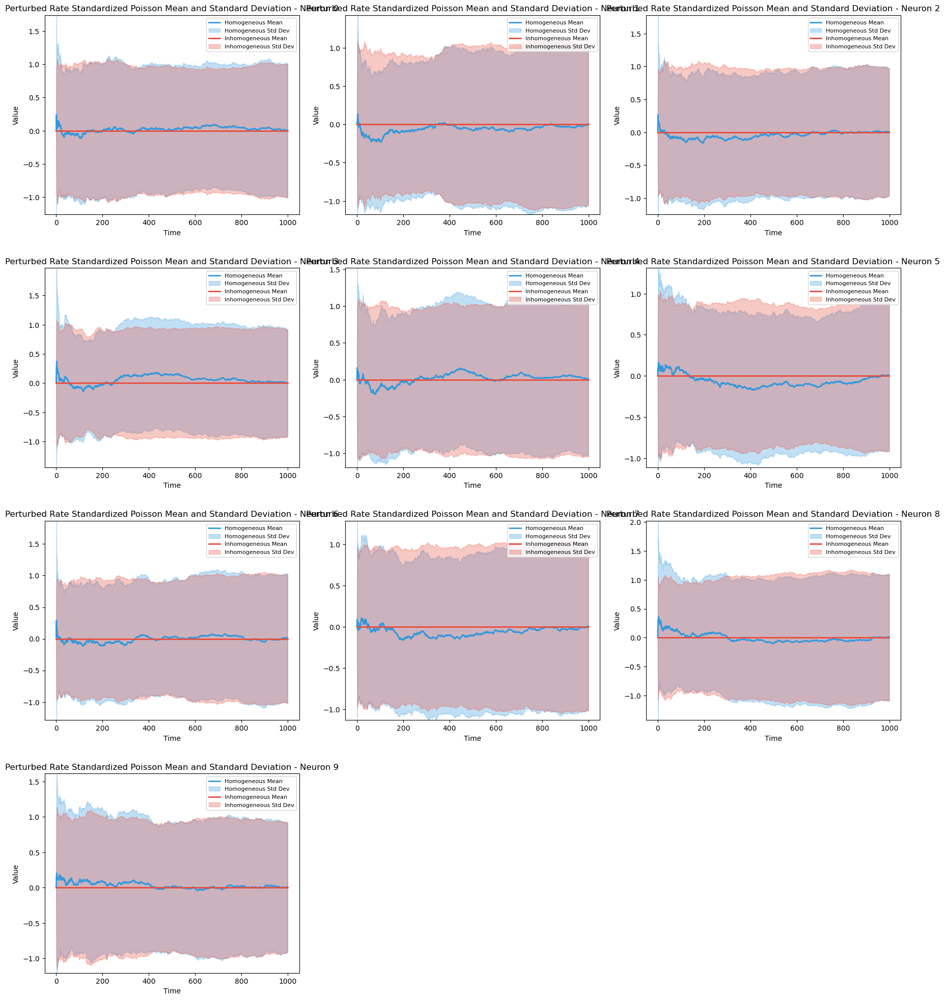

In [64]:
plot_multiple_stats(perturbed_rate_standardized_mean, perturbed_rate_standardized_mean_emp, perturbed_rate_standardized_std, perturbed_rate_standardized_std_emp, title = 'Perturbed Rate Standardized Poisson Mean and Standard Deviation')
# Note in presentation highlight the difference y axis values between plots

In [65]:
mean_check = check_mean_with_se(stands, expected_mean=0, confidence=0.95)
#print(mean_check)

mean_check_emp = check_mean_with_se(stands_emp, expected_mean=0, confidence=0.95)
#print(mean_check_emp)

In [66]:
multi_rate_mean_check = check_mean_with_se(multi_rate_stands, expected_mean=0, confidence=0.95)
multi_rate_mean_check_emp = check_mean_with_se(multi_rate_stands_emp, expected_mean=0, confidence=0.95)

In [67]:
perturbed_rate_mean_check = check_mean_with_se(perturbed_rate_stands, expected_mean=0, confidence=0.95)
perturbed_rate_mean_check_emp = check_mean_with_se(perturbed_rate_stands_emp, expected_mean=0, confidence=0.95)

In [68]:
serialized_count = serialize_counts(stands) # make serialize have an extra parameter that makes you drop the first n units [:,:,10:]
#print(serialized_count.shape)
#print(np.mean(serialized_count))
t_stat, p_val_mean = stats.ttest_1samp(serialized_count, np.mean(serialized_count))
#print(t_stat)
#print(p_val_mean)

    ## per neuron, check that is it doing per neuron
    ## check assumptions if i'm using count, check for data replicate and check for variables


serialized_count_emp = serialize_counts(stands_emp)
#print(serialized_count_emp.shape)
#print(np.mean(serialized_count_emp))
t_stat_emp, p_val_mean_emp = stats.ttest_1samp(serialized_count, np.mean(serialized_count))
#print(t_stat_emp)
#print(p_val_mean_emp)

In [69]:
multi_rate_serialized_count = serialize_counts(multi_rate_stands) # make serialize have an extra parameter that makes you drop the first n units [:,:,10:]
multi_rate_t_stat, multi_rate_p_val_mean = stats.ttest_1samp(multi_rate_serialized_count, np.mean(multi_rate_serialized_count))

multi_rate_serialized_count_emp = serialize_counts(multi_rate_stands_emp)

multi_rate_t_stat_emp, multi_rate_p_val_mean_emp = stats.ttest_1samp(multi_rate_serialized_count_emp, np.mean(multi_rate_serialized_count_emp))

In [70]:
perturbed_rate_serialized_count = serialize_counts(perturbed_rate_stands) # make serialize have an extra parameter that makes you drop the first n units [:,:,10:]
perturbed_rate_t_stat, perturbed_rate_p_val_mean = stats.ttest_1samp(perturbed_rate_serialized_count, np.mean(perturbed_rate_serialized_count))

perturbed_rate_serialized_count_emp = serialize_counts(perturbed_rate_stands_emp)

perturbed_rate_t_stat_emp, perturbed_rate_p_val_mean_emp = stats.ttest_1samp(perturbed_rate_serialized_count_emp, np.mean(perturbed_rate_serialized_count_emp))

In [71]:
#reshaped_stands = np.reshape(stands, (-1, stands.shape[1]), order='F')
# reshaped_stands = stands.transpose(1, 0, 2).reshape(stands.shape[1], -1)
reshaped_stands = np.transpose(stands, (1, 0, 2)).reshape(stands.shape[1], -1)
# transpose_stands = np.transpose(stands, (1, 0, 2))
#print(stands.shape)
#print(reshaped_stands.shape)

#reshaped_stands_emp = np.reshape(stands_emp, (-1, stands_emp.shape[1]), order='F')
# reshaped_stands_emp = stands.transpose(1, 0, 2).reshape(stands_emp.shape[1], -1)
reshaped_stands_emp = np.transpose(stands_emp, (1, 0, 2)).reshape(stands_emp.shape[1], -1)
#print(stands_emp.shape)
#print(reshaped_stands_emp.shape)

In [72]:
multi_rate_reshaped_stands = np.transpose(multi_rate_stands, (1, 0, 2)).reshape(multi_rate_stands.shape[1], -1)
multi_rate_reshaped_stands_emp = np.transpose(multi_rate_stands_emp, (1, 0, 2)).reshape(multi_rate_stands_emp.shape[1], -1)

In [73]:
perturbed_rate_reshaped_stands = np.transpose(perturbed_rate_stands, (1, 0, 2)).reshape(perturbed_rate_stands.shape[1], -1)
perturbed_rate_reshaped_stands_emp = np.transpose(perturbed_rate_stands_emp, (1, 0, 2)).reshape(perturbed_rate_stands_emp.shape[1], -1)

In [74]:
#print(transpose_stands.shape)
#print(transpose_stands[:,:,0])

In [75]:
#print(transpose_stands[:,:,0:3])

In [76]:
#print(reshaped_stands.shape)
#print(reshaped_stands[:,0])

In [77]:
#print(reshaped_stands[:,:5])

In [78]:
#### TESTING #####

In [79]:
test_stand = standardize_per_neuron(count, exclude=global_exclude)


=== Post-standardization checks (excluded t < 1 ) ===
Max |mean|: 1.189e-16 (should be close to 0)
Max |std - 1|: 2.220e-16 (should be close to 0)


In [80]:
#print(test_stand.shape)

In [81]:
cov_matrix = cov_standardized_data(reshaped_stands)
cov_matrix_emp = cov_standardized_data(reshaped_stands_emp)

In [82]:
multi_rate_cov_matrix = cov_standardized_data(multi_rate_reshaped_stands)
multi_rate_cov_matrix_emp = cov_standardized_data(multi_rate_reshaped_stands_emp)

In [83]:
perturbed_rate_cov_matrix = cov_standardized_data(perturbed_rate_reshaped_stands)
perturbed_rate_cov_matrix_emp = cov_standardized_data(perturbed_rate_reshaped_stands_emp)

array([[ 0.84091633, -0.01403315, -0.09624269,  0.05795063, -0.04473793,
        -0.04207697,  0.0116056 , -0.04563021,  0.00521614,  0.02152581],
       [-0.01403315,  0.84194094,  0.03651041, -0.08512089,  0.01706153,
         0.0684696 ,  0.01516194,  0.14078038,  0.04604554, -0.00416388],
       [-0.09624269,  0.03651041,  0.93682316,  0.0255975 , -0.10154363,
         0.027667  , -0.08103855,  0.02729486,  0.00860205,  0.03246912],
       [ 0.05795063, -0.08512089,  0.0255975 ,  0.95884702,  0.00261557,
        -0.01824343, -0.11666201, -0.05786976,  0.03859481, -0.11819582],
       [-0.04473793,  0.01706153, -0.10154363,  0.00261557,  0.84894765,
        -0.08193371,  0.04300872, -0.01007676, -0.03648488, -0.07345876],
       [-0.04207697,  0.0684696 ,  0.027667  , -0.01824343, -0.08193371,
         0.95271567,  0.00552373,  0.05782709,  0.08065105,  0.1328546 ],
       [ 0.0116056 ,  0.01516194, -0.08103855, -0.11666201,  0.04300872,
         0.00552373,  1.02951493,  0.10120716

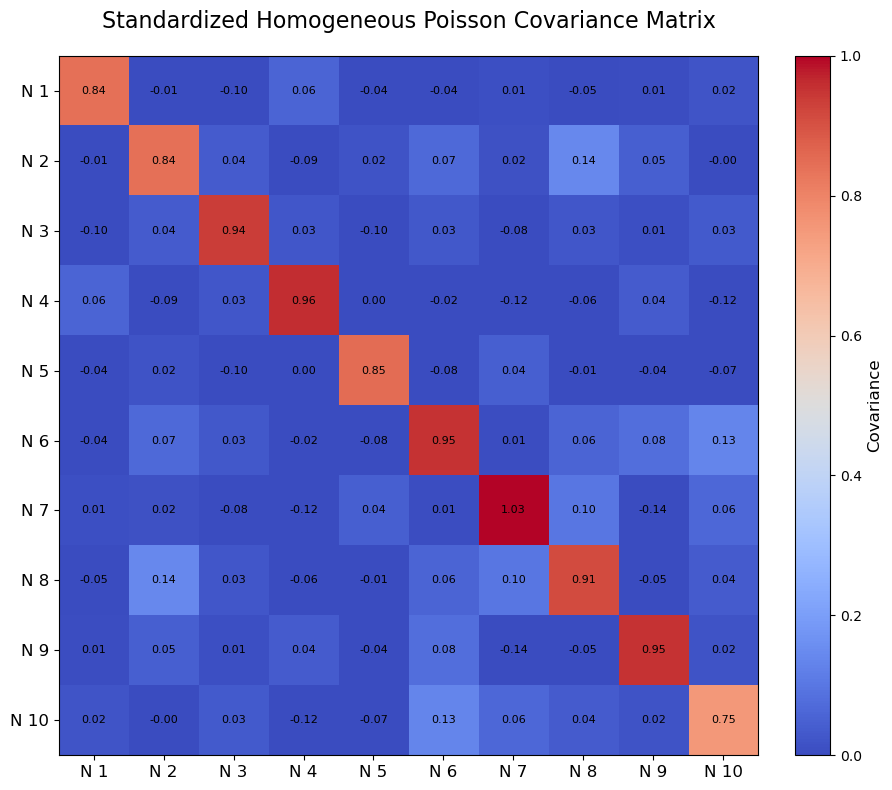

In [84]:
plot_covariance_matrix(cov_matrix, normalize=False, title='Standardized Homogeneous Poisson Covariance Matrix', cmap='coolwarm', annot=True, neuron_labels=None)

array([[ 0.8336856 , -0.01625275, -0.09504904,  0.05951944, -0.04535737,
        -0.04144303,  0.01018707, -0.04964744,  0.00526521,  0.02261704],
       [-0.01625275,  0.85192341,  0.0366367 , -0.08312183,  0.01755988,
         0.06923358,  0.01701425,  0.14016845,  0.0450182 , -0.0039276 ],
       [-0.09504904,  0.0366367 ,  0.94939397,  0.02634054, -0.10214599,
         0.0267639 , -0.07761013,  0.02437105,  0.00749838,  0.03189149],
       [ 0.05951944, -0.08312183,  0.02634054,  0.93741601,  0.00234846,
        -0.01902069, -0.11603876, -0.05358223,  0.03977245, -0.11748858],
       [-0.04535737,  0.01755988, -0.10214599,  0.00234846,  0.83641265,
        -0.08163375,  0.03986648, -0.01066364, -0.03661947, -0.07330342],
       [-0.04144303,  0.06923358,  0.0267639 , -0.01902069, -0.08163375,
         0.95185106,  0.00814821,  0.05865746,  0.08043134,  0.132654  ],
       [ 0.01018707,  0.01701425, -0.07761013, -0.11603876,  0.03986648,
         0.00814821,  0.98767219,  0.11219407

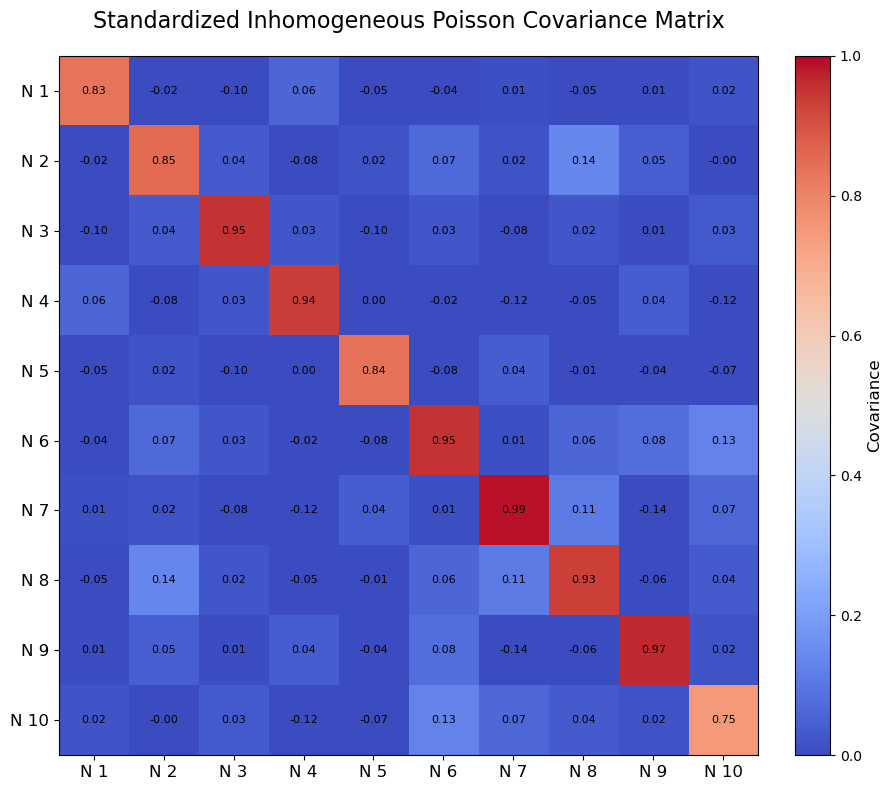

In [85]:
plot_covariance_matrix(cov_matrix_emp, normalize=False, title='Standardized Inhomogeneous Poisson Covariance Matrix', cmap='coolwarm', annot=True, neuron_labels=None)

array([[ 0.97146101, -0.19524676,  0.08064597,  0.07103142,  0.00950706,
         0.04340624, -0.08749888,  0.003684  , -0.04556692, -0.06181365],
       [-0.19524676,  0.84886142, -0.04766117, -0.18357159, -0.0441419 ,
        -0.05100261, -0.03731146,  0.02862281,  0.070367  ,  0.04747564],
       [ 0.08064597, -0.04766117,  1.07080144, -0.14416357,  0.00514459,
         0.00446903, -0.02980492, -0.00856356,  0.04901602,  0.02763494],
       [ 0.07103142, -0.18357159, -0.14416357,  1.03942667,  0.07608684,
        -0.03077169,  0.0115489 ,  0.06815206,  0.05042256,  0.01495298],
       [ 0.00950706, -0.0441419 ,  0.00514459,  0.07608684,  0.87351397,
         0.00204162, -0.00637954,  0.07008094,  0.09028264, -0.02232197],
       [ 0.04340624, -0.05100261,  0.00446903, -0.03077169,  0.00204162,
         1.01805821, -0.01005003,  0.06150281, -0.08116433, -0.00502763],
       [-0.08749888, -0.03731146, -0.02980492,  0.0115489 , -0.00637954,
        -0.01005003,  1.0200673 , -0.03248675

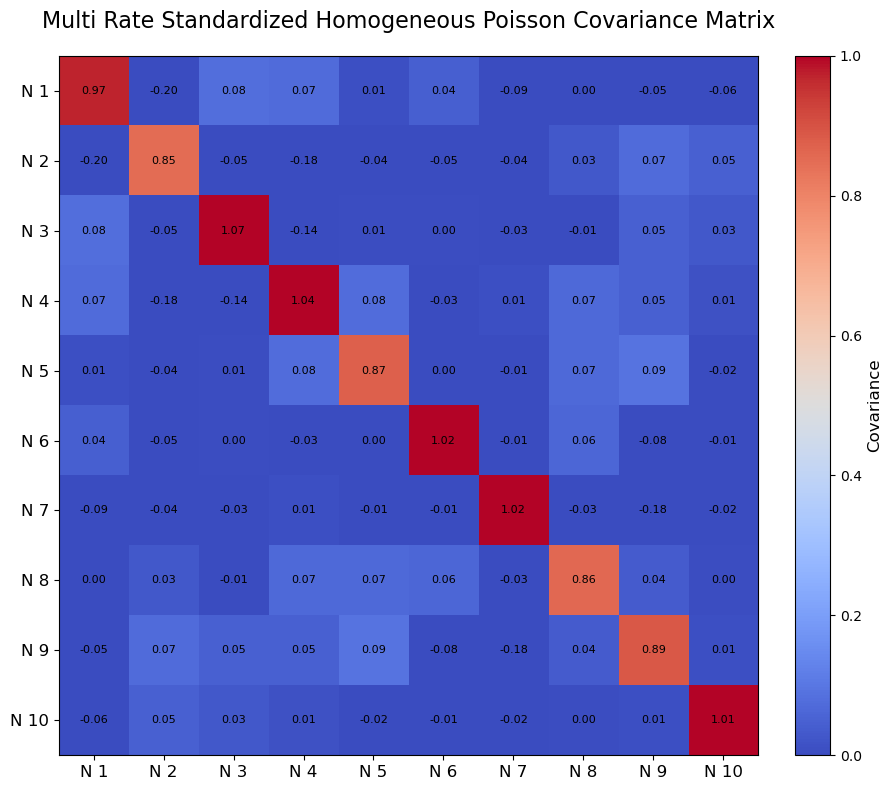

In [86]:
plot_covariance_matrix(multi_rate_cov_matrix, normalize=False, title='Multi Rate Standardized Homogeneous Poisson Covariance Matrix', cmap='coolwarm', annot=True, neuron_labels=None)

array([[ 9.57304210e-01, -1.92772160e-01,  8.16359491e-02,
         7.29703972e-02,  1.01185798e-02,  4.37021678e-02,
        -8.68435782e-02,  6.99803727e-03, -4.30225789e-02,
        -6.04246128e-02],
       [-1.92772160e-01,  8.15933399e-01, -4.44594718e-02,
        -1.77574900e-01, -3.94644545e-02, -4.73537243e-02,
        -3.05611383e-02,  3.81830281e-02,  7.16805642e-02,
         5.18422600e-02],
       [ 8.16359491e-02, -4.44594718e-02,  1.07809289e+00,
        -1.50098650e-01,  1.07335819e-03,  3.67525193e-03,
        -3.46537874e-02, -1.24602234e-02,  4.86222557e-02,
         2.59144039e-02],
       [ 7.29703972e-02, -1.77574900e-01, -1.50098650e-01,
         1.05493576e+00,  7.21405746e-02, -3.32808189e-02,
         6.21044931e-03,  6.31398704e-02,  4.83542113e-02,
         1.39430472e-02],
       [ 1.01185798e-02, -3.94644545e-02,  1.07335819e-03,
         7.21405746e-02,  8.73001043e-01,  1.61884327e-04,
        -1.16647289e-02,  6.49330436e-02,  8.99280004e-02,
        -2.

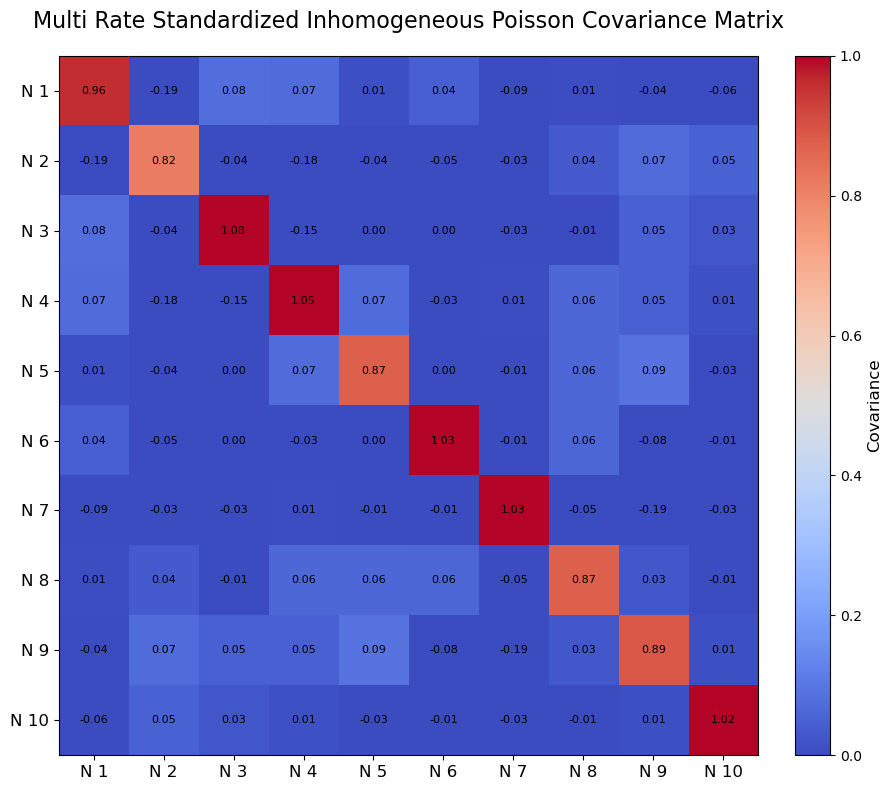

In [87]:
plot_covariance_matrix(multi_rate_cov_matrix_emp, normalize=False, title='Multi Rate Standardized Inhomogeneous Poisson Covariance Matrix', cmap='coolwarm', annot=True, neuron_labels=None)

array([[ 0.9582871 ,  0.0126691 , -0.06676875, -0.11170532, -0.07327111,
        -0.0213665 , -0.00551303,  0.00822907, -0.05623922, -0.02511581],
       [ 0.0126691 ,  0.98836018,  0.09549642,  0.00268715,  0.10086202,
         0.07680076,  0.03181819,  0.02330497, -0.06837456, -0.00854801],
       [-0.06676875,  0.09549642,  0.95225396, -0.10349042, -0.10317024,
        -0.06022684, -0.06273771,  0.10225655, -0.10276418, -0.02881888],
       [-0.11170532,  0.00268715, -0.10349042,  0.89061676,  0.04517411,
         0.02016719,  0.01616158, -0.06151343,  0.10013066, -0.05364929],
       [-0.07327111,  0.10086202, -0.10317024,  0.04517411,  1.03122949,
         0.05273381,  0.12160223, -0.04867637,  0.01441811,  0.01975721],
       [-0.0213665 ,  0.07680076, -0.06022684,  0.02016719,  0.05273381,
         0.77664051,  0.00207349,  0.01885663, -0.09061054,  0.06364744],
       [-0.00551303,  0.03181819, -0.06273771,  0.01616158,  0.12160223,
         0.00207349,  0.92584316, -0.07979662

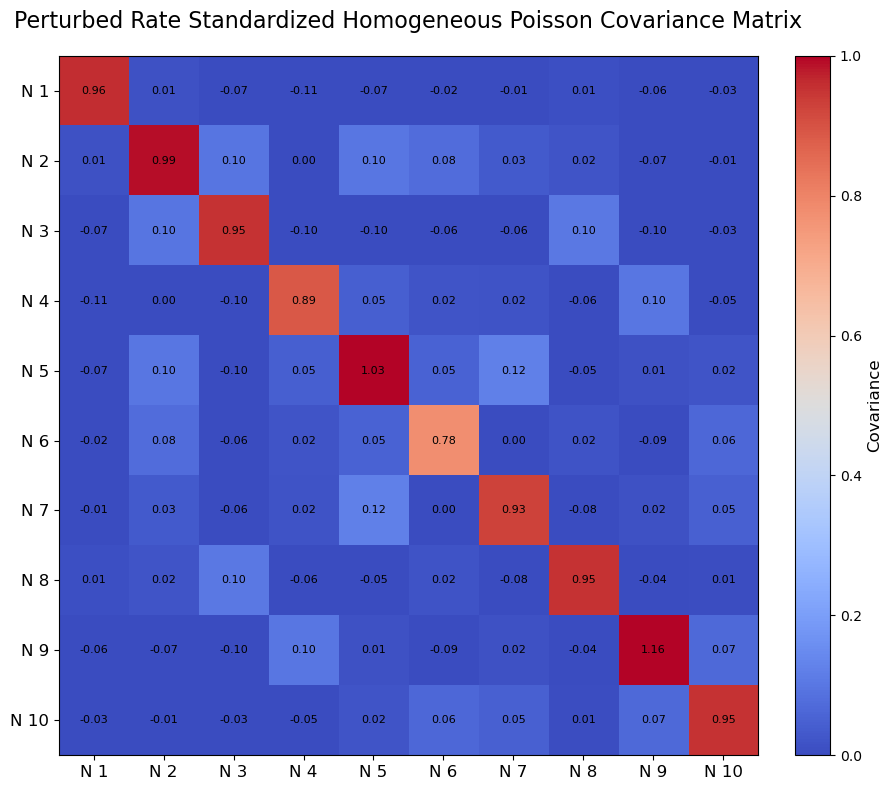

In [88]:
plot_covariance_matrix(perturbed_rate_cov_matrix, normalize=False, title='Perturbed Rate Standardized Homogeneous Poisson Covariance Matrix', cmap='coolwarm', annot=True, neuron_labels=None)

array([[ 0.95062488,  0.01228279, -0.06634661, -0.1115373 , -0.07442447,
        -0.01910852, -0.00596014,  0.00968089, -0.0552895 , -0.02466066],
       [ 0.01228279,  1.00434317,  0.09374311,  0.00486024,  0.09994655,
         0.0762694 ,  0.03060207,  0.02084746, -0.06792331, -0.0053523 ],
       [-0.06634661,  0.09374311,  0.96096121, -0.10096949, -0.10405965,
        -0.06500679, -0.06472552,  0.09913392, -0.10229163, -0.02736397],
       [-0.1115373 ,  0.00486024, -0.10096949,  0.86292979,  0.04128428,
         0.02695888,  0.01440304, -0.05672311,  0.1014629 , -0.05322552],
       [-0.07442447,  0.09994655, -0.10405965,  0.04128428,  1.02545532,
         0.05724347,  0.12010423, -0.04644178,  0.01795567,  0.02078374],
       [-0.01910852,  0.0762694 , -0.06500679,  0.02695888,  0.05724347,
         0.7736218 ,  0.0028665 ,  0.01238336, -0.09670433,  0.0649396 ],
       [-0.00596014,  0.03060207, -0.06472552,  0.01440304,  0.12010423,
         0.0028665 ,  0.92538112, -0.08076618

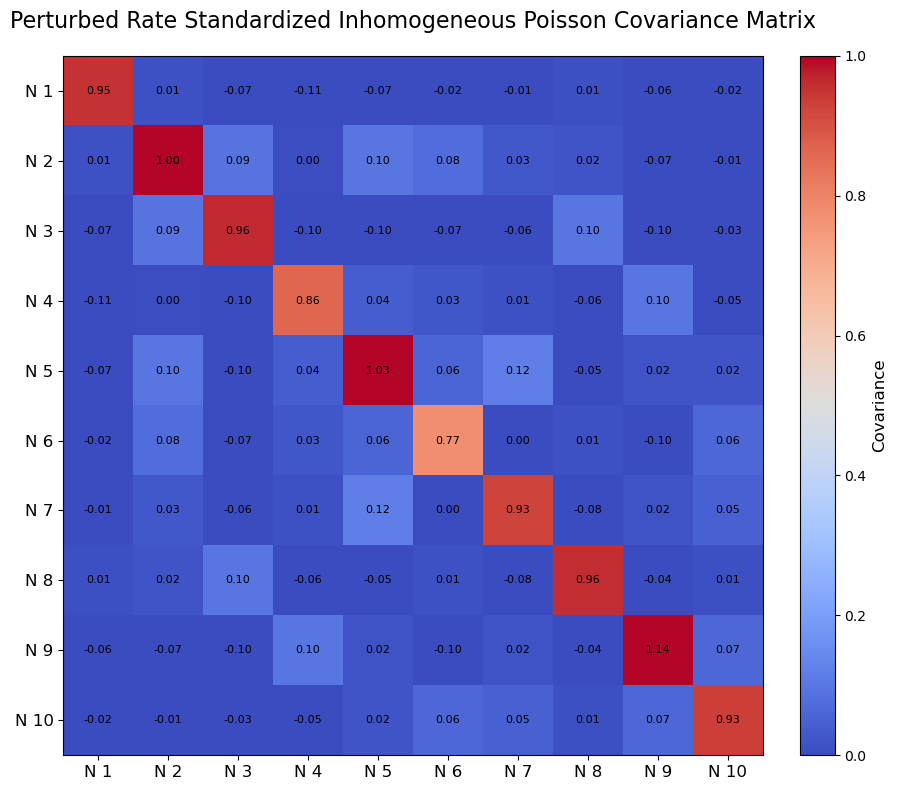

In [89]:
plot_covariance_matrix(perturbed_rate_cov_matrix_emp, normalize=False, title='Perturbed Rate Standardized Inhomogeneous Poisson Covariance Matrix', cmap='coolwarm', annot=True, neuron_labels=None)

In [90]:
#### TESTING END #####

In [91]:
#hotelling_result = hotelling_t2_test(reshaped_stands, np.arange(num_neurons), bessel=True, S=None)
#print(hotelling_result)
#hotelling_result_emp = hotelling_t2_test(reshaped_stands_emp, np.arange(num_neurons), bessel=True, S=None)
#print(hotelling_result_emp)

In [92]:
#good_result = stats.goodness_of_fit(stats.norm, serialized_count, statistic='ad', n_mc_samples=9999, rng=None)
# Anderson-Darling test (good for normality)
# Number of Monte Carlo samples
# Random number generator (None for fresh results)

#print(f"Statistic: {good_result.statistic}")
#print(f"P-value: {good_result.pvalue}")
#print(f"Location (mean): {good_result.fit_result.params.loc}")
#print(f"Scale (std dev): {good_result.fit_result.params.scale}")

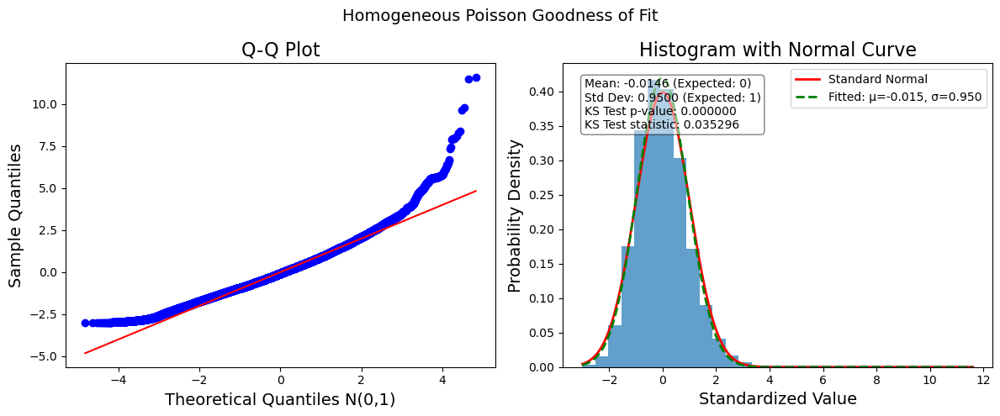

In [93]:
goodness, fig = analyze_poisson_goodness_of_fit(serialized_count, plot_title="Homogeneous Poisson Goodness of Fit", sample_limit=5000)

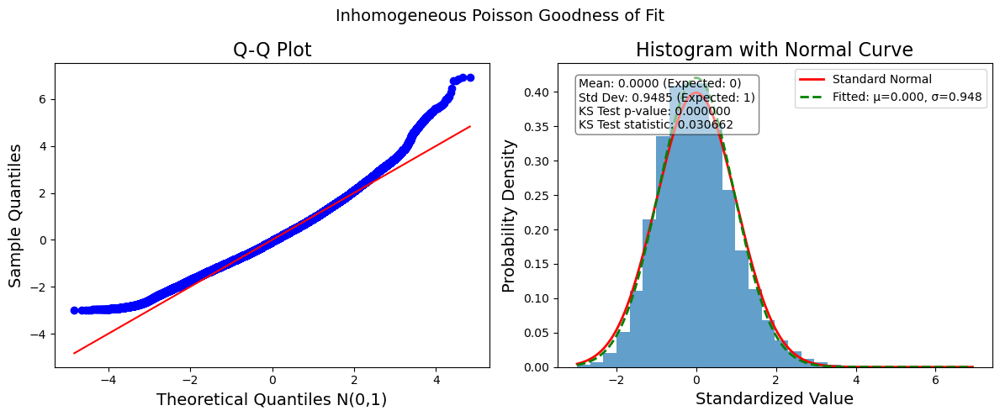

In [94]:
goodness_emp, fig_emp = analyze_poisson_goodness_of_fit(serialized_count_emp, plot_title="Inhomogeneous Poisson Goodness of Fit", sample_limit=5000)

In [95]:
# MULTIVARIATE ANALYSIS
# rv = multivariate_normal(mean=mean, cov=cov, allow_singular=allow_singular)
#rv = multivariate_normal(mean = [0,0], cov = cov_matrix, allow_singular = False)
#rv_emp = multivariate_normal(mean = [0,0], cov = cov_matrix_emp, allow_singular=False)
#print(rv)
#print(rv_emp)

# this is creating its own model, from this we can test if the data has goodness of fit

In [96]:
#cov_matrix, diagonal_ones = covariance_diagonal(reshaped_stands, tol=1e-8)
#print(cov_matrix)
#print(diagonal_ones)
#cov_matrix_emp, diagonal_ones_emp = covariance_diagonal(reshaped_stands_emp, tol=1e-8)
#print(cov_matrix_emp)
#print(diagonal_ones_emp)

In [97]:
#normal_loglikelihood = compute_neural_multivariate_log_likelihood(reshaped_stands)
#print(normal_loglikelihood)

#normal_loglikelihood_emp = compute_neural_multivariate_log_likelihood(reshaped_stands_emp)
#print(normal_loglikelihood_emp)

LogLikelihood experiments, Chi Square statistics, T tests, and zscores

In [99]:
total_log_likelihood, log_likelihood_per_sample = log_likelihood(empirical_mean, theoretical_means)
print(total_log_likelihood)
print(log_likelihood_per_sample)
# normalize data first (so we don't have any negative values, then we can do log likelihood)

#The neural spike patterns that are observed are unlikely to have come from the model...I got around -1600 log likelihood...

-21314.569396316896
[-2135.10661186 -2123.34375634 -2130.84490691 -2147.39084637
 -2130.59213293 -2136.48110734 -2134.30897125 -2123.16072264
 -2128.98353453 -2124.35680614]


In [100]:
test_total_log_likelihood, test_log_likelihood_per_sample = log_likelihood(theoretical_means, theoretical_means)
print(test_total_log_likelihood)
print(test_log_likelihood_per_sample)
# Note: This log likelihood has relative entropy

-21307.41377122644
[-2132.22037588 -2127.96921406 -2136.43550067 -2139.33287339
 -2126.98299357 -2135.14234067 -2116.67583501 -2135.46594608
 -2134.17025894 -2123.01843295]


In [101]:
multivar_log_likelihood, multivar_log_likelihood_per_sample = multivariate_log_likelihood(reshaped_stands)
print(multivar_log_likelihood)
print(multivar_log_likelihood_per_sample)
len(multivar_log_likelihood_per_sample)

# note, there are 99900 samples and the total sum of those is very large.
#print(multivar_log_likelihood/len(multivar_log_likelihood_per_sample))

-1353357.864160698
[-26.98721321 -49.83476515 -35.38316104 ... -15.48997607 -15.49637393
 -15.50310923]


99900

In [102]:
multivar_log_likelihood_emp, multivar_log_likelihood_per_sample_emp = multivariate_log_likelihood(reshaped_stands_emp)
print(multivar_log_likelihood_emp)
print(multivar_log_likelihood_per_sample_emp)
len(multivar_log_likelihood_per_sample)

-1351618.0484111765
[-17.34547298 -36.80971293 -31.05803087 ... -15.53569996 -15.54515212
 -15.53864011]


99900

In [103]:
# difference between multivariate log likelihood of expected - observed data.
diff = multivar_log_likelihood_emp - multivar_log_likelihood
print(diff)

print(diff/len(multivar_log_likelihood_per_sample)) # small difference per sample, less than 1.

1739.8157495213673
0.017415573068281953


In [104]:
reshaped_stands_resized, reshaped_stands_emp_resized = match_array_shapes(reshaped_stands, reshaped_stands_emp)
# resized makes sure that the standardized observed and expected data are the same shape

Original shapes: (10, 99900) and (10, 99900)
Final shapes: (10, 99900) and (10, 99900)


In [105]:
### Chi square test can have bins and minimum expected input by the user ###
### bins (resolution): more bins show a detailed comparison, fewer bins show a broader comparison ###
### min_expected: check used to empty bins with less than min_expected counts
### 50 bins is considered a moderate resolution, 5 minimum expected counts per bin

In [106]:
proper_chi_square_test(reshaped_stands_resized, reshaped_stands_emp_resized, n_bins=30, min_expected=5)
# 'chi_square_statistic': 244.68781663684993
# 'p_value': 4.777468454985577e-40 (aka statistically significant p < 0.05)
# 'degrees_of_freedom': 21, (22 - 1 = 21)
# 'bins_created': 30
# 'bins_used': 22
# 'bins_removed': 8 (too few expected counts)
# The frequency distributions of observed and expected standardized data are different

{'chi_square_statistic': 410.78892894212805,
 'p_value': 2.4944208103709053e-75,
 'degrees_of_freedom': 19,
 'bins_created': 30,
 'bins_used': 20,
 'bins_removed': 10}

In [107]:
### T test can have 'one_sample', 'two_sample', or 'paired' test type ###

In [108]:
t_test(reshaped_stands_resized, reshaped_stands_emp_resized, test_type='one_sample', target_mean=0)
# 't_statistic': 2.9680692646417373
# 'p_value': 0.00299683895859134
# 'target_mean': 0.0
# 'sample_mean': 0.003010765946416713

## estimated standardized data compared with the estimated mean.

{'t_statistic': -15.3753290926059,
 'p_value': 2.4302567553475794e-53,
 'test_type': 'one_sample_vs_mean',
 'target_mean': 0.0,
 'sample_mean': -0.014613935730784408}

In [109]:
t_test(reshaped_stands_emp_resized, reshaped_stands_emp_resized, test_type='one_sample', target_mean=0)
# 't_statistic': 9.031514925174204e-16
# 'p_value': 0.9999999999999993
# 'target_mean': 0.0
# ''sample_mean': 9.10405106879808e-19

## observed standardized data compared with the known mean.

{'t_statistic': 4.796963825932669e-16,
 'p_value': 0.9999999999999996,
 'test_type': 'one_sample_vs_mean',
 'target_mean': 0.0,
 'sample_mean': 4.55202553439904e-19}

In [110]:
### Z stat info ###
data_flat = reshaped_stands_emp.flatten()
n = len(data_flat)

sample_std = np.std(data_flat, ddof=1)
std_error = sample_std / np.sqrt(n)
std_error

np.float64(0.0009489388912608682)

In [111]:
# z_stat = (sample_mean - population_mean) / std_error
Zstat = (np.mean(reshaped_stands_emp) - 0)/std_error
Zstat

np.float64(4.79696382593267e-16)

In [112]:
t_test(reshaped_stands_resized, reshaped_stands_emp_resized, test_type='two_sample', target_mean=None)
# Are the group means different?
# 't_statistic': 2.1053251974447873
# 'p_value': 0.03526313467995148 (aka statistically significant p < 0.05)
# The datasets have significantly different means

{'t_statistic': -10.880814340903292,
 'p_value': 1.4254005042677721e-27,
 'test_type': 'two_sample'}

In [113]:
t_test(reshaped_stands_resized, reshaped_stands_emp_resized, test_type='paired', target_mean=None)
# Are the paired differences different from zero
# 't_statistic': 36.627117732234396
# 'p_value': 1.6617750264560706e-293 (aka statistically significant p < 0.05)
# The datasets have significantly paired differences

{'t_statistic': -188.6630198210579, 'p_value': 0.0, 'test_type': 'paired'}

Theoretical and Empirical stats of excitatory counts.

In [115]:
# empirical_mean_ex = empirical_means(count_ex)
empirical_mean_ex = count_ex.mean(axis=0)
#print(empirical_mean_ex)
#print(empirical_mean_ex.shape)
count_rate_ex = empirical_mean_ex[:, -1]

# empirical_std_dev_ex = std_dev_empirical_mean(empirical_mean_ex, num_samples, count_ex)
#empirical_std_dev_ex = count_ex.std(axis=0, ddof=1)
empirical_std_dev_ex = np.sqrt(empirical_mean_ex)
#print(empirical_std_dev_ex)
#print(empirical_std_dev_ex.shape)

empirical_lower_bound_ex, empirical_upper_bound_ex = confidence_intervals(empirical_mean_ex, empirical_std_dev_ex, num_samples, confidence_level=0.95)
# print(empirical_lower_bound_sim_ex)
# print(empirical_upper_bound_sim_ex)

In [116]:
exclude_times_ex, global_exclude_ex = last_zero_std_time(empirical_std_dev_ex, verbose=True)

Neuron 0: last zero std at t=-1, recommended exclude=0
Neuron 1: last zero std at t=-1, recommended exclude=0
Neuron 2: last zero std at t=0, recommended exclude=1
Neuron 3: last zero std at t=-1, recommended exclude=0
Neuron 4: last zero std at t=0, recommended exclude=1
Neuron 5: last zero std at t=0, recommended exclude=1
Neuron 6: last zero std at t=-1, recommended exclude=0
Neuron 7: last zero std at t=-1, recommended exclude=0
Neuron 8: last zero std at t=-1, recommended exclude=0
Neuron 9: last zero std at t=-1, recommended exclude=0

Global exclude (safest): t=1


In [117]:
theoretical_means_sim_ex = calculate_theoretical_mean(count_rate_ex, time)
#print(theoretical_means_sim_ex)
#print(theoretical_means_sim_ex.shape)

theoretical_std_dev_sim_ex = calculate_theoretical_std_dev(theoretical_means_sim_ex)
#print(theoretical_std_dev_sim_ex)
#print(theoretical_std_dev_sim_ex.shape)

theoretical_lower_bound_sim_ex, theoretical_upper_bound_sim_ex = confidence_intervals(theoretical_means_sim_ex, theoretical_std_dev_sim_ex, num_samples, confidence_level=0.95)
# print(theoretical_lower_bound_sim_ex)
# print(theoretical_upper_bound_sim_ex)

In [118]:
res_var_ex = variance_of_residuals(empirical_mean_ex, theoretical_means_sim_ex)
#print(res_var_ex)

In [119]:
stands_ex = standardize_counts_loop(count_ex, theoretical_means_sim_ex, theoretical_std_dev_sim_ex, num_samples, num_neurons, exclude = 1)
#print(stands_ex)
#print(stands_ex.shape)

stands_ex_emp = standardize_counts_loop(count_ex, empirical_mean_ex, empirical_std_dev_ex, num_samples, num_neurons, global_exclude_ex)
#print(stands_ex_emp)
#print(stands_ex_emp.shape)

# WHENEVER WE CHANGE TIME, WE NEED TO HAVE IT BE KNOWN, 

# when i do covariance, i should reshape from num_samples, num_neurons, , assume poisson but not assume independent, the variance and covariance should be equal
# time to something with time as replicate. replicate (num_samples) times time in dimension, num_neurons
# covariance, num_neurons by num_neurons, data to produce this should be num_samples times num_neurons
# reformat the current matrix, use reshape with the matrix, maybe with loops 

standardized_mean_global_ex = np.mean(stands_ex)
standardized_std_global_ex = np.std(stands_ex)

standardized_mean_emp_global_ex = np.mean(stands_ex_emp)
standardized_std_emp_global_ex = np.std(stands_ex_emp)

standardized_mean_ex = np.mean(stands_ex, axis=0)
standardized_std_ex = np.std(stands_ex, axis=0, ddof = 1)

standardized_mean_ex_emp = np.mean(stands_ex_emp, axis = 0)
standardized_std_ex_emp = np.std(stands_ex_emp, axis = 0, ddof = 1)

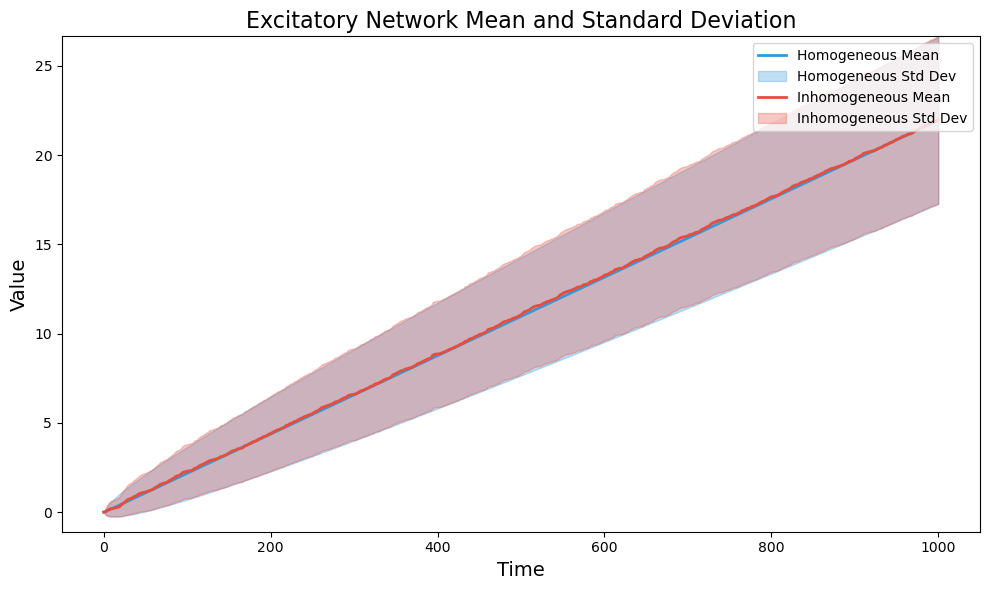

In [120]:
plot_stats(theoretical_means_sim_ex, empirical_mean_ex, theoretical_std_dev_sim_ex, empirical_std_dev_ex, title = 'Excitatory Network Mean and Standard Deviation')

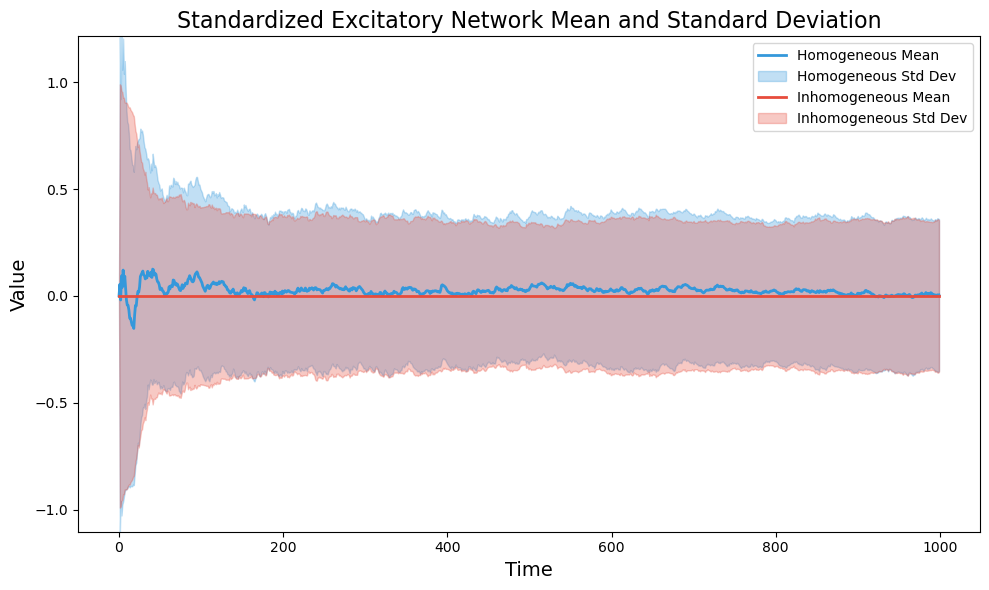

In [121]:
plot_stats(standardized_mean_ex, standardized_mean_ex_emp, standardized_std_ex, standardized_std_ex_emp, title = 'Standardized Excitatory Network Mean and Standard Deviation')

In [122]:
mean_check_ex = check_mean_with_se(stands_ex, expected_mean=0, confidence=0.95)
#print(mean_check_ex)

mean_check_ex_emp = check_mean_with_se(stands_ex_emp, expected_mean=0, confidence=0.95)
#print(mean_check_ex_emp)

In [123]:
serialized_count_ex = serialize_counts(stands_ex) # make serialize have an extra parameter that makes you drop the first n units [:,:,10:]
#print(serialized_count_ex.shape)
#print(np.mean(serialized_count_ex))
t_stat_ex, p_val_mean_ex = stats.ttest_1samp(serialized_count_ex, np.mean(serialized_count_ex))
#print(t_stat_ex)
#print(p_val_mean_ex)

    ## per neuron, check that is it doing per neuron
    ## check assumptions if i'm using count, check for data replicate and check for variables

serialized_count_ex_emp = serialize_counts(stands_ex_emp) # make serialize have an extra parameter that makes you drop the first n units [:,:,10:]
#print(serialized_count_ex_emp.shape)
#print(np.mean(serialized_count_ex_emp))
t_stat_ex_emp, p_val_mean_ex_emp = stats.ttest_1samp(serialized_count_ex_emp, np.mean(serialized_count_ex_emp))
#print(t_stat_ex_emp)
#print(p_val_mean_ex_emp)

In [124]:
#reshaped_stands_ex = np.reshape(stands_ex, (-1, stands_ex.shape[1]), order='F')
reshaped_stands_ex = np.transpose(stands_ex, (1, 0, 2)).reshape(stands_ex.shape[1], -1)
#print(stands_ex.shape)
#print(reshaped_stands_ex.shape)

#could change the values from num_samples, num_neurons, time to 10 by large number, could transpose it
# make sure coviariance matrix is using row data, don't use np.cov because it throws away the mean
# covariance is the data and the transpose of the data divided sqrt(n-1), lookup how covariance is calculated and make it by hand.
# try to iterate over samples, as in each time point, 

# reshaped_stands_ex_emp = np.reshape(stands_ex_emp, (-1, stands_ex_emp.shape[1]), order='F')
reshaped_stands_ex_emp = np.transpose(stands_ex_emp, (1, 0, 2)).reshape(stands_ex_emp.shape[1], -1)
#print(stands_ex_emp.shape)
#print(stands_ex.shape)
#print(reshaped_stands_ex.shape)
#print(stands_ex[:,:,0])
#print(reshaped_stands[:,0])
#print(stands_ex_emp[:,:,0].shape)
#print(stands_ex_emp[:10,:,0])
#print(reshaped_stands_ex_emp.shape)
#print(reshaped_stands_ex_emp[:10,:])

In [125]:
transpose_stands_ex = np.transpose(stands_ex, (1, 0, 2))
#print(transpose_stands_ex[:,:,0:3])

In [126]:
#print(reshaped_stands_ex[:,:5])

In [127]:
#print("Time point 0:", stands_ex[:,:,0])
#print("Time point 1:", stands_ex[:,:,1])
#print("Time point 100:", stands_ex[:,:,100])

In [128]:
cov_matrix_ex = cov_standardized_data(reshaped_stands_ex)
cov_matrix_ex_emp = cov_standardized_data(reshaped_stands_ex_emp)

array([[ 0.15172078,  0.02198509,  0.04333912,  0.02059961,  0.02575156,
         0.00417905,  0.03232164,  0.02104574,  0.02877516,  0.02920675],
       [ 0.02198509,  0.19316421,  0.02217202,  0.06088746,  0.02489189,
         0.03431205,  0.0235137 ,  0.01506996,  0.03407722,  0.03347055],
       [ 0.04333912,  0.02217202,  0.16485829,  0.039344  ,  0.02696394,
        -0.00638873,  0.0406034 ,  0.02058786,  0.03676754,  0.03360657],
       [ 0.02059961,  0.06088746,  0.039344  ,  0.25150073,  0.0427075 ,
         0.01037285,  0.04003568,  0.02308213,  0.02305516,  0.02882052],
       [ 0.02575156,  0.02489189,  0.02696394,  0.0427075 ,  0.14440896,
         0.03065728,  0.03789369,  0.03790805,  0.04043733,  0.02835721],
       [ 0.00417905,  0.03431205, -0.00638873,  0.01037285,  0.03065728,
         0.19899579,  0.02675218,  0.04590094,  0.02864591,  0.03153361],
       [ 0.03232164,  0.0235137 ,  0.0406034 ,  0.04003568,  0.03789369,
         0.02675218,  0.2029738 ,  0.04008424

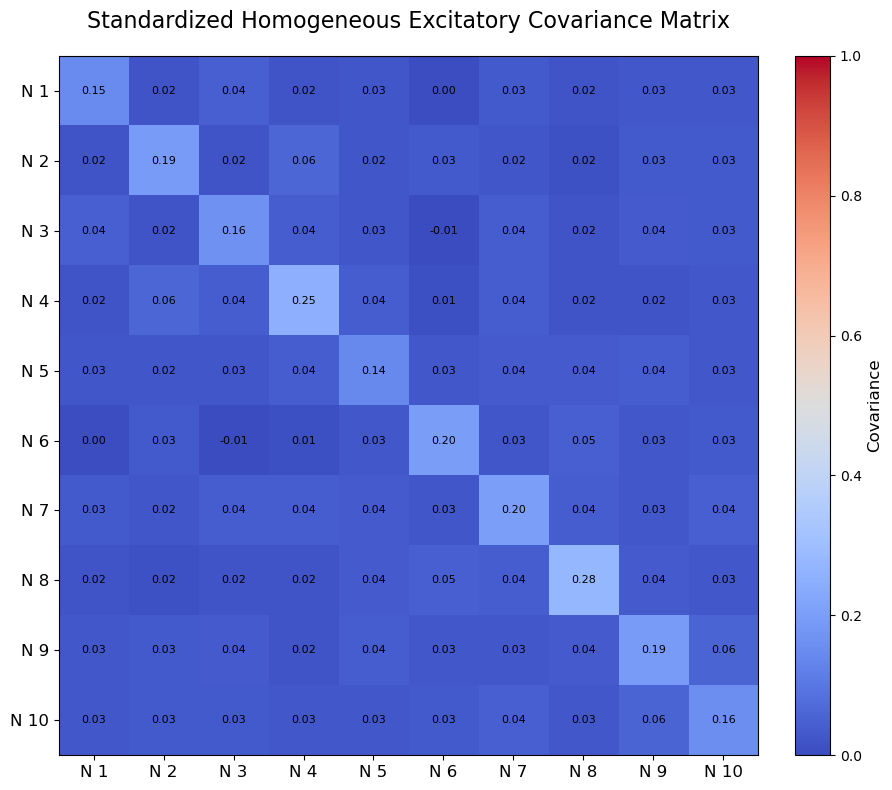

In [129]:
plot_covariance_matrix(cov_matrix_ex, normalize=False, title="Standardized Homogeneous Excitatory Covariance Matrix", cmap='coolwarm', annot=True, neuron_labels=None)

array([[ 0.14830416,  0.0223548 ,  0.04294609,  0.0212497 ,  0.02483737,
         0.00534079,  0.03141417,  0.02032748,  0.02861229,  0.02953692],
       [ 0.0223548 ,  0.1946146 ,  0.02245526,  0.06076737,  0.0252464 ,
         0.03459182,  0.02373127,  0.01476947,  0.03395969,  0.03380611],
       [ 0.04294609,  0.02245526,  0.16635834,  0.03984781,  0.02659284,
        -0.00593171,  0.04006291,  0.02034493,  0.036894  ,  0.03363449],
       [ 0.0212497 ,  0.06076737,  0.03984781,  0.24798588,  0.04344012,
         0.00921629,  0.04079419,  0.02208574,  0.02133858,  0.02881128],
       [ 0.02483737,  0.0252464 ,  0.02659284,  0.04344012,  0.14271493,
         0.0316959 ,  0.03654   ,  0.03663268,  0.04015606,  0.02820286],
       [ 0.00534079,  0.03459182, -0.00593171,  0.00921629,  0.0316959 ,
         0.20306408,  0.02785154,  0.04613845,  0.02848018,  0.03187665],
       [ 0.03141417,  0.02373127,  0.04006291,  0.04079419,  0.03654   ,
         0.02785154,  0.19879135,  0.03902397

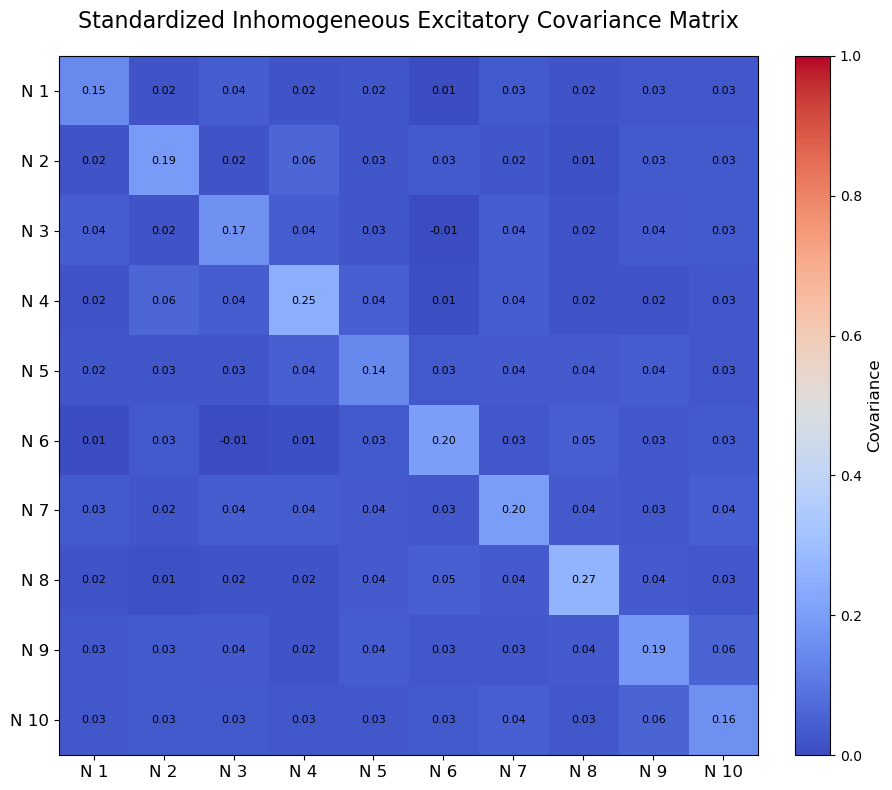

In [130]:
plot_covariance_matrix(cov_matrix_ex_emp, normalize=False, title="Standardized Inhomogeneous Excitatory Covariance Matrix", cmap='coolwarm', annot=True, neuron_labels=None)

In [131]:
#hotelling_result_ex = hotelling_t2_test(reshaped_stands_ex, np.arange(num_neurons), bessel=True, S=None)
#print(hotelling_result_ex)
#hotelling_result_ex_emp = hotelling_t2_test(reshaped_stands_ex_emp, np.arange(num_neurons), bessel=True, S=None)
#print(hotelling_result_ex_emp)

In [132]:
#cov_matrix_ex, diagonal_ones_ex = covariance_diagonal(reshaped_stands_ex, tol=1e-8)
#print(cov_matrix_ex)
#print(diagonal_ones_ex)
#cov_matrix_ex_emp, diagonal_ones_ex_emp = covariance_diagonal(reshaped_stands_ex_emp, tol=1e-8)
#print(cov_matrix_ex_emp)
#print(diagonal_ones_ex_emp)

In [133]:
#### TESTING #####
#plot_covariance_matrix(reshaped_data, normalize=False, title="Excitatory Theoretical Covariance Matrix", cmap='coolwarm', annot=True)

In [134]:
#### TESTING ####
#plot_covariance_matrix(reshaped_data_emp, normalize=False, title="Excitatory Empirical Covariance Matrix", cmap='coolwarm', annot=True)

In [135]:
# MULTIVARIATE ANALYSIS
# rv = multivariate_normal(mean=mean, cov=cov, allow_singular=allow_singular)

# rv_ex = multivariate_normal(mean = theoretical_means_sim_ex, cov = cov_matrix_ex, allow_singular=allow_singular)
# rv_ex_emp = multivariate_normal(mean = empirical_mean_ex, cov = cov_matrix_ex_emp, allow_singular=allow_singular)

# this is creating its own model, from this we can test if the data has goodness of fit

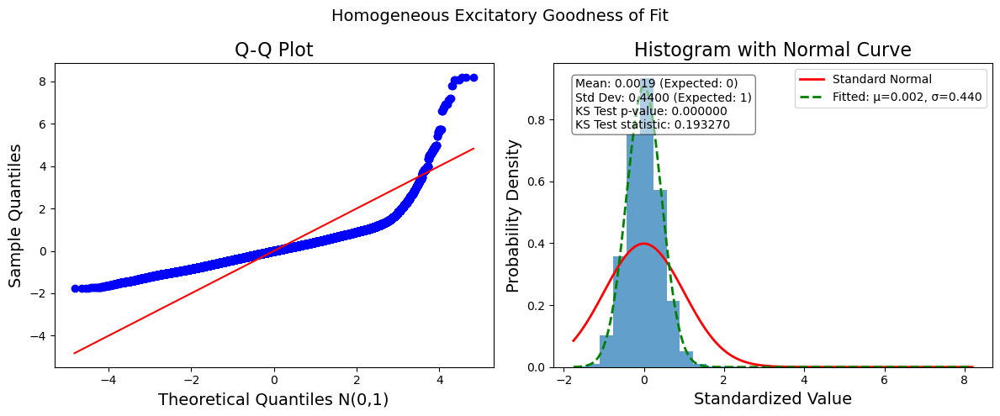

In [136]:
goodness_ex, fig_ex = analyze_poisson_goodness_of_fit(serialized_count_ex, plot_title="Homogeneous Excitatory Goodness of Fit", sample_limit=5000)

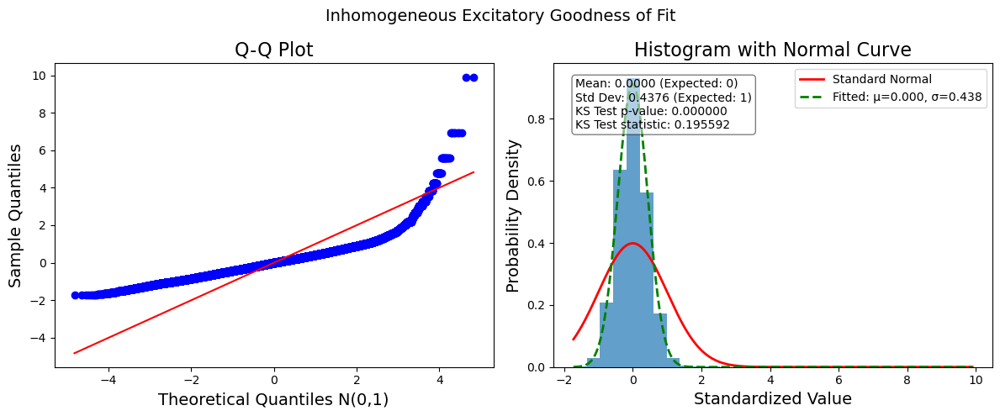

In [137]:
goodness_ex_emp, fig_ex_emp = analyze_poisson_goodness_of_fit(serialized_count_ex_emp, plot_title="Inhomogeneous Excitatory Goodness of Fit", sample_limit=5000)

Theoretical and Empirical stats of inhibitory counts.

In [139]:
# empirical_mean_in = empirical_means(count_in)
empirical_mean_in = count_in.mean(axis=0)
#print(empirical_mean_in)
#print(empirical_mean_in.shape)
count_rate_in = empirical_mean_in[:, -1]

#empirical_std_dev_in = std_dev_empirical_mean(empirical_mean_in, num_samples, count_in)
#empirical_std_dev_in = count_in.std(axis=0, ddof=1)
empirical_std_dev_in = np.sqrt(empirical_mean_in)
#print(empirical_std_dev_in)
#print(empirical_std_dev_in.shape)

empirical_lower_bound_in, empirical_upper_bound_in = confidence_intervals(empirical_mean_in, empirical_std_dev_in, num_samples, confidence_level=0.95)
# print(empirical_lower_bound_sim_in)
# print(empirical_upper_bound_sim_in)

In [140]:
exclude_times_in, global_exclude_in = last_zero_std_time(empirical_std_dev_in, verbose=True)

Neuron 0: last zero std at t=-1, recommended exclude=0
Neuron 1: last zero std at t=-1, recommended exclude=0
Neuron 2: last zero std at t=-1, recommended exclude=0
Neuron 3: last zero std at t=-1, recommended exclude=0
Neuron 4: last zero std at t=-1, recommended exclude=0
Neuron 5: last zero std at t=-1, recommended exclude=0
Neuron 6: last zero std at t=-1, recommended exclude=0
Neuron 7: last zero std at t=-1, recommended exclude=0
Neuron 8: last zero std at t=-1, recommended exclude=0
Neuron 9: last zero std at t=-1, recommended exclude=0

Global exclude (safest): t=0


In [141]:
theoretical_means_sim_in = calculate_theoretical_mean(count_rate_in, time)
#print(theoretical_means_sim_in)
#print(theoretical_means_sim_in.shape)

theoretical_std_dev_sim_in = calculate_theoretical_std_dev(theoretical_means_sim_in)
#print(theoretical_std_dev_sim_in)
#print(theoretical_std_dev_sim_in.shape)

theoretical_lower_bound_sim_in, theoretical_upper_bound_sim_in = confidence_intervals(theoretical_means_sim_in, theoretical_std_dev_sim_in, num_samples, confidence_level=0.95)
# print(theoretical_lower_bound_sim_in)
# print(theoretical_upper_bound_sim_in)

In [142]:
res_var_in = variance_of_residuals(empirical_mean_in, theoretical_means_sim_in)
#print(res_var_in)

In [143]:
stands_in = standardize_counts_loop(count_in, theoretical_means_sim_in, theoretical_std_dev_sim_in, num_samples, num_neurons, exclude = 1)
#print(stands_in)
#print(stands_in.shape)

stands_in_emp = standardize_counts_loop(count_in, empirical_mean_in, empirical_std_dev_in, num_samples, num_neurons, global_exclude_in)
#print(stands_in_emp)
#print(stands_in_emp.shape)

# WHENEVER WE CHANGE TIME, WE NEED TO HAVE IT BE KNOWN, 

# when i do covariance, i should reshape from num_samples, num_neurons, , assume poisson but not assume independent, the variance and covariance should be equal
# time to something with time as replicate. replicate (num_samples) times time in dimension, num_neurons
# covariance, num_neurons by num_neurons, data to produce this should be num_samples times num_neurons
# reformat the current matrix, use reshape with the matrix, maybe with loops 

standardized_mean_global_in = np.mean(stands_in)
standardized_std_global_in = np.std(stands_in)

standardized_mean_emp_global_in = np.mean(stands_in_emp)
standardized_std_emp_global_in = np.std(stands_in_emp)

standardized_mean_in = np.mean(stands_in, axis=0)
standardized_std_in = np.std(stands_in, axis=0, ddof = 1)

standardized_mean_in_emp = np.mean(stands_in_emp, axis = 0)
standardized_std_in_emp = np.std(stands_in_emp, axis = 0, ddof = 1)

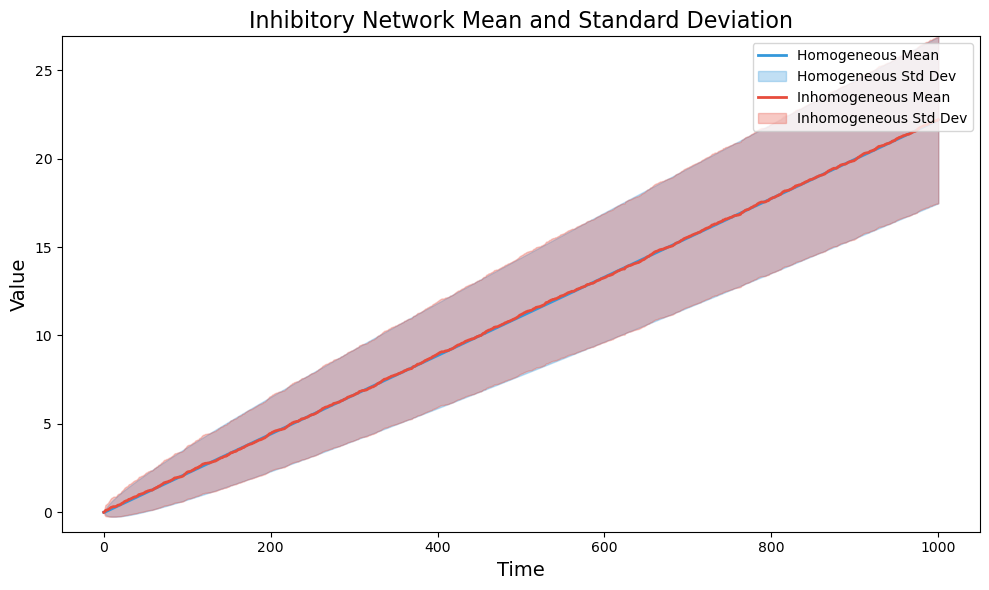

In [144]:
plot_stats(theoretical_means_sim_in , empirical_mean_in, theoretical_std_dev_sim_in, empirical_std_dev_in, title = 'Inhibitory Network Mean and Standard Deviation')

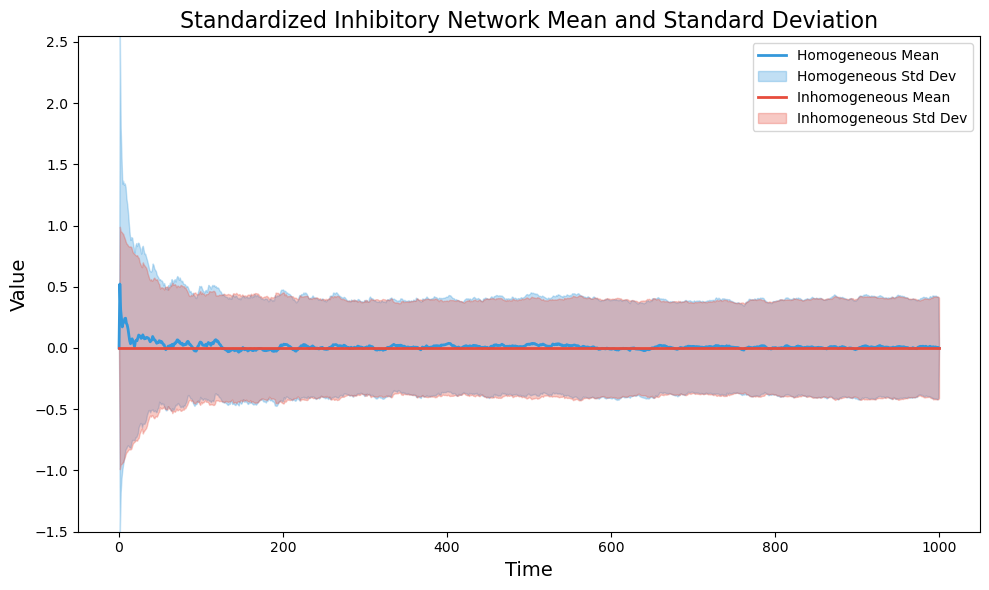

In [145]:
plot_stats(standardized_mean_in, standardized_mean_in_emp, standardized_std_in, standardized_std_in_emp, title = 'Standardized Inhibitory Network Mean and Standard Deviation')

In [146]:
mean_check_in = check_mean_with_se(stands_in, expected_mean=0, confidence=0.95)
#print(mean_check_in)

mean_check_in_emp = check_mean_with_se(stands_in_emp, expected_mean=0, confidence=0.95)
#print(mean_check_in_emp)

In [147]:
serialized_count_in = serialize_counts(stands_in) # make serialize have an extra parameter that makes you drop the first n units [:,:,10:]
#print(serialized_count_in.shape)
#print(np.mean(serialized_count_in))
t_stat_in, p_val_mean_in = stats.ttest_1samp(serialized_count_in, np.mean(serialized_count_in))
#print(t_stat_in)
#print(p_val_mean_in)
    ## per neuron, check that is it doing per neuron
    ## check assumptions if i'm using count, check for data replicate and check for variables


serialized_count_in_emp = serialize_counts(stands_in_emp) # make serialize have an extra parameter that makes you drop the first n units [:,:,10:]
#print(serialized_count_in_emp.shape)
#print(np.mean(serialized_count_in_emp))
t_stat_in_emp, p_val_mean_in_emp = stats.ttest_1samp(serialized_count_in_emp, np.mean(serialized_count_in_emp))
#print(t_stat_in_emp)
#print(p_val_mean_in_emp)

In [148]:
#reshaped_stands_in = np.reshape(stands_in, (-1, stands_in.shape[1]), order='F')
reshaped_stands_in = np.transpose(stands_in, (1, 0, 2)).reshape(stands_in.shape[1], -1)
#print(stands_in.shape)
#print(reshaped_stands_in.shape)

#reshaped_stands_in_emp = np.reshape(stands_in_emp, (-1, stands_in_emp.shape[1]), order='F')
reshaped_stands_in_emp = np.transpose(stands_in_emp, (1, 0, 2)).reshape(stands_in_emp.shape[1], -1)
#print(stands_in_emp.shape)
#print(reshaped_stands_in_emp.shape)

In [149]:
cov_matrix_in = cov_standardized_data(reshaped_stands_in)
cov_matrix_in_emp = cov_standardized_data(reshaped_stands_in_emp)

array([[ 1.92117821e-01,  1.23684766e-02,  2.90504466e-02,
         2.34199583e-02,  3.48380654e-02,  3.51763905e-02,
         6.28475079e-02,  3.34259392e-02,  2.74520259e-02,
         1.28137672e-02],
       [ 1.23684766e-02,  2.15237099e-01,  3.63920789e-03,
         4.19654200e-02,  2.71865546e-02,  1.22408961e-02,
         5.38521579e-02,  1.21647430e-02,  3.06050928e-03,
         1.96469863e-02],
       [ 2.90504466e-02,  3.63920789e-03,  1.21474266e-01,
         1.81922095e-02,  1.07193834e-02,  1.93632434e-02,
        -4.30474882e-04,  1.80069340e-02,  1.25928469e-02,
         1.05021708e-02],
       [ 2.34199583e-02,  4.19654200e-02,  1.81922095e-02,
         1.50606650e-01,  3.39072869e-02,  2.66449886e-02,
         3.90043196e-02,  2.58902646e-02,  4.03392469e-02,
         1.18756159e-02],
       [ 3.48380654e-02,  2.71865546e-02,  1.07193834e-02,
         3.39072869e-02,  1.56693071e-01,  3.89617969e-02,
         2.27876151e-02,  9.11316721e-03,  8.45288918e-03,
        -6.

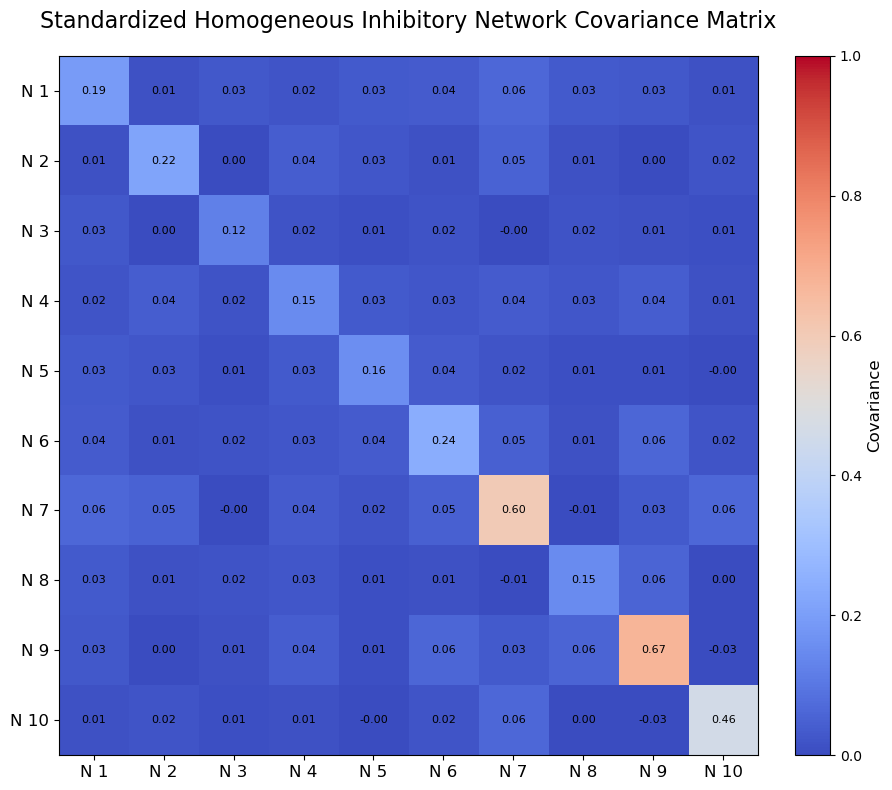

In [150]:
plot_covariance_matrix(cov_matrix_in, normalize=False, title="Standardized Homogeneous Inhibitory Network Covariance Matrix", cmap='coolwarm', annot=True, neuron_labels=None)

array([[ 1.81189152e-01,  1.25036084e-02,  2.89664505e-02,
         2.21200307e-02,  3.31530205e-02,  3.43257597e-02,
         5.80686273e-02,  3.29681308e-02,  2.28338598e-02,
         1.02941913e-02],
       [ 1.25036084e-02,  2.14218179e-01,  3.85518944e-03,
         4.10259080e-02,  2.69479748e-02,  1.32261990e-02,
         5.43331549e-02,  1.13292022e-02,  8.71796175e-04,
         2.10719119e-02],
       [ 2.89664505e-02,  3.85518944e-03,  1.25258172e-01,
         1.84297777e-02,  1.08277263e-02,  1.92549570e-02,
         4.46557886e-04,  1.81239207e-02,  1.28233121e-02,
         1.07550660e-02],
       [ 2.21200307e-02,  4.10259080e-02,  1.84297777e-02,
         1.43463863e-01,  3.17640710e-02,  2.47165851e-02,
         3.73890916e-02,  2.60119450e-02,  3.75274064e-02,
         1.00950816e-02],
       [ 3.31530205e-02,  2.69479748e-02,  1.08277263e-02,
         3.17640710e-02,  1.46631701e-01,  3.66528753e-02,
         2.09169635e-02,  8.80564548e-03,  3.29031661e-03,
        -5.

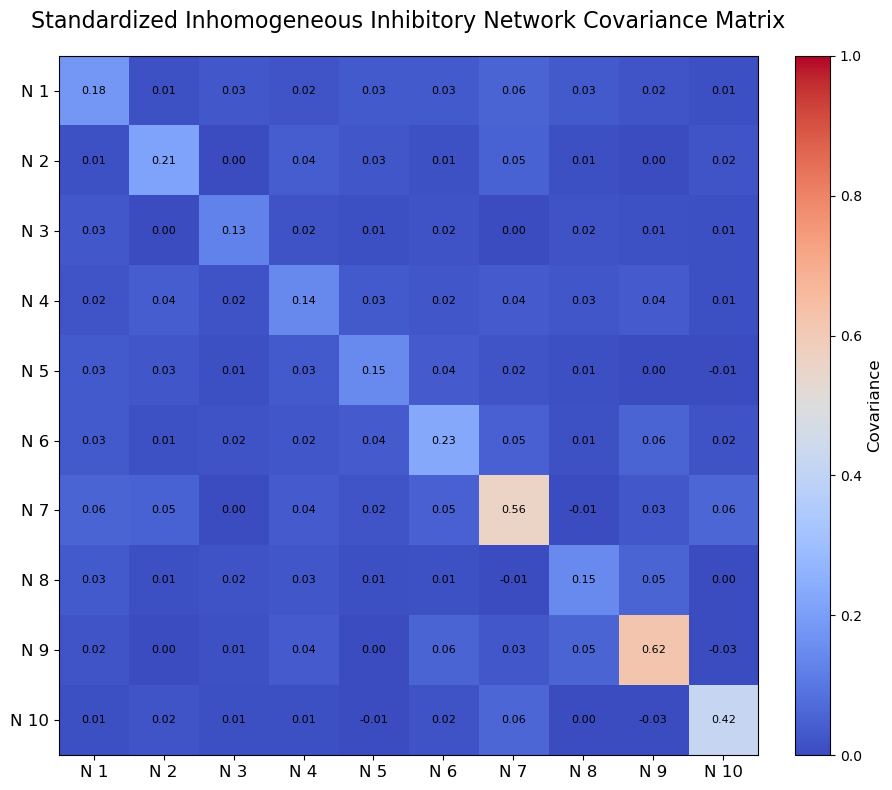

In [151]:
plot_covariance_matrix(cov_matrix_in_emp, normalize=False, title="Standardized Inhomogeneous Inhibitory Network Covariance Matrix", cmap='coolwarm', annot=True, neuron_labels=None)

In [152]:
#hotelling_result_in = hotelling_t2_test(reshaped_stands_in, np.arange(num_neurons), bessel=True, S=None)
#print(hotelling_result_in)
#hotelling_result_in_emp = hotelling_t2_test(reshaped_stands_in_emp, np.arange(num_neurons), bessel=True, S=None)
#print(hotelling_result_in_emp)

In [153]:
#cov_matrix_in, diagonal_ones_in = covariance_diagonal(reshaped_stands_in, tol=1e-8)
#print(cov_matrix_in)
#print(diagonal_ones_in)
#cov_matrix_in_emp, diagonal_ones_in_emp = covariance_diagonal(reshaped_stands_in_emp, tol=1e-8)
#print(cov_matrix_in_emp)
#print(diagonal_ones_in_emp)

In [154]:
# MULTIVARIATE ANALYSIS
# rv = multivariate_normal(mean=mean, cov=cov, allow_singular=allow_singular)

# rv_in = multivariate_normal(mean = theoretical_means_sim_in, cov = cov_matrix_in, allow_singular=allow_singular)
# rv_in_emp = multivariate_normal(mean = empirical_mean_in, cov = cov_matrix_in_emp, allow_singular=allow_singular)

# this is creating its own model, from this we can test if the data has goodness of fit

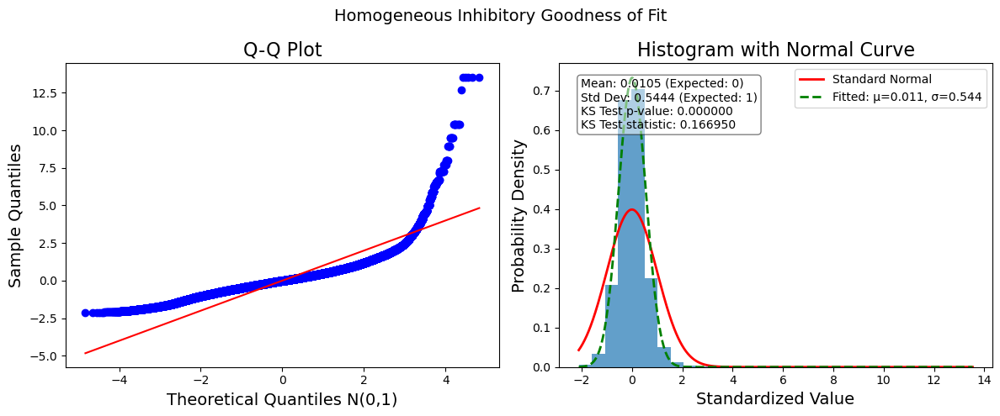

In [155]:
goodness_in, fig_in = analyze_poisson_goodness_of_fit(serialized_count_in, plot_title="Homogeneous Inhibitory Goodness of Fit", sample_limit=5000)

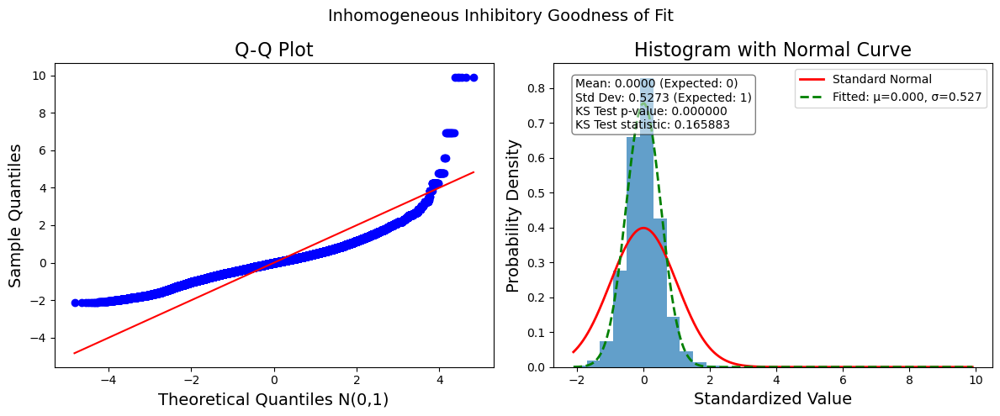

In [156]:
goodness_in_emp, fig_in_emp = analyze_poisson_goodness_of_fit(serialized_count_in_emp, plot_title="Inhomogeneous Inhibitory Goodness of Fit", sample_limit=5000)

Balanced Excitatory and Inhibitory Experiments

In [158]:
# Original excitatory and inhibitory data shapes
print(reshaped_stands_ex.shape)
print(reshaped_stands_in.shape)

print(reshaped_stands_ex_emp.shape)
print(reshaped_stands_in_emp.shape)

(10, 99900)
(10, 99900)
(10, 99900)
(10, 100000)


In [159]:
balanced_data, labels, types = create_balanced_ei_dataset(reshaped_stands_ex, reshaped_stands_in, n_neurons_each=5)
print(f"\nBalanced dataset shape: {balanced_data.shape}")
print(f"Neuron labels: {labels}")
print(f"Neuron types: {types}")

balanced_data_emp, labels_emp, types_emp = create_balanced_ei_dataset(reshaped_stands_ex_emp, reshaped_stands_in_emp, n_neurons_each=5)
print(f"\nBalanced Empirical dataset shape: {balanced_data_emp.shape}")
print(f"Neuron Empirical labels: {labels_emp}")
print(f"Neuron Empirical types: {types_emp}")
# Balanced = Joint, don't use balance because it could be interpreted as something it isn't
# add option to randomize joint excitatory and inhibitory neurons
# Get neuron id from spike train instead of label


Balanced dataset shape: (10, 99900)
Neuron labels: ['E0', 'E1', 'E2', 'E3', 'E4', 'I0', 'I1', 'I2', 'I3', 'I4']
Neuron types: ['E', 'E', 'E', 'E', 'E', 'I', 'I', 'I', 'I', 'I']

Balanced Empirical dataset shape: (10, 99900)
Neuron Empirical labels: ['E0', 'E1', 'E2', 'E3', 'E4', 'I0', 'I1', 'I2', 'I3', 'I4']
Neuron Empirical types: ['E', 'E', 'E', 'E', 'E', 'I', 'I', 'I', 'I', 'I']


In [160]:
cov_matrix_balance = cov_standardized_data(balanced_data)
cov_matrix_balance_emp = cov_standardized_data(balanced_data_emp)

array([[0.15172078, 0.02198509, 0.04333912, 0.02059961, 0.02575156,
        0.03357964, 0.02571197, 0.02510904, 0.02548778, 0.02477573],
       [0.02198509, 0.19316421, 0.02217202, 0.06088746, 0.02489189,
        0.03290983, 0.01023151, 0.02382502, 0.02728193, 0.01925684],
       [0.04333912, 0.02217202, 0.16485829, 0.039344  , 0.02696394,
        0.0387931 , 0.02873667, 0.02250717, 0.02251991, 0.02468838],
       [0.02059961, 0.06088746, 0.039344  , 0.25150073, 0.0427075 ,
        0.03669223, 0.02984957, 0.0059467 , 0.02619586, 0.02507515],
       [0.02575156, 0.02489189, 0.02696394, 0.0427075 , 0.14440896,
        0.02801692, 0.02567812, 0.01784513, 0.01454333, 0.01280591],
       [0.03357964, 0.03290983, 0.0387931 , 0.03669223, 0.02801692,
        0.19211782, 0.01236848, 0.02905045, 0.02341996, 0.03483807],
       [0.02571197, 0.01023151, 0.02873667, 0.02984957, 0.02567812,
        0.01236848, 0.2152371 , 0.00363921, 0.04196542, 0.02718655],
       [0.02510904, 0.02382502, 0.0225071

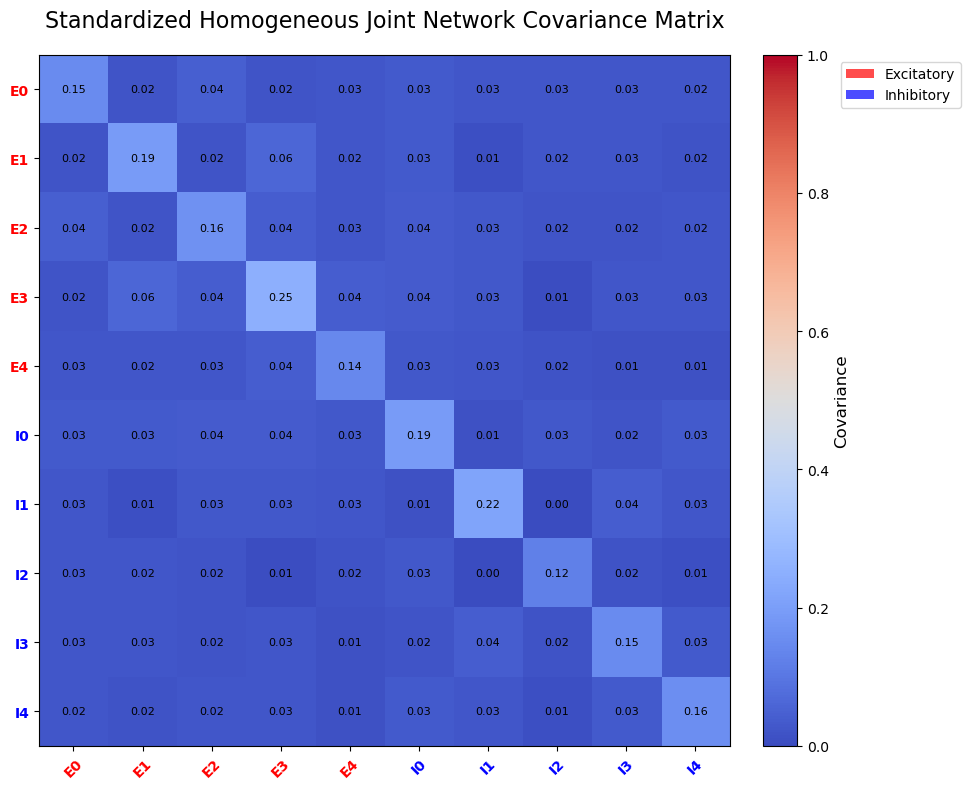

In [161]:
plot_covariance_matrix(cov_matrix_balance, normalize=False, title="Standardized Homogeneous Joint Network Covariance Matrix", cmap='coolwarm', annot=True, neuron_labels=labels)

array([[0.14830416, 0.0223548 , 0.04294609, 0.0212497 , 0.02483737,
        0.02664758, 0.01933284, 0.01722642, 0.02071964, 0.01522262],
       [0.0223548 , 0.1946146 , 0.02245526, 0.06076737, 0.0252464 ,
        0.02679695, 0.00139469, 0.01280569, 0.01857831, 0.01304698],
       [0.04294609, 0.02245526, 0.16635834, 0.03984781, 0.02659284,
        0.03218472, 0.02246758, 0.01468349, 0.01535581, 0.01555042],
       [0.0212497 , 0.06076737, 0.03984781, 0.24798588, 0.04344012,
        0.02981132, 0.02589664, 0.00376766, 0.02337796, 0.0234167 ],
       [0.02483737, 0.0252464 , 0.02659284, 0.04344012, 0.14271493,
        0.01645658, 0.01972763, 0.00951973, 0.00866394, 0.00594298],
       [0.02664758, 0.02679695, 0.03218472, 0.02981132, 0.01645658,
        0.18134546, 0.01255011, 0.02890918, 0.02217872, 0.03324361],
       [0.01933284, 0.00139469, 0.02246758, 0.02589664, 0.01972763,
        0.01255011, 0.21436309, 0.00400624, 0.04100087, 0.02686983],
       [0.01722642, 0.01280569, 0.0146834

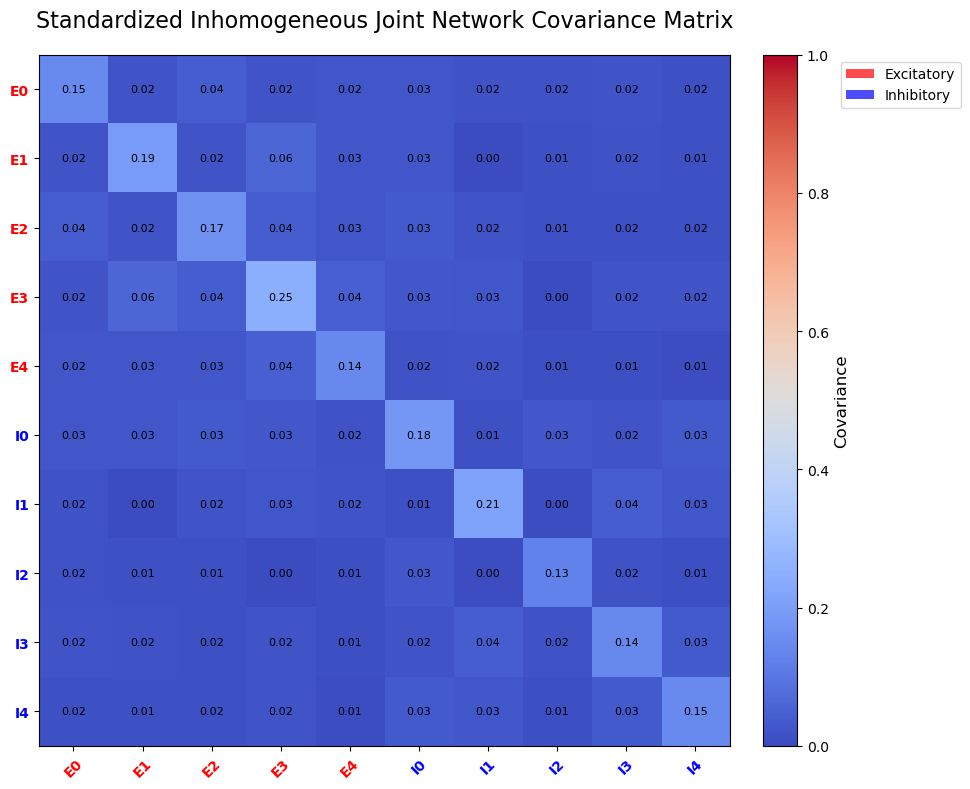

In [162]:
plot_covariance_matrix(cov_matrix_balance_emp, normalize=False, title="Standardized Inhomogeneous Joint Network Covariance Matrix", cmap='coolwarm', annot=True, neuron_labels=labels_emp)

In [163]:
#interleaved_data, int_labels, int_types = create_interleaved_ei_dataset(reshaped_stands_ex, reshaped_stands_in, n_neurons_each=5)
#print(f"\nInterleaved dataset shape: {interleaved_data.shape}")
#print(f"Neuron labels: {int_labels}")
#print(f"Neuron types: {int_types}")

#interleaved_data_emp, int_labels_emp, int_types_emp = create_interleaved_ei_dataset(reshaped_stands_ex_emp, reshaped_stands_in_emp, n_neurons_each=5)
#print(f"\nInterleaved Empirical dataset shape: {interleaved_data_emp.shape}")
#print(f"Neuron Empirical labels: {int_labels_emp}")
#print(f"Neuron Empirical types: {int_types_emp}")

In [164]:
#cov_matrix_interleaved = cov_standardized_data(interleaved_data)
#cov_matrix_interleaved_emp = cov_standardized_data(interleaved_data_emp)

In [165]:
#plot_covariance_matrix(cov_matrix_interleaved, normalize=False, title="Standardized Homogeneous Interleaved Network Covariance Matrix", cmap='coolwarm', annot=True, neuron_labels=int_labels)

In [166]:
#plot_covariance_matrix(cov_matrix_interleaved_emp, normalize=False, title="Standardized Inhomogeneous Interleaved Network Covariance Matrix", cmap='coolwarm', annot=True, neuron_labels=int_labels_emp)

In [167]:
#random_data, rand_labels, rand_types = create_random_ei_dataset(reshaped_stands_ex, reshaped_stands_in, n_neurons_each=5)
#print(f"\nRandom dataset shape: {random_data.shape}")
#print(f"Neuron labels: {rand_labels}")
#print(f"Neuron types: {rand_types}")

#random_data_emp, rand_labels_emp, rand_types_emp = create_random_ei_dataset(reshaped_stands_ex_emp, reshaped_stands_in_emp, n_neurons_each=5)
#print(f"\nRandom Empirical dataset shape: {random_data_emp.shape}")
#print(f"Neuron Empirical labels: {rand_labels_emp}")
#print(f"Neuron Empirical types: {rand_types_emp}")

In [168]:
#cov_matrix_random = cov_standardized_data(random_data)
#cov_matrix_random_emp = cov_standardized_data(random_data_emp)

In [169]:
#plot_covariance_matrix(cov_matrix_random, normalize=False, title="Standardized Homogeneous Random Network Covariance Matrix", cmap='coolwarm', annot=True, neuron_labels=rand_labels)

In [170]:
#plot_covariance_matrix(cov_matrix_random_emp, normalize=False, title="Standardized Inhomogeneous Random Network Covariance Matrix", cmap='coolwarm', annot=True, neuron_labels=rand_labels_emp)

Plots of raw counts, excitatory counts, and inhibitory counts centered and standardized.

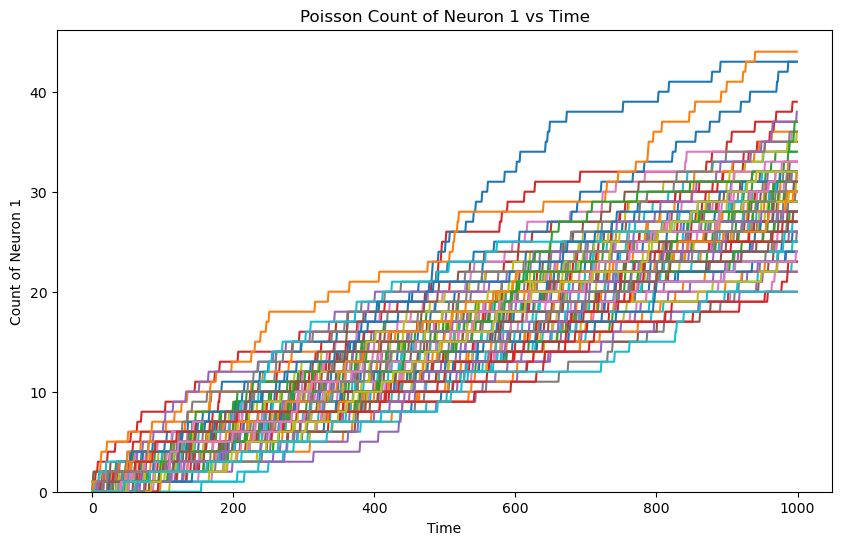

In [172]:
# plot_count_neuron1_vs_time(random_samples, num_samples = 5)
plot_count_neuron1_vs_time(count, num_samples, title = 'Poisson Count of Neuron 1 vs Time')

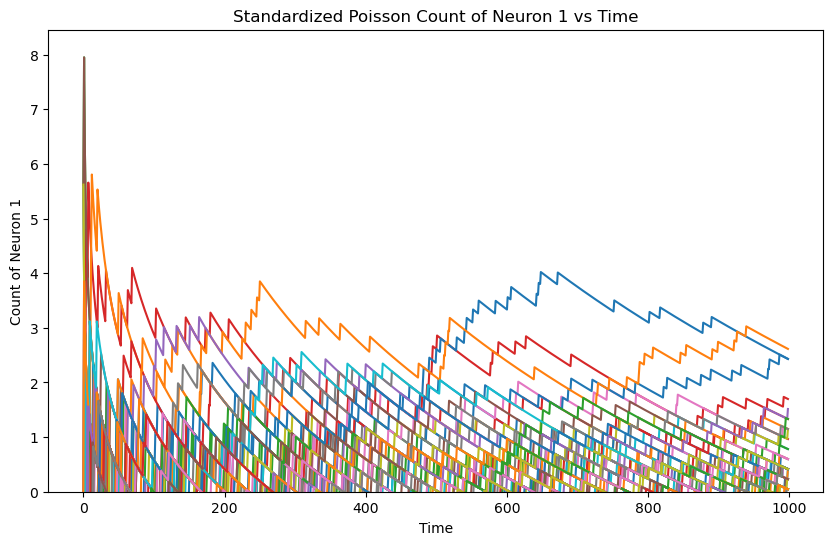

In [173]:
plot_count_neuron1_vs_time(stands, num_samples, title = 'Standardized Poisson Count of Neuron 1 vs Time')

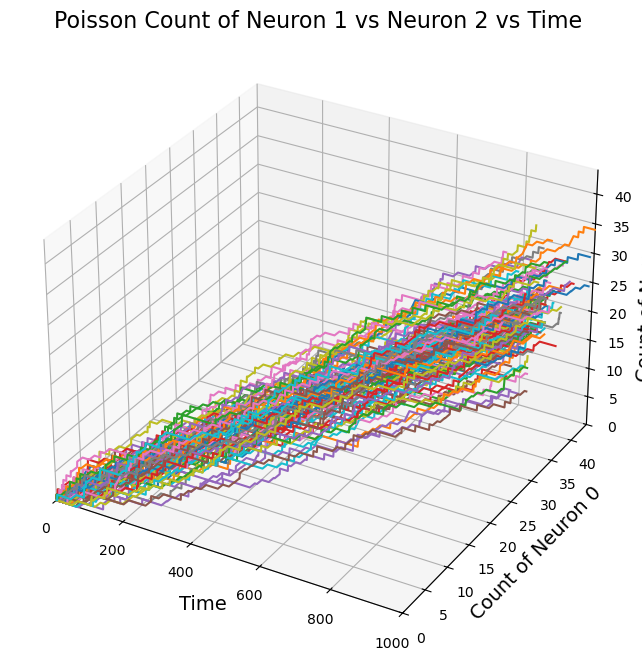

In [174]:
plot_count_neuron1_vs_neuron2_vs_time(count, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Poisson Count of Neuron 1 vs Neuron 2 vs Time' )

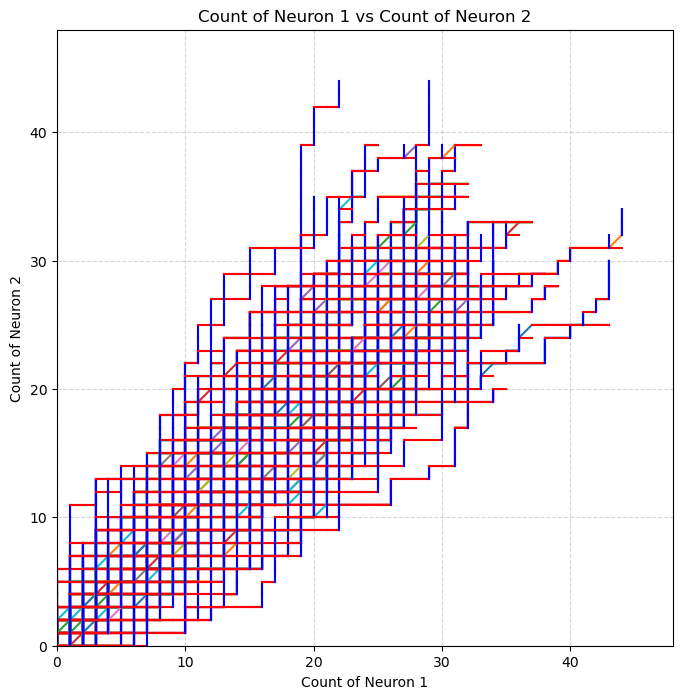

In [175]:
plot_count_neuron1_vs_count_neuron2(count, num_samples)

In [176]:
# plot_count_neuron1_vs_count_neuron2_vs_count_neuron3(count, num_samples)

In [177]:
# combined_poisson_plot(spike_train, count, theoretical_means, empirical_mean, colors=None, figsize=(12, 10))

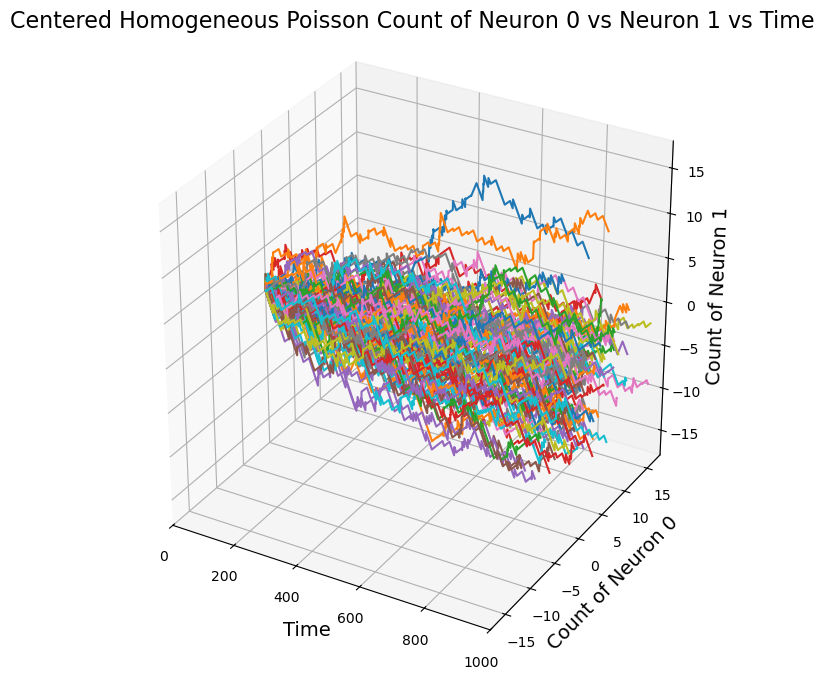

In [178]:
#plot_centered_staircase_3d(random_samples, theoretical_means, theoretical_std_dev, num_samples=5)
plot_centered_staircase_3d(count, theoretical_means, theoretical_std_dev, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Centered Homogeneous Poisson Count of Neuron 0 vs Neuron 1 vs Time' )

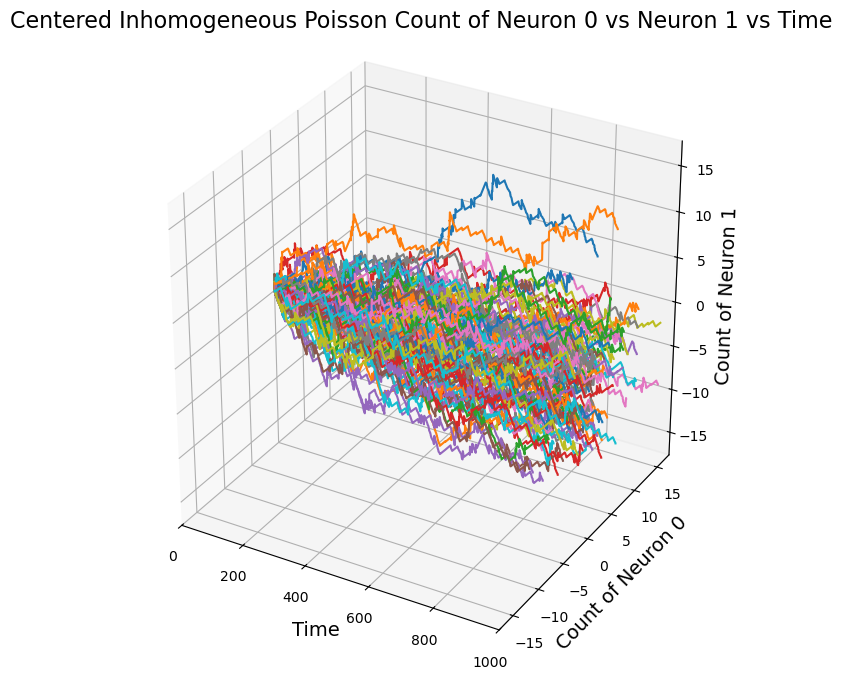

In [179]:
#plot_centered_staircase_3d(random_samples, empirical_mean, empirical_std_dev, num_samples= 5)
plot_centered_staircase_3d(count, empirical_mean, empirical_std_dev, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Centered Inhomogeneous Poisson Count of Neuron 0 vs Neuron 1 vs Time')

WARNING    C:\Users\agreg\neural_simulation_functions.py:345: RuntimeWarning: invalid value encountered in divide
  neuron1_data = (count[i][neuron1_idx] - theoretical_means[neuron1_idx]) / (theoretical_std_dev[neuron1_idx])
 [py.warnings]
WARNING    C:\Users\agreg\neural_simulation_functions.py:346: RuntimeWarning: invalid value encountered in divide
  neuron2_data = (count[i][neuron2_idx] - theoretical_means[neuron2_idx]) / (theoretical_std_dev[neuron2_idx])
 [py.warnings]
WARNING    C:\Users\agreg\neural_simulation_functions.py:345: RuntimeWarning: divide by zero encountered in divide
  neuron1_data = (count[i][neuron1_idx] - theoretical_means[neuron1_idx]) / (theoretical_std_dev[neuron1_idx])
 [py.warnings]


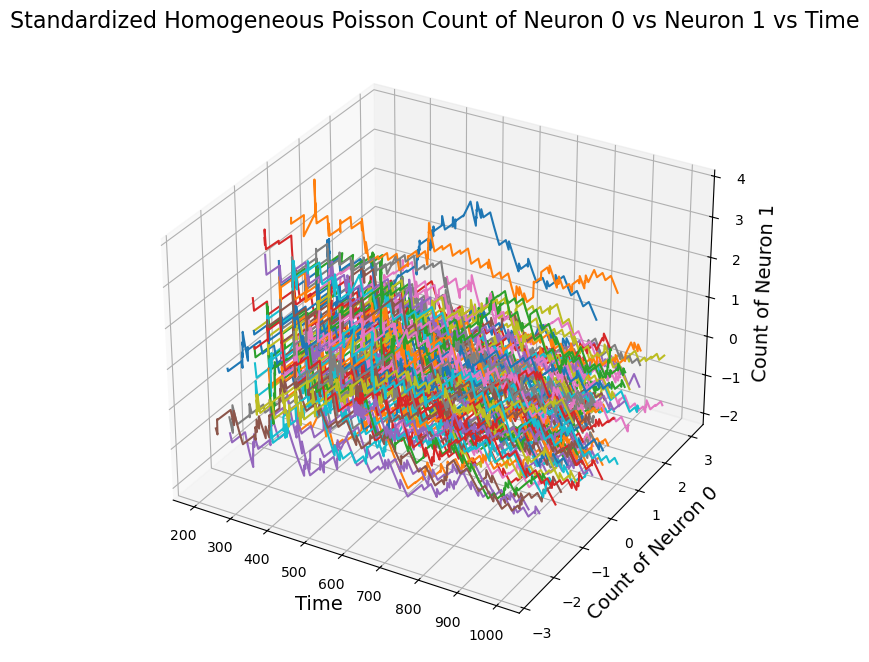

In [180]:
#plot_standardized_staircase_3d(random_samples, theoretical_means, theoretical_std_dev, t0, num_samples=5)
plot_standardized_staircase_3d(count, theoretical_means, theoretical_std_dev, t0, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Standardized Homogeneous Poisson Count of Neuron 0 vs Neuron 1 vs Time')

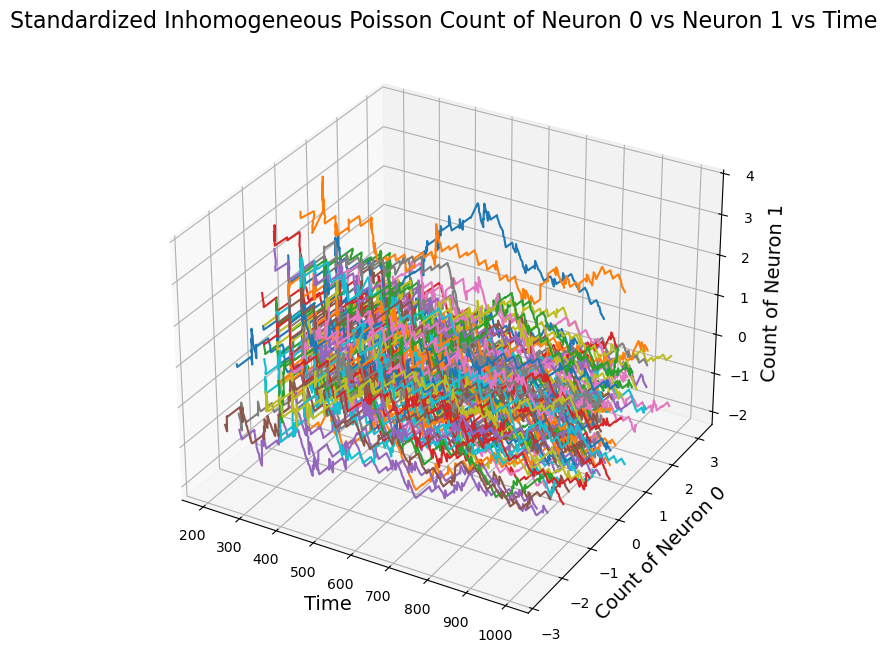

In [181]:
#plot_standardized_staircase_3d(random_samples, empirical_mean, empirical_std_dev, t0, num_samples=5)
plot_standardized_staircase_3d(count, empirical_mean, empirical_std_dev, t0, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Standardized Inhomogeneous Poisson Count of Neuron 0 vs Neuron 1 vs Time')

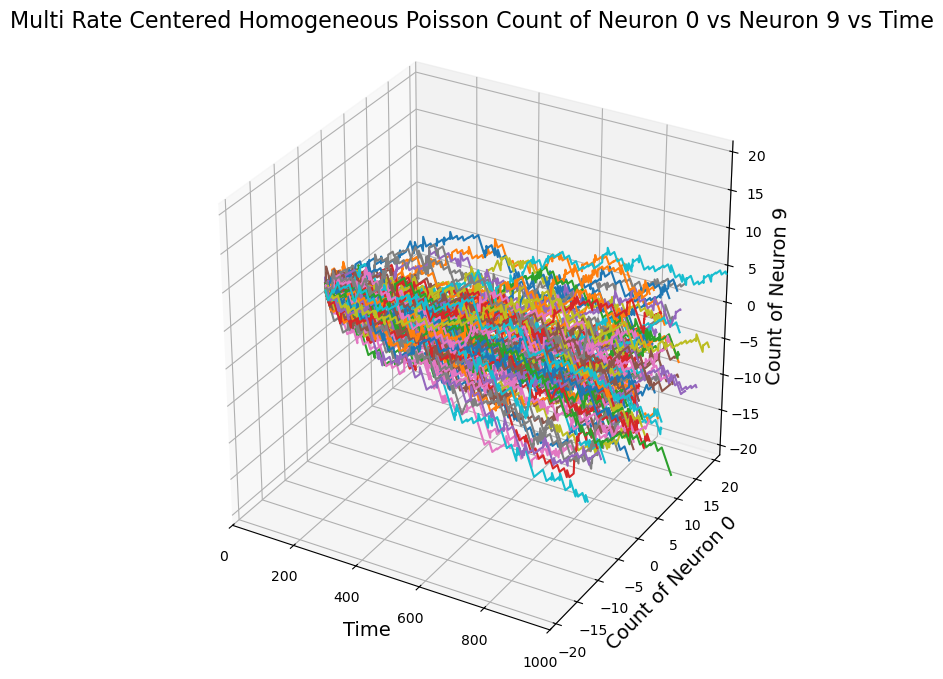

In [182]:
#plot_centered_staircase_3d(random_samples, theoretical_means, theoretical_std_dev, num_samples=5)
plot_centered_staircase_3d(multi_rate_count, multi_rate_theoretical_means, multi_rate_theoretical_std_dev, num_samples, neuron1_idx=0, neuron2_idx=9, title = 'Multi Rate Centered Homogeneous Poisson Count of Neuron 0 vs Neuron 9 vs Time' )

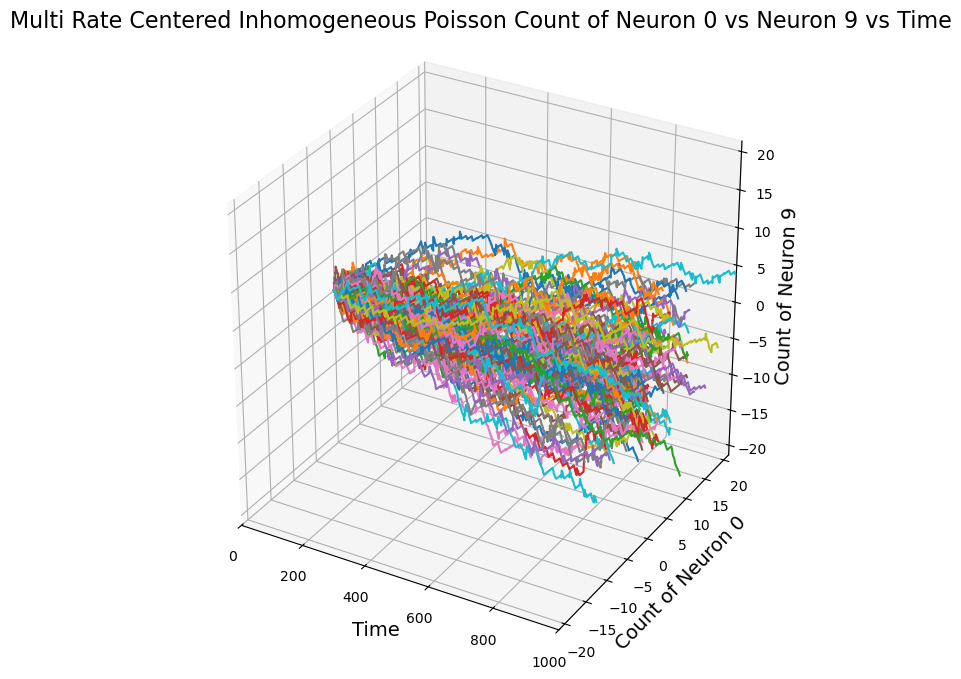

In [183]:
#plot_centered_staircase_3d(random_samples, empirical_mean, empirical_std_dev, num_samples= 5)
plot_centered_staircase_3d(multi_rate_count, multi_rate_empirical_mean, multi_rate_empirical_std_dev, num_samples, neuron1_idx=0, neuron2_idx=9, title = 'Multi Rate Centered Inhomogeneous Poisson Count of Neuron 0 vs Neuron 9 vs Time')

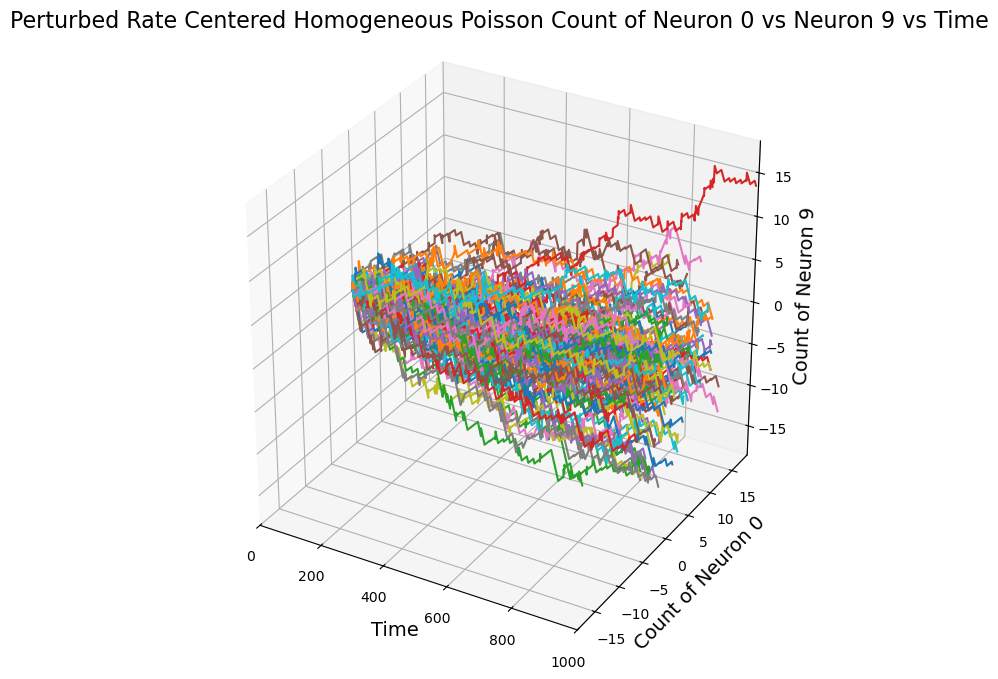

In [184]:
#plot_centered_staircase_3d(random_samples, theoretical_means, theoretical_std_dev, num_samples=5)
plot_centered_staircase_3d(perturbed_rate_count, perturbed_rate_theoretical_means, perturbed_rate_theoretical_std_dev, num_samples, neuron1_idx=0, neuron2_idx=9, title = 'Perturbed Rate Centered Homogeneous Poisson Count of Neuron 0 vs Neuron 9 vs Time' )

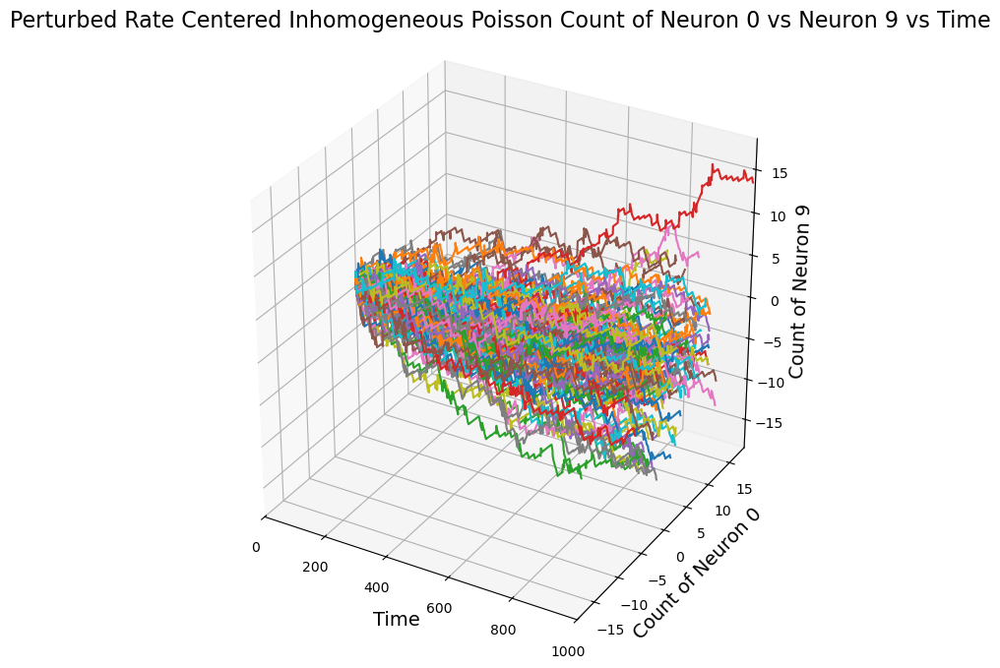

In [185]:
#plot_centered_staircase_3d(random_samples, empirical_mean, empirical_std_dev, num_samples= 5)
plot_centered_staircase_3d(perturbed_rate_count, perturbed_rate_empirical_mean, perturbed_rate_empirical_std_dev, num_samples, neuron1_idx=0, neuron2_idx=9, title = 'Perturbed Rate Centered Inhomogeneous Poisson Count of Neuron 0 vs Neuron 9 vs Time')

WARNING    C:\Users\agreg\neural_simulation_functions.py:346: RuntimeWarning: divide by zero encountered in divide
  neuron2_data = (count[i][neuron2_idx] - theoretical_means[neuron2_idx]) / (theoretical_std_dev[neuron2_idx])
 [py.warnings]


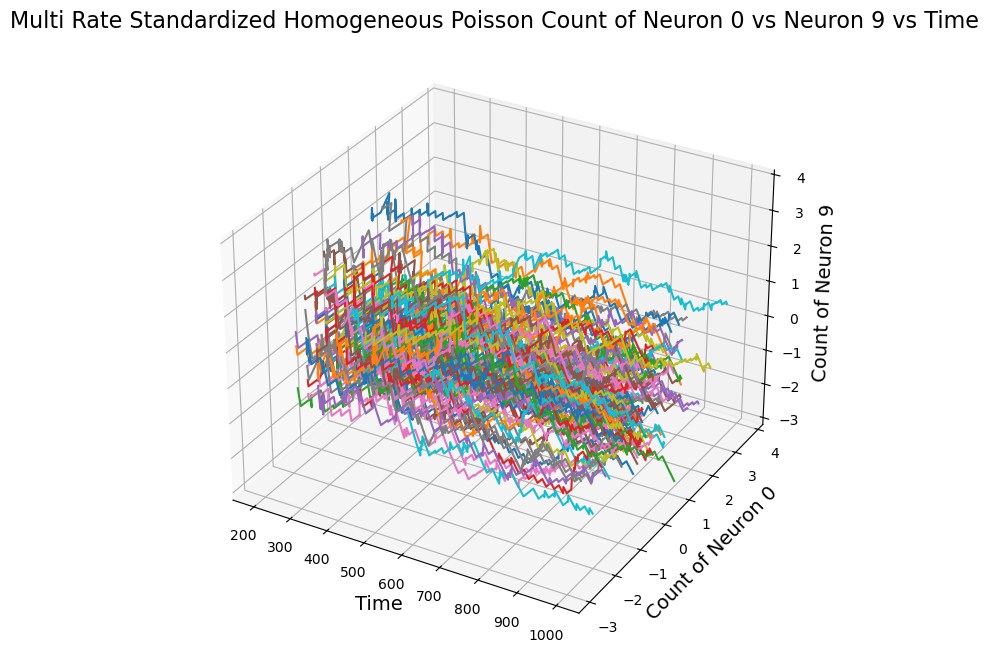

In [186]:
#plot_standardized_staircase_3d(random_samples, theoretical_means, theoretical_std_dev, t0, num_samples=5)
plot_standardized_staircase_3d(multi_rate_count, multi_rate_theoretical_means, multi_rate_theoretical_std_dev, t0, num_samples, neuron1_idx=0, neuron2_idx=9, title = 'Multi Rate Standardized Homogeneous Poisson Count of Neuron 0 vs Neuron 9 vs Time')

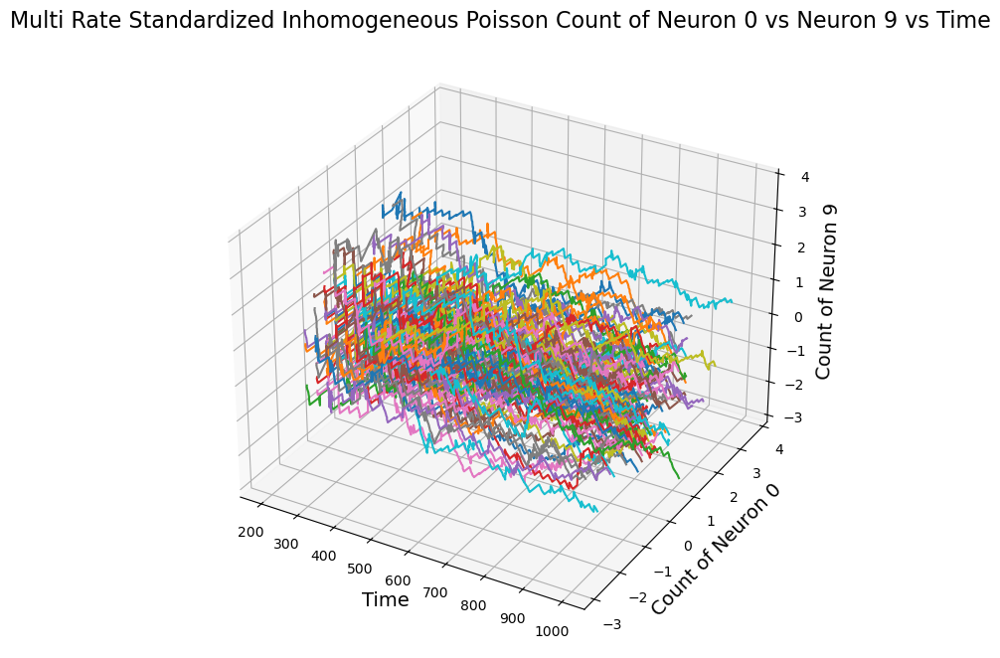

In [187]:
#plot_standardized_staircase_3d(random_samples, empirical_mean, empirical_std_dev, t0, num_samples=5)
plot_standardized_staircase_3d(multi_rate_count, multi_rate_empirical_mean, multi_rate_empirical_std_dev, t0, num_samples, neuron1_idx=0, neuron2_idx=9, title = 'Multi Rate Standardized Inhomogeneous Poisson Count of Neuron 0 vs Neuron 9 vs Time')

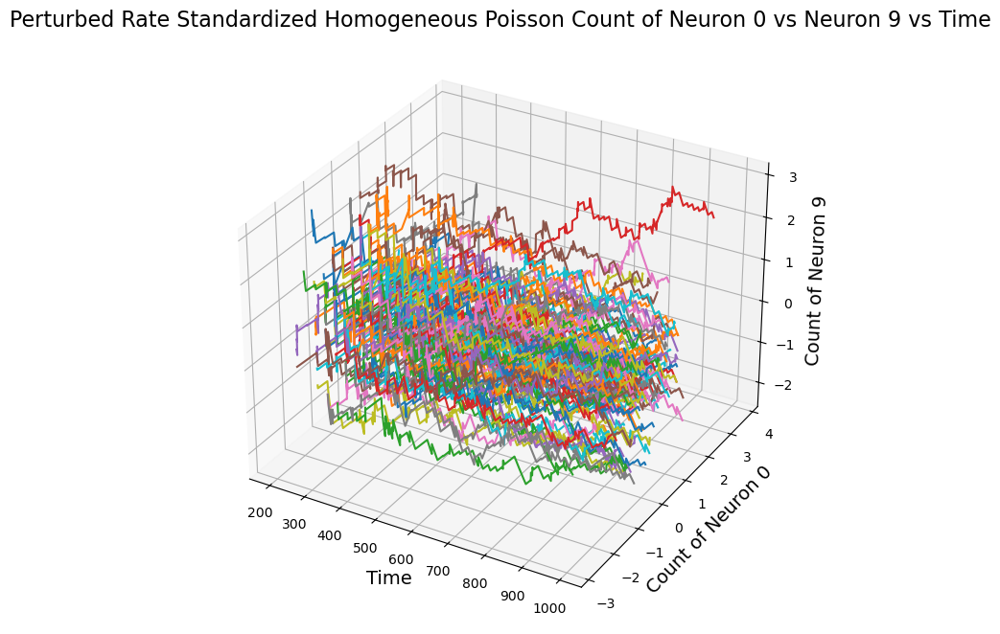

In [188]:
#plot_standardized_staircase_3d(random_samples, theoretical_means, theoretical_std_dev, t0, num_samples=5)
plot_standardized_staircase_3d(perturbed_rate_count, perturbed_rate_theoretical_means, perturbed_rate_theoretical_std_dev, t0, num_samples, neuron1_idx=0, neuron2_idx=9, title = 'Perturbed Rate Standardized Homogeneous Poisson Count of Neuron 0 vs Neuron 9 vs Time')

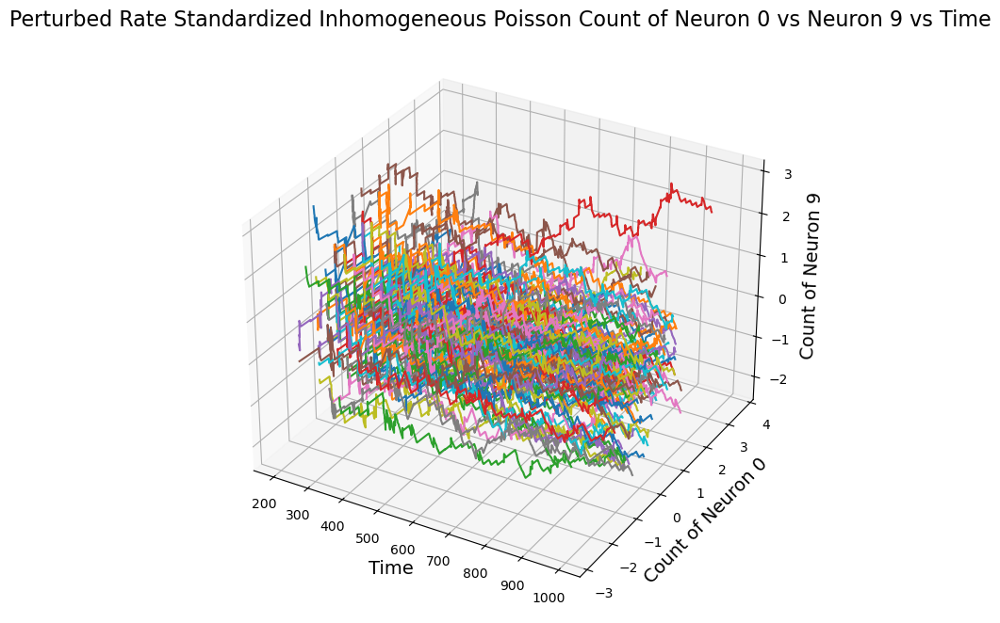

In [189]:
#plot_standardized_staircase_3d(random_samples, empirical_mean, empirical_std_dev, t0, num_samples=5)
plot_standardized_staircase_3d(perturbed_rate_count, perturbed_rate_empirical_mean, perturbed_rate_empirical_std_dev, t0, num_samples, neuron1_idx=0, neuron2_idx=9, title = 'Perturbed Rate Standardized Inhomogeneous Poisson Count of Neuron 0 vs Neuron 9 vs Time')

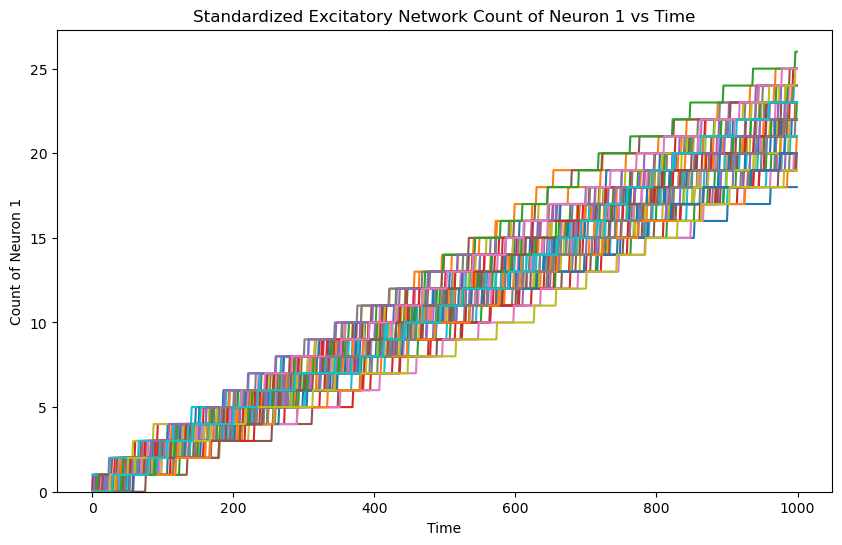

In [190]:
#plot_count_neuron1_vs_time(random_samples_ex, num_samples = 5)
plot_count_neuron1_vs_time(count_ex, num_samples, title = 'Standardized Excitatory Network Count of Neuron 1 vs Time')

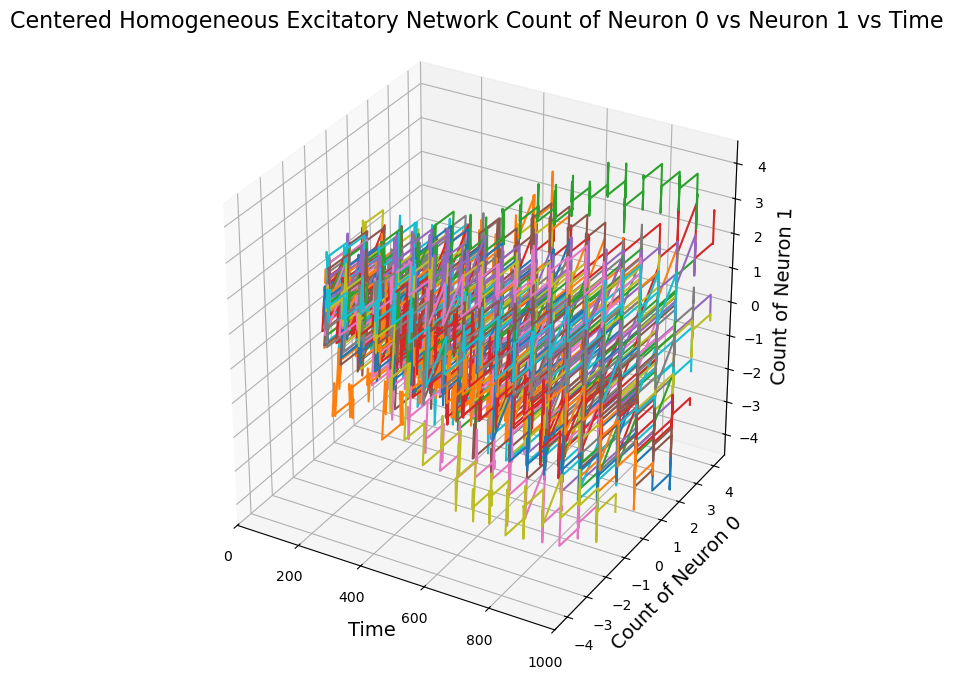

In [191]:
#plot_centered_staircase_3d(random_samples_ex, theoretical_means_sim_ex, theoretical_std_dev_sim_ex, num_samples= 5)
plot_centered_staircase_3d(count_ex, theoretical_means_sim_ex, theoretical_std_dev_sim_ex, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Centered Homogeneous Excitatory Network Count of Neuron 0 vs Neuron 1 vs Time')

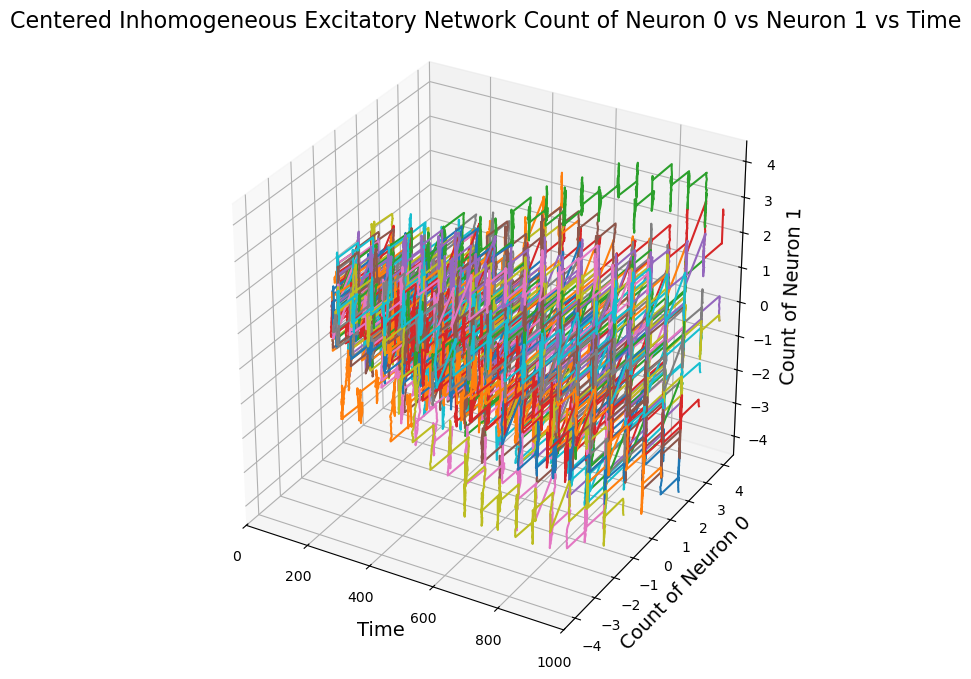

In [192]:
#plot_centered_staircase_3d(random_samples_ex, empirical_mean_ex, empirical_std_dev_ex, num_samples= 5)
plot_centered_staircase_3d(count_ex, empirical_mean_ex, empirical_std_dev_ex, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Centered Inhomogeneous Excitatory Network Count of Neuron 0 vs Neuron 1 vs Time')

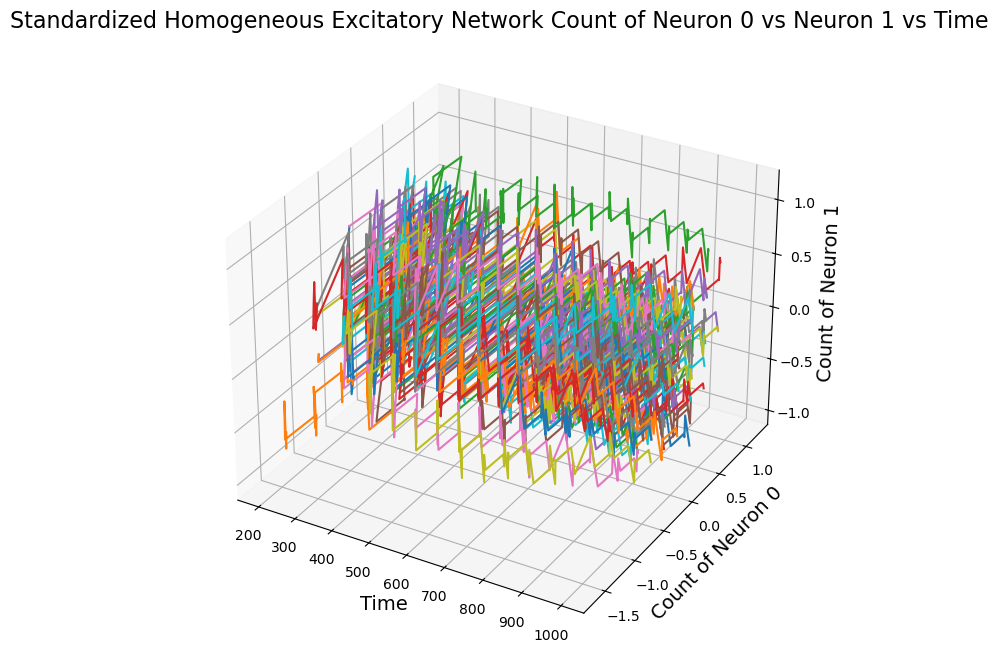

In [193]:
#plot_standardized_staircase_3d(random_samples_ex, theoretical_means_sim_ex, theoretical_std_dev_sim_ex, t0, num_samples=5)
plot_standardized_staircase_3d(count_ex, theoretical_means_sim_ex, theoretical_std_dev_sim_ex, t0, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Standardized Homogeneous Excitatory Network Count of Neuron 0 vs Neuron 1 vs Time')

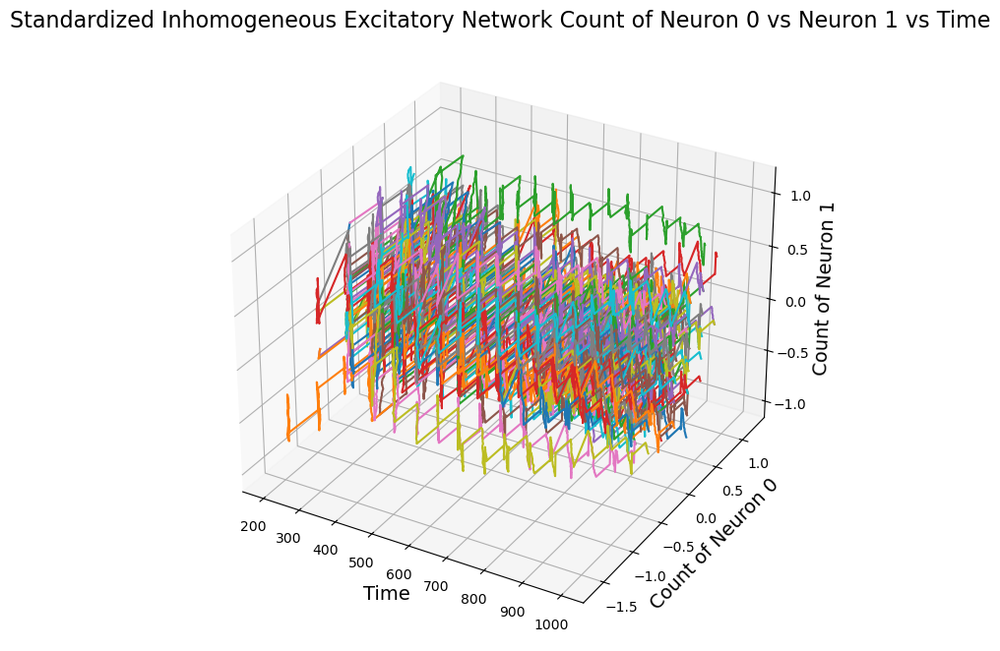

In [194]:
#plot_standardized_staircase_3d(random_samples_ex, empirical_mean_ex, empirical_std_dev_ex, t0, num_samples=5)
plot_standardized_staircase_3d(count_ex, empirical_mean_ex, empirical_std_dev_ex, t0, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Standardized Inhomogeneous Excitatory Network Count of Neuron 0 vs Neuron 1 vs Time')

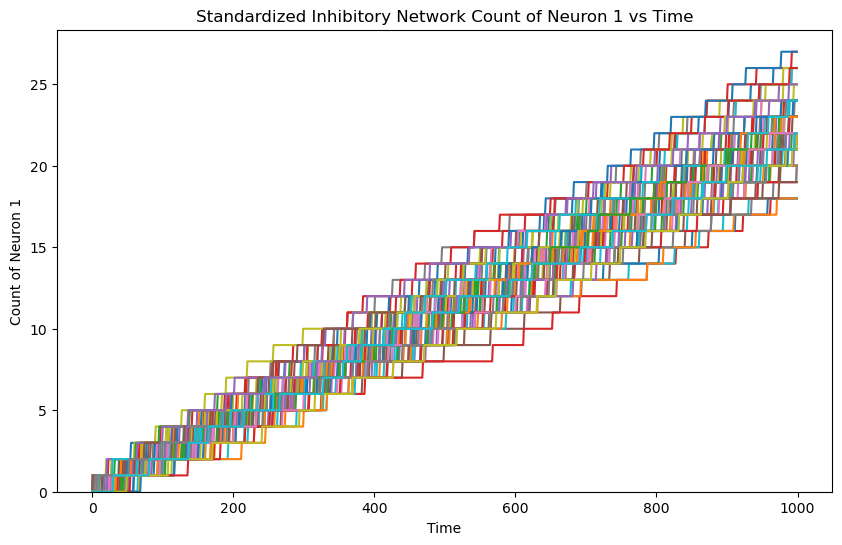

In [195]:
#plot_count_neuron1_vs_time(random_samples_in, num_samples = 5)
plot_count_neuron1_vs_time(count_in, num_samples, title = 'Standardized Inhibitory Network Count of Neuron 1 vs Time')

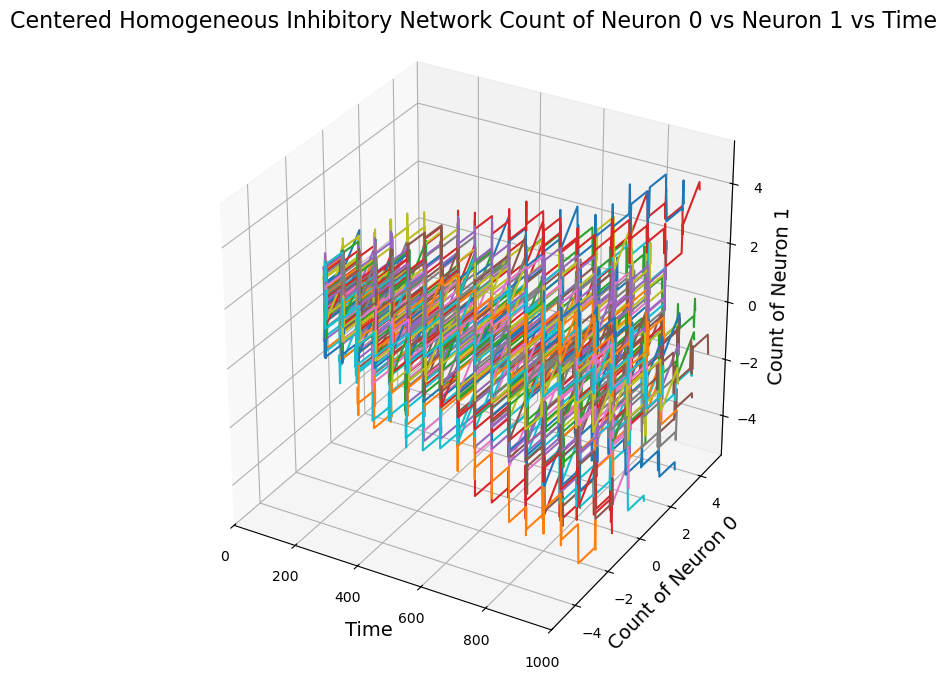

In [196]:
#plot_centered_staircase_3d(random_samples_in, theoretical_means_sim_in, theoretical_std_dev_sim_in, num_samples= 5)
plot_centered_staircase_3d(count_in, theoretical_means_sim_in, theoretical_std_dev_sim_in, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Centered Homogeneous Inhibitory Network Count of Neuron 0 vs Neuron 1 vs Time')

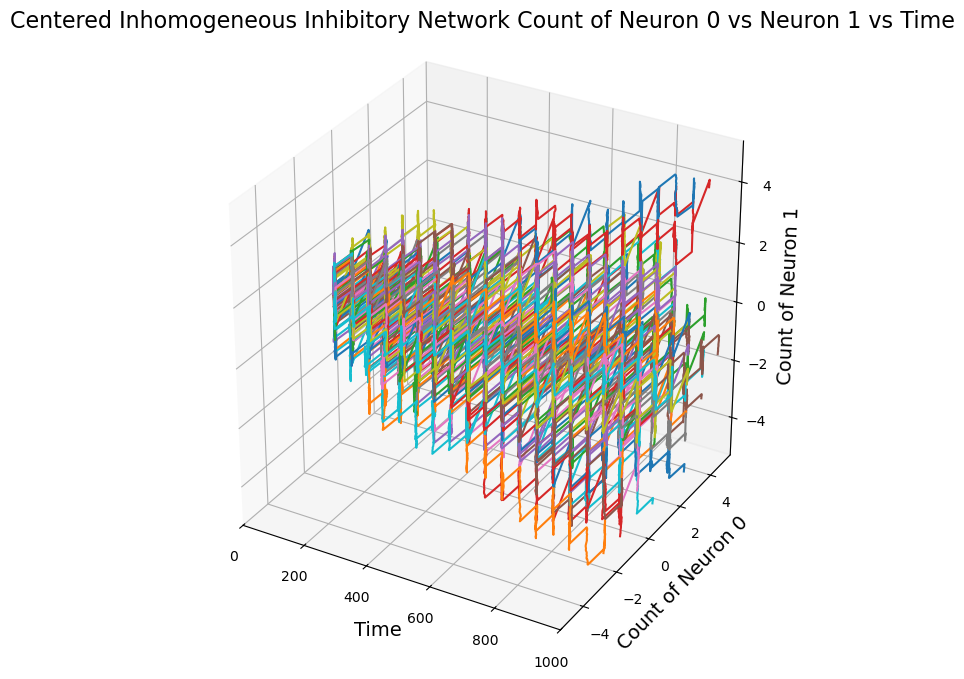

In [197]:
#plot_centered_staircase_3d(random_samples_in, empirical_mean_in, empirical_std_dev_in, num_samples= 5)
plot_centered_staircase_3d(count_in, empirical_mean_in, empirical_std_dev_in, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Centered Inhomogeneous Inhibitory Network Count of Neuron 0 vs Neuron 1 vs Time')

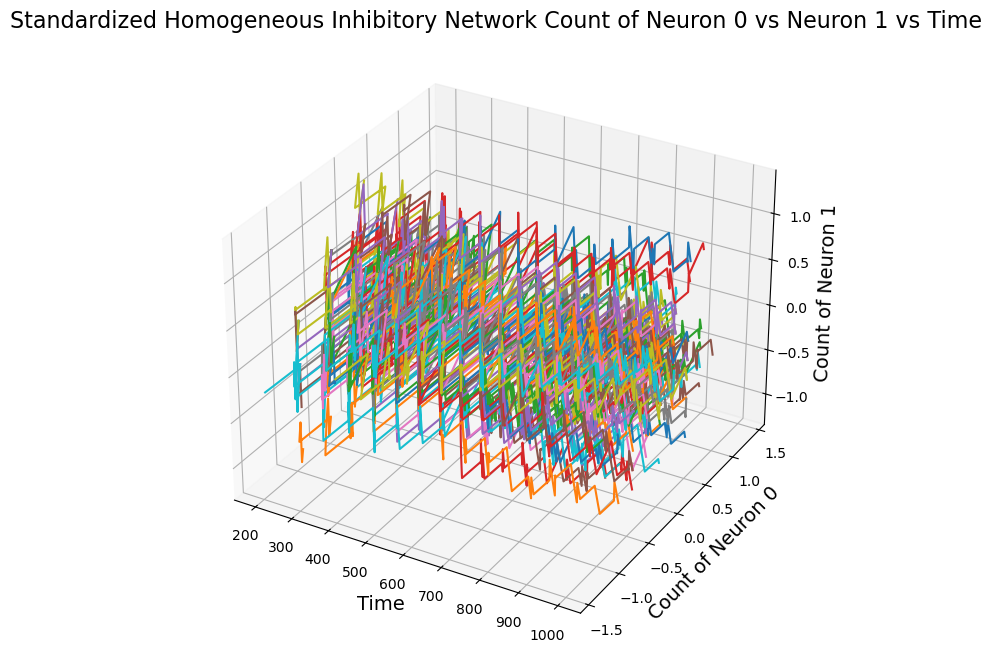

In [198]:
#plot_standardized_staircase_3d(random_samples_in, theoretical_means_sim_in, theoretical_std_dev_sim_in, t0, num_samples=5)
plot_standardized_staircase_3d(count_in, theoretical_means_sim_in, theoretical_std_dev_sim_in, t0, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Standardized Homogeneous Inhibitory Network Count of Neuron 0 vs Neuron 1 vs Time')

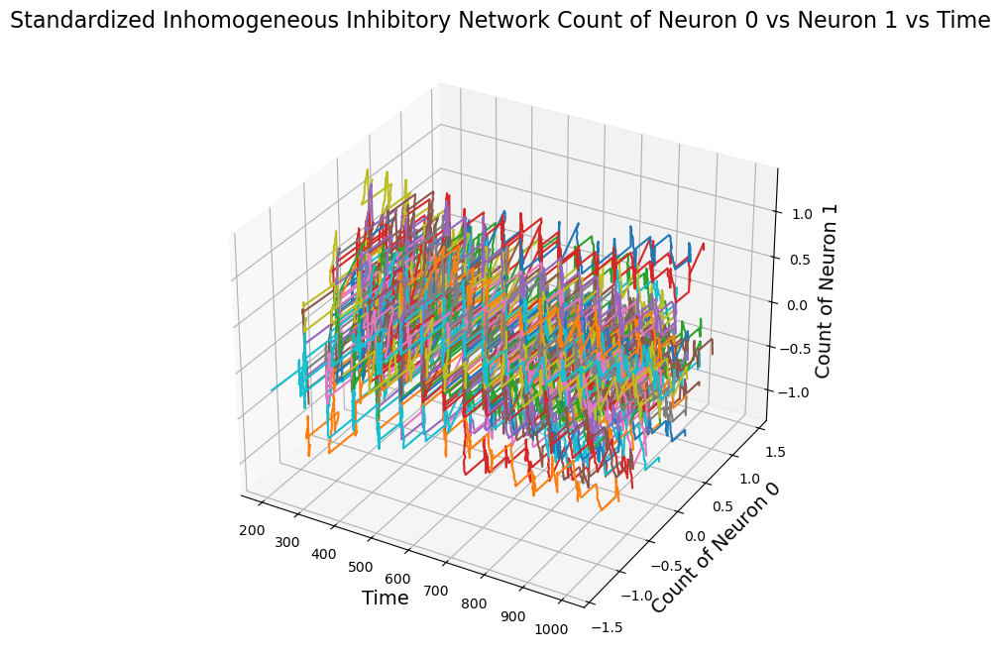

In [199]:
#plot_standardized_staircase_3d(random_samples_in, empirical_mean_in, empirical_std_dev_in, t0, num_samples=5)
plot_standardized_staircase_3d(count_in, empirical_mean_in, empirical_std_dev_in, t0, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Standardized Inhomogeneous Inhibitory Network Count of Neuron 0 vs Neuron 1 vs Time')

(<Figure size 1200x700 with 2 Axes>,
 <Axes: title={'center': 'Standardized Poisson Count with Mean and Standard Deviation'}, xlabel='Time', ylabel='Statistical Values'>,
 <Axes: ylabel='Standardized Count'>)

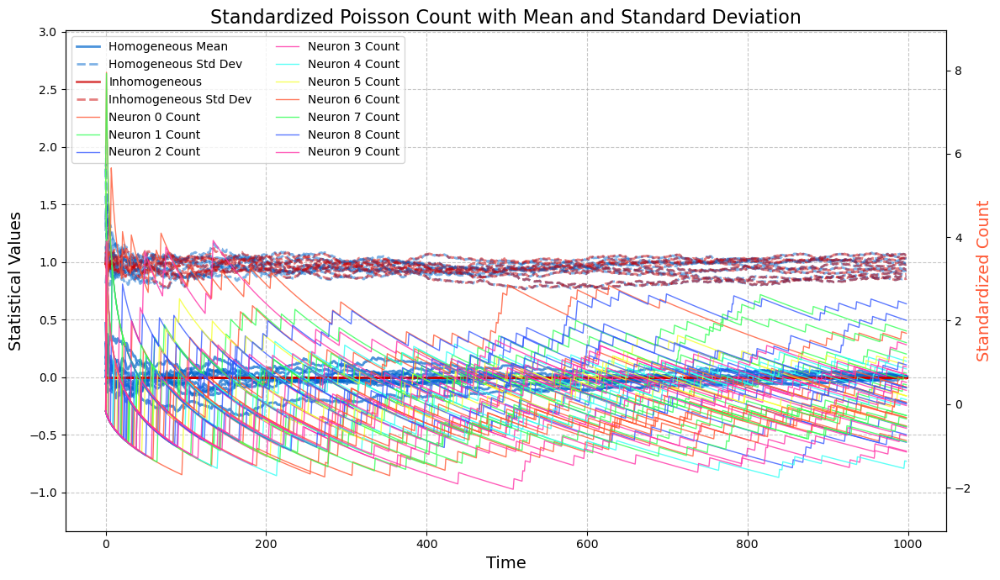

In [200]:
data_plot(stands, num_samples, standardized_mean, standardized_mean_emp, 
              standardized_std, standardized_std_emp, num_neurons, title= 'Standardized Poisson Count with Mean and Standard Deviation',
              figsize=(12, 7), max_samples_to_show=5)

(<Figure size 1200x700 with 2 Axes>,
 <Axes: title={'center': 'Standardized Exctitatory Count with Mean and Standard Deviation'}, xlabel='Time', ylabel='Statistical Values'>,
 <Axes: ylabel='Standardized Count'>)

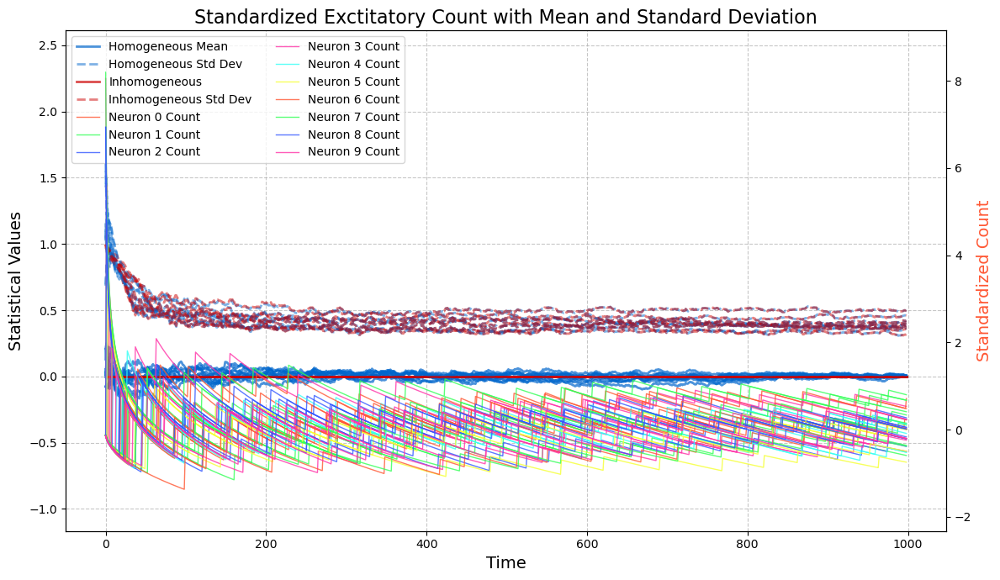

In [201]:
data_plot(stands_ex, num_samples, standardized_mean_ex, standardized_mean_ex_emp, 
              standardized_std_ex, standardized_std_ex_emp, num_neurons, title='Standardized Exctitatory Count with Mean and Standard Deviation',
              figsize=(12, 7), max_samples_to_show=5)

(<Figure size 1200x700 with 2 Axes>,
 <Axes: title={'center': 'Standardized Inhibitory Count with Mean and Standard Deviation'}, xlabel='Time', ylabel='Statistical Values'>,
 <Axes: ylabel='Standardized Count'>)

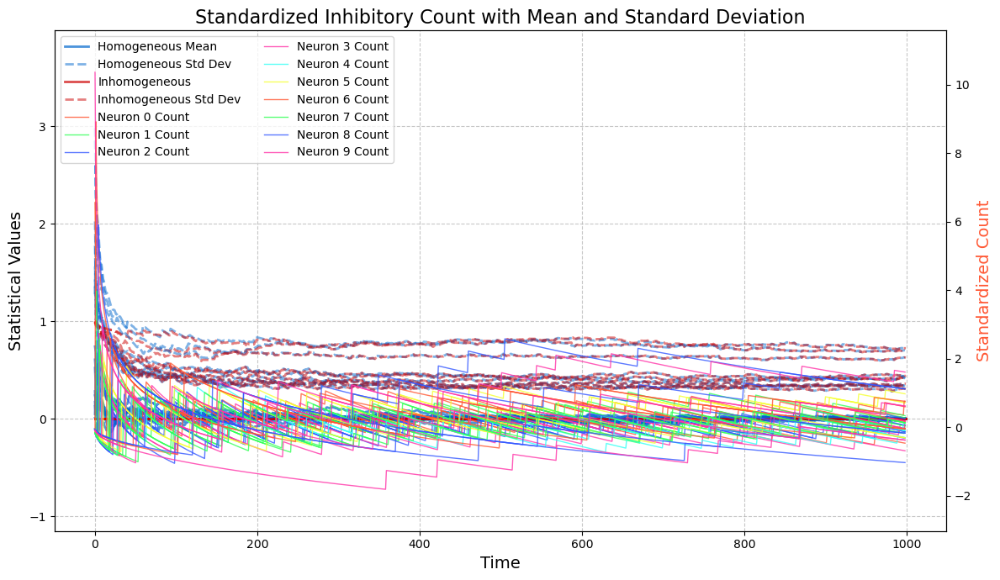

In [202]:
data_plot(stands_in, num_samples, standardized_mean_in, standardized_mean_in_emp, 
              standardized_std_in, standardized_std_in_emp, num_neurons, title='Standardized Inhibitory Count with Mean and Standard Deviation',
              figsize=(12, 7), max_samples_to_show=5)